# Setting up Paths

In [5]:
#path to the data
pathCOMPASOutput = '/Volumes/Andromeda/DATA/AllDCO_bugfix/fiducial/'



# Imports

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import h5py as h5
import pandas as pd
import matplotlib.colors as colors
import sys
#Quick fudge to make import from ../Scripts work
import sys
sys.path.append('/Users/floorbroekgaarden/Projects/BHNS_project/Scripts')




# Custom Imports from COMPASrepo

In [8]:
import ClassFormationChannels as FC 
import ClassCosmicIntegrator  as CI #Given settings and redshifts returns rates (2D arrays) Loads the data
import coencodeVarious        as CV

from PostProcessingScripts import *

from ClassFormationChannels_5mainchannels import * 

* [BHNS run DATA](#BHNS-data)
* [BHBH run DATA](#BHBH-data)
* [NSNS run DATA](#NSNS-data)
# * [Make Rates plot](#rates-plot)

# combined plot 6 panel

In [4]:
# # from https://stackoverflow.com/questions/21844024/weighted-percentile-using-numpy


# def weighted_quantile(values, quantiles, sample_weight=None, 
#                       values_sorted=False, old_style=False):
#     """ Very close to numpy.percentile, but supports weights.
#     NOTE: quantiles should be in [0, 1]!
#     :param values: numpy.array with data
#     :param quantiles: array-like with many quantiles needed
#     :param sample_weight: array-like of the same length as `array`
#     :param values_sorted: bool, if True, then will avoid sorting of
#         initial array
#     :param old_style: if True, will correct output to be consistent
#         with numpy.percentile.
#     :return: numpy.array with computed quantiles.
#     """
#     values = np.array(values)
#     quantiles = np.array(quantiles)
#     if sample_weight is None:
#         sample_weight = np.ones(len(values))
#     sample_weight = np.array(sample_weight)
#     assert np.all(quantiles >= 0) and np.all(quantiles <= 1), \
#         'quantiles should be in [0, 1]'

#     if not values_sorted:
#         sorter = np.argsort(values)
#         values = values[sorter]
#         sample_weight = sample_weight[sorter]

#     weighted_quantiles = np.cumsum(sample_weight) - 0.5 * sample_weight
#     if old_style:
#         # To be convenient with numpy.percentile
#         weighted_quantiles -= weighted_quantiles[0]
#         weighted_quantiles /= weighted_quantiles[-1]
#     else:
#         weighted_quantiles /= np.sum(sample_weight)
#     return np.interp(quantiles, weighted_quantiles, values)

In [5]:
# from scipy.spatial.distance import cdist

# class gaussian_kde(object):
#     """Representation of a kernel-density estimate using Gaussian kernels.

#     Kernel density estimation is a way to estimate the probability density
#     function (PDF) of a random variable in a non-parametric way.
#     `gaussian_kde` works for both uni-variate and multi-variate data.   It
#     includes automatic bandwidth determination.  The estimation works best for
#     a unimodal distribution; bimodal or multi-modal distributions tend to be
#     oversmoothed.

#     Parameters
#     ----------
#     dataset : array_like
#         Datapoints to estimate from. In case of univariate data this is a 1-D
#         array, otherwise a 2-D array with shape (# of dims, # of data).
#     bw_method : str, scalar or callable, optional
#         The method used to calculate the estimator bandwidth.  This can be
#         'scott', 'silverman', a scalar constant or a callable.  If a scalar,
#         this will be used directly as `kde.factor`.  If a callable, it should
#         take a `gaussian_kde` instance as only parameter and return a scalar.
#         If None (default), 'scott' is used.  See Notes for more details.
#     weights : array_like, shape (n, ), optional, default: None
#         An array of weights, of the same shape as `x`.  Each value in `x`
#         only contributes its associated weight towards the bin count
#         (instead of 1).

#     Attributes
#     ----------
#     dataset : ndarray
#         The dataset with which `gaussian_kde` was initialized.
#     d : int
#         Number of dimensions.
#     n : int
#         Number of datapoints.
#     neff : float
#         Effective sample size using Kish's approximation.
#     factor : float
#         The bandwidth factor, obtained from `kde.covariance_factor`, with which
#         the covariance matrix is multiplied.
#     covariance : ndarray
#         The covariance matrix of `dataset`, scaled by the calculated bandwidth
#         (`kde.factor`).
#     inv_cov : ndarray
#         The inverse of `covariance`.

#     Methods
#     -------
#     kde.evaluate(points) : ndarray
#         Evaluate the estimated pdf on a provided set of points.
#     kde(points) : ndarray
#         Same as kde.evaluate(points)
#     kde.pdf(points) : ndarray
#         Alias for ``kde.evaluate(points)``.
#     kde.set_bandwidth(bw_method='scott') : None
#         Computes the bandwidth, i.e. the coefficient that multiplies the data
#         covariance matrix to obtain the kernel covariance matrix.
#         .. versionadded:: 0.11.0
#     kde.covariance_factor : float
#         Computes the coefficient (`kde.factor`) that multiplies the data
#         covariance matrix to obtain the kernel covariance matrix.
#         The default is `scotts_factor`.  A subclass can overwrite this method
#         to provide a different method, or set it through a call to
#         `kde.set_bandwidth`.

#     Notes
#     -----
#     Bandwidth selection strongly influences the estimate obtained from the KDE
#     (much more so than the actual shape of the kernel).  Bandwidth selection
#     can be done by a "rule of thumb", by cross-validation, by "plug-in
#     methods" or by other means; see [3]_, [4]_ for reviews.  `gaussian_kde`
#     uses a rule of thumb, the default is Scott's Rule.

#     Scott's Rule [1]_, implemented as `scotts_factor`, is::

#         n**(-1./(d+4)),

#     with ``n`` the number of data points and ``d`` the number of dimensions.
#     Silverman's Rule [2]_, implemented as `silverman_factor`, is::

#         (n * (d + 2) / 4.)**(-1. / (d + 4)).

#     Good general descriptions of kernel density estimation can be found in [1]_
#     and [2]_, the mathematics for this multi-dimensional implementation can be
#     found in [1]_.

#     References
#     ----------
#     .. [1] D.W. Scott, "Multivariate Density Estimation: Theory, Practice, and
#            Visualization", John Wiley & Sons, New York, Chicester, 1992.
#     .. [2] B.W. Silverman, "Density Estimation for Statistics and Data
#            Analysis", Vol. 26, Monographs on Statistics and Applied Probability,
#            Chapman and Hall, London, 1986.
#     .. [3] B.A. Turlach, "Bandwidth Selection in Kernel Density Estimation: A
#            Review", CORE and Institut de Statistique, Vol. 19, pp. 1-33, 1993.
#     .. [4] D.M. Bashtannyk and R.J. Hyndman, "Bandwidth selection for kernel
#            conditional density estimation", Computational Statistics & Data
#            Analysis, Vol. 36, pp. 279-298, 2001.

#     Examples
#     --------
#     Generate some random two-dimensional data:

#     >>> from scipy import stats
#     >>> def measure(n):
#     >>>     "Measurement model, return two coupled measurements."
#     >>>     m1 = np.random.normal(size=n)
#     >>>     m2 = np.random.normal(scale=0.5, size=n)
#     >>>     return m1+m2, m1-m2

#     >>> m1, m2 = measure(2000)
#     >>> xmin = m1.min()
#     >>> xmax = m1.max()
#     >>> ymin = m2.min()
#     >>> ymax = m2.max()

#     Perform a kernel density estimate on the data:

#     >>> X, Y = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
#     >>> positions = np.vstack([X.ravel(), Y.ravel()])
#     >>> values = np.vstack([m1, m2])
#     >>> kernel = stats.gaussian_kde(values)
#     >>> Z = np.reshape(kernel(positions).T, X.shape)

#     Plot the results:

#     >>> import matplotlib.pyplot as plt
#     >>> fig = plt.figure()
#     >>> ax = fig.add_subplot(111)
#     >>> ax.imshow(np.rot90(Z), cmap=plt.cm.gist_earth_r,
#     ...           extent=[xmin, xmax, ymin, ymax])
#     >>> ax.plot(m1, m2, 'k.', markersize=2)
#     >>> ax.set_xlim([xmin, xmax])
#     >>> ax.set_ylim([ymin, ymax])
#     >>> plt.show()

#     """
#     def __init__(self, dataset, bw_method=None, weights=None):
#         self.dataset = np.atleast_2d(dataset)
#         if not self.dataset.size > 1:
#             raise ValueError("`dataset` input should have multiple elements.")
#         self.d, self.n = self.dataset.shape
            
#         if weights is not None:
#             self.weights = weights / np.sum(weights)
#         else:
#             self.weights = np.ones(self.n) / self.n
            
#         # Compute the effective sample size 
#         # http://surveyanalysis.org/wiki/Design_Effects_and_Effective_Sample_Size#Kish.27s_approximate_formula_for_computing_effective_sample_size
#         self.neff = 1.0 / np.sum(self.weights ** 2)

#         self.set_bandwidth(bw_method=bw_method)

#     def evaluate(self, points):
#         """Evaluate the estimated pdf on a set of points.

#         Parameters
#         ----------
#         points : (# of dimensions, # of points)-array
#             Alternatively, a (# of dimensions,) vector can be passed in and
#             treated as a single point.

#         Returns
#         -------
#         values : (# of points,)-array
#             The values at each point.

#         Raises
#         ------
#         ValueError : if the dimensionality of the input points is different than
#                      the dimensionality of the KDE.

#         """
#         points = np.atleast_2d(points)

#         d, m = points.shape
#         if d != self.d:
#             if d == 1 and m == self.d:
#                 # points was passed in as a row vector
#                 points = np.reshape(points, (self.d, 1))
#                 m = 1
#             else:
#                 msg = "points have dimension %s, dataset has dimension %s" % (d,
#                     self.d)
#                 raise ValueError(msg)

#         # compute the normalised residuals
#         chi2 = cdist(points.T, self.dataset.T, 'mahalanobis', VI=self.inv_cov) ** 2
#         # compute the pdf
#         result = np.sum(np.exp(-.5 * chi2) * self.weights, axis=1) / self._norm_factor

#         return result

#     __call__ = evaluate

#     def scotts_factor(self):
#         return np.power(self.neff, -1./(self.d+4))

#     def silverman_factor(self):
#         return np.power(self.neff*(self.d+2.0)/4.0, -1./(self.d+4))

#     #  Default method to calculate bandwidth, can be overwritten by subclass
#     covariance_factor = scotts_factor

#     def set_bandwidth(self, bw_method=None):
#         """Compute the estimator bandwidth with given method.

#         The new bandwidth calculated after a call to `set_bandwidth` is used
#         for subsequent evaluations of the estimated density.

#         Parameters
#         ----------
#         bw_method : str, scalar or callable, optional
#             The method used to calculate the estimator bandwidth.  This can be
#             'scott', 'silverman', a scalar constant or a callable.  If a
#             scalar, this will be used directly as `kde.factor`.  If a callable,
#             it should take a `gaussian_kde` instance as only parameter and
#             return a scalar.  If None (default), nothing happens; the current
#             `kde.covariance_factor` method is kept.

#         Notes
#         -----
#         .. versionadded:: 0.11

#         Examples
#         --------
#         >>> x1 = np.array([-7, -5, 1, 4, 5.])
#         >>> kde = stats.gaussian_kde(x1)
#         >>> xs = np.linspace(-10, 10, num=50)
#         >>> y1 = kde(xs)
#         >>> kde.set_bandwidth(bw_method='silverman')
#         >>> y2 = kde(xs)
#         >>> kde.set_bandwidth(bw_method=kde.factor / 3.)
#         >>> y3 = kde(xs)

#         >>> fig = plt.figure()
#         >>> ax = fig.add_subplot(111)
#         >>> ax.plot(x1, np.ones(x1.shape) / (4. * x1.size), 'bo',
#         ...         label='Data points (rescaled)')
#         >>> ax.plot(xs, y1, label='Scott (default)')
#         >>> ax.plot(xs, y2, label='Silverman')
#         >>> ax.plot(xs, y3, label='Const (1/3 * Silverman)')
#         >>> ax.legend()
#         >>> plt.show()

#         """
#         if bw_method is None:
#             pass
#         elif bw_method == 'scott':
#             self.covariance_factor = self.scotts_factor
#         elif bw_method == 'silverman':
#             self.covariance_factor = self.silverman_factor
#         elif np.isscalar(bw_method): # and not isinstance(bw_method, string_types):
#             self._bw_method = 'use constant'
#             self.covariance_factor = lambda: bw_method
#         elif callable(bw_method):
#             self._bw_method = bw_method
#             self.covariance_factor = lambda: self._bw_method(self)
#         else:
#             msg = "`bw_method` should be 'scott', 'silverman', a scalar " \
#                   "or a callable."
#             raise ValueError(msg)

#         self._compute_covariance()

#     def _compute_covariance(self):
#         """Computes the covariance matrix for each Gaussian kernel using
#         covariance_factor().
#         """
#         self.factor = self.covariance_factor()
#         # Cache covariance and inverse covariance of the data
#         if not hasattr(self, '_data_inv_cov'):
#             # Compute the mean and residuals
#             _mean = np.sum(self.weights * self.dataset, axis=1)
#             _residual = (self.dataset - _mean[:, None])
#             # Compute the biased covariance
#             self._data_covariance = np.atleast_2d(np.dot(_residual * self.weights, _residual.T))
#             # Correct for bias (http://en.wikipedia.org/wiki/Weighted_arithmetic_mean#Weighted_sample_covariance)
#             self._data_covariance /= (1 - np.sum(self.weights ** 2))
#             self._data_inv_cov = np.linalg.inv(self._data_covariance)

#         self.covariance = self._data_covariance * self.factor**2
#         self.inv_cov = self._data_inv_cov / self.factor**2
#         self._norm_factor = np.sqrt(np.linalg.det(2*np.pi*self.covariance)) #* self.n

        
        

# def lowess(x, y, f=2. / 3., iter=3):
#     """lowess(x, y, f=2./3., iter=3) -> yest
#     Lowess smoother: Robust locally weighted regression.
#     The lowess function fits a nonparametric regression curve to a scatterplot.
#     The arrays x and y contain an equal number of elements; each pair
#     (x[i], y[i]) defines a data point in the scatterplot. The function returns
#     the estimated (smooth) values of y.
#     The smoothing span is given by f. A larger value for f will result in a
#     smoother curve. The number of robustifying iterations is given by iter. The
#     function will run faster with a smaller number of iterations.
#     """
#     n = len(x)
#     r = int(ceil(f * n))
#     h = [np.sort(np.abs(x - x[i]))[r] for i in range(n)]
#     w = np.clip(np.abs((x[:, None] - x[None, :]) / h), 0.0, 1.0)
#     w = (1 - w ** 3) ** 3
#     yest = np.zeros(n)
#     delta = np.ones(n)
#     for iteration in range(iter):
#         for i in range(n):
#             weights = delta * w[:, i]
#             b = np.array([np.sum(weights * y), np.sum(weights * y * x)])
#             A = np.array([[np.sum(weights), np.sum(weights * x)],
#                           [np.sum(weights * x), np.sum(weights * x * x)]])
#             beta = linalg.solve(A, b)
#             yest[i] = beta[0] + beta[1] * x[i]

#         residuals = y - yest
#         s = np.median(np.abs(residuals))
#         delta = np.clip(residuals / (6.0 * s), -1, 1)
#         delta = (1 - delta ** 2) ** 2

#     return yest






In [6]:
# def plotdesigndistribution_hist(axe, xvar, bandwidth, xlabel, ylabel, xlim, ylim):
#     """ plot total mass distribution with channels """
#     groups  = dictChannelsBHNSList  

#     axes = [axe]
    
#     weightSTROOPWAFEL = Data.COMPAS.weight
    

    
#     binsM = np.linspace(min(xvar)*0.95,max(xvar)*1.1, bandwidth)
#     dM    = np.diff(binsM)
#     M     = (binsM[1:]+binsM[:-1])/2.

    

#     binpoints_x = np.zeros(2*(len(binsM)-1))
#     binpoints_y = np.zeros(2*(len(binsM)-1))
#     binpoints_x[::2] = binsM[:-1]
#     binpoints_x[1::2]= binsM[1:]    

    
#     # print len(chirp)
#     print np.shape(Data.PerSystemPerRedshift_ratesObserved)
#     weights     = np.sum(Data.PerSystemPerRedshift_ratesObserved*weightSTROOPWAFEL, axis=0)
#     print np.sum(weights)
#     print weights

# #     fig, axes = plt.subplots(1,1,figsize=(16,8))
#     yLow        = np.zeros(len(binpoints_x))
#     for nrG, group in enumerate(groups):
#         m       = xvar[channelSystems == nrG]
#         w       = weights[channelSystems == nrG]
#         percentage = np.round((np.sum(w)/float(np.sum(weights)))*100,2)
#         y, _    = np.histogram(m, bins=binsM, weights=w)
#         y       = np.divide(y, dM)

#         # remake histogram

#         binpoints_y[::2]  = y
#         binpoints_y[1::2] = y
        
  
        
        
#         ##
# #         axe.plot(binpoints_x, yLow, yLow+binpoints_y, color=colorlist[nrG])
#         axe.fill_between(binpoints_x, yLow, yLow+binpoints_y, facecolor=colorlist[nrG], alpha=0.8)#,\
# #                           label=dictChannelsBHNSListBolt[nrG]+' '+str(percentage)+'\%')
#         yLow   += binpoints_y
        
#     axe.plot(binpoints_x,  yLow+binpoints_y, color='k', linewidth=5)
#     ### PLOT CDF on right axes ###
#     ax2y = axe.twinx()

#     # label / tick settings
#     cdfcolor = 'red'
#     ylabel2 = 'CDF'

#     ax2y.set_ylim(0,1)
#     ax2y.tick_params(labelsize=fs, colors=cdfcolor)
#     ax2y.set_ylabel(ylabel2, fontsize=fs, color=cdfcolor)       
    
#     # plot cdf:
#     ax2y.hist(xvar, normed=True, bins=len(xvar), cumulative=True, label=None,
#          histtype='step', alpha=1, color=cdfcolor, linewidth=3, linestyle='-.', zorder=10, weights=weights)    
    
#     ###########
#     if xlim:
#         axe.set_xlim(xlim[0], xlim[1])
#     if ylim:
#         axe.set_ylim(ylim[0], ylim[1])

#     axe == CV.layoutAxes(axe, nameX=xlabel, nameY=ylabel)


#     axe.grid(True)

In [7]:
print(dictChannelsBBHList )

['classic', 'stable B no CEE', 'immediate CE', 'double-core CE', 'other']


In [40]:
def plotdesigndistribution(axe, Data, xvar, bandwidth, xvarrange, xlabel, ylabel, xlim, ylim, whichWeight, channelSystems, indplot):
    """ plot total mass distribution with channels 
    input:
    
    axe = the axis to plot it on
    xvar= the array of data that you want to plot the kde of
    bw_method = bandwith method of the kernel density function you want to use (see class gaussian_kde())
    xvarrange, the x-axis range to use for the kde [should be typically slightly larger than the range of xvar]
    xlabel, ylabel = x and y labels of the plot
    xlim, ylim = xlim and ylim of the plot axis 
    indplot = something I use to hack the legend labels (I only want to plot the legends for some subplots)
    whichWeight = 'intrinsic' 'observed'
    you can just put indplot=0 or indplot=1 to get labels or no labels resp. 
    
    """
    dictList=dictChannelsBHNSList

    axes = [axe]
    
    weightSTROOPWAFEL = Data.COMPAS.weight
    
   
    
    
    # MAKE MAIN DISTRIBUTION PLOT
    res_kde =1000 # resolution kde, just the nr of interpolation points (so this is not the bandwith). 
    if xvarrange:
        binsM = np.linspace(xvarrange[0], xvarrange[1], res_kde)
    else:
        binsM =np.linspace(min(xvar)*0.9, 1.1*max(xvar), res_kde)
    dM    = np.diff(binsM)
    M     = (binsM[1:]+binsM[:-1])/2.

    
    # decide what weighting we are interested in:
    if whichWeight == 'intrinsic': # formation rate at redshift 0
        weights     = (Data.PerSystemPerRedshift_ratesIntrinsic[0,:]*weightSTROOPWAFEL)
    elif whichWeight == 'observed': # detectable rate weights for GW observations
        weights     = np.sum(Data.PerSystemPerRedshift_ratesObserved*weightSTROOPWAFEL, axis=0)

    totalweight = 0

    
    

        
    #### 
    
    

    xx_boot = np.linspace(min(xvar)*0.8,max(xvar)*1.2, 100)
    yLow        = np.zeros(len(xx_boot))

    for nrC, Channel in enumerate(dictList):
    
    #   #Get the seeds that relate to sorted indices
        seedsInterest = dictRank[Channel] 
        maskSeedsInterest = np.in1d(Data.COMPAS.seeds, seedsInterest)
    
        
#     for nrG, group in enumerate(groups):
        # only if the channel group is present do plotting:
        if len(xvar[maskSeedsInterest]):
            m       = xvar[maskSeedsInterest]
            w       = weights[maskSeedsInterest]
            print('percentage=',((np.sum(w)/float(np.sum(weights)))*100))
            percentage = np.round((np.sum(w)/float(np.sum(weights)))*100,6)
            y, _    = np.histogram(m, bins=binsM, weights=w)
            y       = np.divide(y, dM)

            # remake histogram


            totalweight += np.sum(w)
            totalweight_nrG = np.sum(w)
            ##

            KDE = gaussian_kde(m, weights=w, bw_method = bandwidth)
            y_boot = KDE(xx_boot)


            ##
            if indplot==0:
                LABEL = dictChannelsBHNSListBolt[nrC]+' '+r'$%s$'%str((roundAndFormat1(percentage))) + str(r'\%')
                print(LABEL)
            else:
                LABEL = None


            axe.fill_between(xx_boot, yLow, yLow+(y_boot*totalweight_nrG), facecolor=colorlist[nrC], \
                             alpha=1, label=LABEL, zorder=200)#,\
    #                           label=)
            yLow   +=y_boot*totalweight_nrG
    
 
    axe.plot(xx_boot,  (yLow), color='k', linewidth=5, zorder=200)
    
    
    ### for mass ratio plot second y-axis:
    if indplot==2:
        ax2x = axe.twiny()
        xlabel2 = r'$1/q$'
        
        maxq2x = 1/xlim[0]
        minq2x = 1/xlim[1]
        ax2x.set_xlim(0,1)
    
    
    ### PLOT CDF on right axes ###
    ax2y = axe.twinx()
    # label / tick settings
    cdfcolor = 'red'
    ylabel2 = 'CDF'

    ax2y.set_ylim(0,1)
    ax2y.tick_params(labelsize=fs, colors=cdfcolor)
    ax2y.set_ylabel(ylabel2, fontsize=fs, color=cdfcolor)       
    
    # plot cdf:
    ax2y.hist(xvar, normed=True, bins=len(xvar), cumulative=True, label=None,
         histtype='step', alpha=1, color=cdfcolor, linewidth=3, linestyle='-.', zorder=30, weights=weights)    


        
    # MAKE CDF background
    y_quantiles = np.linspace(0,1,11)
    x_quantiles = weighted_quantile(values=xvar, quantiles=y_quantiles, \
                       sample_weight=weights)
#     print(x_quantiles, ' =quant')
    xx0 = x_quantiles[0] # start of cdf = 0%
    # COLOR MAP 
    cm       = plt.get_cmap('Greys')
    Nc = len(x_quantiles)
    greys = [cm(x) for x in np.linspace(0,1 , int(1.5*Nc))]  # I dont want the dark colors
    greysFlip = [cm(x) for x in np.flip(np.linspace(0,1 , int(1.5*Nc)))]  # flip the grey list for text colors
    
    
#     if TYPE=='BHNS':
#         x_qplot = x_quantiles[1:]:
        
    
    for ind_q, xquant in enumerate(x_quantiles[1:]): # skip 0 
        if ind_q==len(x_quantiles[1:])-1:
            print('filling till end')
#             print('ind ', ind_q)
            xx = np.linspace(xx0, xlim[1], 10)
        else:
            xx = np.linspace(xx0, xquant, 10)
            textt_q = str(int(y_quantiles[ind_q+1]*100))  +'\%'
#             print('xq =', xquant, ind_q)
            axe.text(xquant, 0.98*ylim[1], s=textt_q, rotation = 90, \
                     fontsize = fs-10, color ='k', ha = 'right', va='top')#, weight = 'bold')

        axe.fill_between(xx, np.zeros_like(xx), np.ones_like(xx)*ylim[1]*1.1, facecolor=greys[ind_q+1], \
                         alpha=1, zorder=1)#,\ 


        xx0 = xquant     
    
    ###########
    if xlim:
        axe.set_xlim(xlim[0], xlim[1])
    if ylim:
        axe.set_ylim(ylim[0], ylim[1])

    axe == CV.layoutAxes(axe, nameX=xlabel, nameY=ylabel)

    
    if indplot==0: 
        handles, labels = axe.get_legend_handles_labels()
    else:
        handles, labels = None, None
        
    
#     axe.grid(True)
    
    
    return handles, labels
    

In [23]:




def plotMetallicities(axe, nbins):
    solar=0.0142
    groups  = dictChannelsBHNSList  

    axes = [axe]

    weightSTROOPWAFEL = Data.COMPAS.weight
    neff = nbins
    xvar = Data.COMPAS.metallicitySystems
    xvar = np.log10(xvar/solar)
    
    binsM = np.linspace(-3,0.5, neff)
    dM    = np.diff(binsM)
    M     = (binsM[1:]+binsM[:-1])/2.




    # print len(chirp)
#     print np.shape(Data.PerSystemPerRedshift_ratesObserved)
    weights     = np.sum(Data.PerSystemPerRedshift_ratesObserved*weightSTROOPWAFEL, axis=0)
#     print np.sum(weights)
#     print weights

    #     fig, axes = plt.subplots(1,1,figsize=(16,8))
    yLow        = np.zeros(len(M))
    for nrG, group in enumerate(groups):
        m       = xvar[channelSystems == nrG]
        w       = weights[channelSystems == nrG]
        percentage = np.round((np.sum(w)/float(np.sum(weights)))*100,2)
        y, _    = np.histogram(m, bins=binsM, weights=w)
        y       = np.divide(y, dM)


        axe.fill_between(M, yLow, yLow+y, facecolor=colorlist[nrG],\
                          label=dictChannelsBHNSListBolt[nrG]+' '+str(percentage)+'\%')
        yLow   += y

        
        
    # plot Z values for some fixed metallicities
    text_list = [r'$Z=Z_{\odot}$', r'$Z=0.001$', r'$Z=0.004$' , r'$Z=0.002$']
    for zz_ind, zz in enumerate([0, np.log10(0.001/solar),\
                                 np.log10(0.004/solar), np.log10(0.002/solar)]) :
        axe.plot([zz,zz], [0,max(yLow)*1.1], \
                         c='k',\
                         lw=2, alpha=1, linestyle=':', zorder=600)   
        axe.text(zz-0.05, max(yLow)*1, s=text_list[zz_ind], fontsize=fs-8, rotation=90, verticalalignment='top')

                
        
        
        
    axe.set_xlim(-2,0.5)
    axe.set_ylim(0,max(yLow)*1.1)
    nameY = r'$\rm dN /(dt_{obs} dZ) \ [yr^{-1} ]  $'
    nameX = r'$ \log_{10}(Z/Z_{\odot}) $'

    axe == CV.layoutAxes(axe, nameX=nameX, nameY=nameY)


#     axe.grid(True)
    
  







def plotMetallicitiesLIN(axe, nbins):
    solar=0.0142
    groups  = dictChannelsBHNSList  

    axes = [axe]
    neff = nbins
    weightSTROOPWAFEL = Data.COMPAS.weight
    
    xvar = Data.COMPAS.metallicitySystems
    xvar = (xvar/solar)
    
    binsM = np.linspace(0,2, neff)
    dM    = np.diff(binsM)
    M     = (binsM[1:]+binsM[:-1])/2.




    # print len(chirp)
#     print np.shape(Data.PerSystemPerRedshift_ratesObserved)
    weights     = np.sum(Data.PerSystemPerRedshift_ratesObserved*weightSTROOPWAFEL, axis=0)
    print(weights, 'why is this not 1 value?')
#     print np.sum(weights)
#     print weights

    #     fig, axes = plt.subplots(1,1,figsize=(16,8))
    yLow        = np.zeros(len(M))
    for nrG, group in enumerate(groups):
        m       = xvar[channelSystems == nrG]
        w       = weights[channelSystems == nrG]
        percentage = np.round((np.sum(w)/float(np.sum(weights)))*100,2)
        y, _    = np.histogram(m, bins=binsM, weights=w)
        y       = np.divide(y, dM)


        axe.fill_between(M, yLow, yLow+y, facecolor=colorlist[nrG],\
                          label=dictChannelsBHNSListBolt[nrG]+' '+r'$%s$'%percentage+'\%')
        yLow   += y

        
    # plot Z values for some fixed metallicities
    text_list = [r'$Z=Z_{\odot}$', r'$Z=0.001$', r'$Z=0.004$' , r'$Z=0.002$']
    for zz_ind, zz in enumerate([0, np.log10(0.001/solar),\
                                 np.log10(0.004/solar), np.log10(0.002/solar)]) :
        axe.plot([10**zz,10**zz], [0,max(yLow)*1.1], \
                         c='k',\
                         lw=2, alpha=1, linestyle=':', zorder=600)   
        axe.text((10**zz), max(yLow)*1, s=text_list[zz_ind], fontsize=fs-8,\
                 rotation=70, verticalalignment='top')

        
        
        
        axe.set_xlim(0,1.75)
    axe.set_ylim(0,max(yLow)*1.1)
    nameY = r'$\rm dN /(dt_{obs} dZ) \ [yr^{-1} ]  $'
    nameX = r'$ Z/Z_{\odot} $'

    axe == CV.layoutAxes(axe, nameX=nameX, nameY=nameY)


#     axe.grid(True)

In [ ]:
# linewidth=3.5
# ALPHA=0


# N = nColors
# cmap = plt.cm.plasma  # define the colormap
# # extract all colors from the .jet map
# cmaplist = [cmap(i) for i in range(cmap.N)]
# # force the first color entry to be grey
# mycolors = sns.color_palette("viridis", nColors+1)

# f, ax= plt.subplots(ncols=2,nrows=1,figsize=(20,10), 
#                   gridspec_kw={"width_ratios":[1.5, 1.5], "height_ratios":[2]})
# ax[0]=plotMetallicities(ax[0])
# ax[1]=plotMetallicitiesLIN(ax[1])


# plt.tight_layout()
# plt.subplots_adjust(wspace=0.2, hspace=0.2)
# plt.savefig('./Metallicities_channels_BNS.png', dpi=600, transparent=False)
# plt.show()
# plt.close()




# BHNS run DATA <a class="anchor" id="BHNS-data"></a>

# BHNS :-) 

In [6]:
#Will only look at BBHs so might as well set everything
minz = 0.
maxz = 6
resz = 100 #200 //floor
sensitivity = 'design'
Data_BHNS = CI.CosmicIntegrator(COMPASpath = pathCOMPASOutput, DCOtypes='BHNS',\
       minRedshift=minz,   maxRedshift=maxz, nrRedshiftBins=resz,\
                           GWdetector_sensitivity=sensitivity,\
                           optimistic=False, Cosmology='WMAP', COMPASbinaryFraction=1.0)


# fc = FC.FormationChannels(path = pathCOMPASOutput,verbose=False)


# fc.formationChannelsSeeds(seeds=Data_BHNS.COMPAS.seeds, withinHubbleTime=True, optimistic=False)

# channelSystems_BHNS  = np.ones(len(fc.rankArray)) * -1



# for nrC, Channel in enumerate(dictChannelsBHNSList):
#     subchannel = np.asarray(dictChannelsBHNS[Channel]) -1.
#     for nrc, nr_subchannel in enumerate(subchannel):

    
#         channelSystems_BHNS[(fc.rankArray == nr_subchannel)] =nrC
    
# # 4 = is "other channels"
# channelSystems_BHNS[(channelSystems_BHNS ==-1.)] =4


# print np.unique(channelSystems_BHNS)


model = 'Preferred'


if model == 'Preferred':
    Data_BHNS.MSSFR.Zprescription         = 'logNormal'
    Data_BHNS.MSSFR.SFRprescription       = 'Neijssel et al. (2019)'
    Data_BHNS.MSSFR.logNormalPrescription = 'Neijssel Phenomenological'

if model =='A231':
    Data_BHNS.MSSFR.Zprescription         = 'MZ_GSMF'
    Data_BHNS.MSSFR.SFRprescription       = 'Strolger et al. (2004)'
    Data_BHNS.MSSFR.logNormalPrescription = None
    Data_BHNS.MSSFR.GSMFprescription      = 'Furlong et al. (2004) Double'
    Data_BHNS.MSSFR.ZMprescription        = 'Langer et al. (2006)'



Data_BHNS.cosmologicalIntegration()





weighted samples :-D
Remember to  self.setCOMPASDCOmask() adag and self.setCOMPASData()


In [9]:
seedsPercentageClassic, seedsPercentageOnlyStableMT = returnSeedsPercentageClassicAndOnlyStableMT(pathCOMPASOutput='/Volumes/Andromeda2/DATA/AllDCO_bugfix/fiducial/',\
                                types='BHNS',  withinHubbleTime=True, optimistic=False, \
                                binaryFraction=1)
seedsClassic, percentageClassic = seedsPercentageClassic
seedsOnlyStableMT, percentageOnlyStableMT = seedsPercentageOnlyStableMT



seedsDoubleCE, percentageDoubleCE = returnSeedsPercentageDoubleCoreCEE(pathCOMPASOutput='/Volumes/Andromeda2/DATA/AllDCO_bugfix/fiducial/',\
                                types='BHNS',  withinHubbleTime=True, optimistic=False, \
                                binaryFraction=1)


seedsSingleCE, percentageSingleCE = returnSeedsPercentageSingleCoreCEE(pathCOMPASOutput='/Volumes/Andromeda2/DATA/AllDCO_bugfix/fiducial/',\
                                types='BHNS',  withinHubbleTime=True, optimistic=False, \
                                binaryFraction=1)



seedschannels = [seedsClassic, seedsOnlyStableMT, seedsSingleCE, seedsDoubleCE]

seedsOther, percentageOther = returnSeedsPercentageOther(pathCOMPASOutput='/Volumes/Andromeda2/DATA/AllDCO_bugfix/fiducial/',\
                                types='BHNS',  withinHubbleTime=True, optimistic=False, \
                                binaryFraction=1, channelsSeedsList=seedschannels)




dictChannelsBHNS = { 'classic':seedsClassic, \
                    'immediate CE':seedsSingleCE,\
                         'stable B no CEE':seedsOnlyStableMT, \
                     r'double-core CE':seedsDoubleCE,  \
                        'other':seedsOther\
                       }


dictPercentages = { 'classic':percentageClassic, \
                    'immediate CE':percentageSingleCE,\
                         'stable B no CEE':percentageOnlyStableMT, \
                     r'double-core CE':percentageDoubleCE,  \
                        'other':percentageOther\
                       } 

weighted samples :-D
Remember to  self.setCOMPASDCOmask() adag and self.setCOMPASData()
73825382


/Users/floorbroekgaarden/Projects/BHNS_project/Scripts/ClassFormationChannels_5mainchannels.py:130: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[maskInterest]


('percentage Classic        = ', 65.1972061302382)
('percentage Only stable MT =  ', 5.091741036665994)
weighted samples :-D
Remember to  self.setCOMPASDCOmask() adag and self.setCOMPASData()


/Users/floorbroekgaarden/Projects/BHNS_project/Scripts/ClassFormationChannels_5mainchannels.py:377: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[RLOF_Z_MASK][maskInterest]


percentage double core CE channel = 3.3711537161187377
weighted samples :-D
Remember to  self.setCOMPASDCOmask() adag and self.setCOMPASData()


/Users/floorbroekgaarden/Projects/BHNS_project/Scripts/ClassFormationChannels_5mainchannels.py:533: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[RLOF_Z_MASK][maskInterest]


percentage single core CE channel = 19.686301053380923
weighted samples :-D
Remember to  self.setCOMPASDCOmask() adag and self.setCOMPASData()
('percentage other channel = ', 6.653598063596118)


In [200]:
np.flip(np.linspace(0,1,10))

array([1.        , 0.88888889, 0.77777778, 0.66666667, 0.55555556,
       0.44444444, 0.33333333, 0.22222222, 0.11111111, 0.        ])

In [10]:
# x_quantiles = range(8)

# cm       = plt.get_cmap('Greys')
# Nc = len(x_quantiles)
# mycolors = [cm(x) for x in np.linspace(0,1 , Nc)] 
# for ind, x in enumerate(x_quantiles):
#     plt.scatter(x, x, c=(mycolors.Transpose)[ind],s=200)
# #     plt.show()


# observed BHNS distribution

In [26]:
def QinBHspinmodel(separationPreSN2, M1, M2, maskNSBH):
    # returns spins from Qin et al + 2018 model 
    
    # start with all zeseparationDCOFormationarationDCOFormationBH spins
    BHspins = np.zeros_like(separationPreSN2)
    
    # now add spins for NS-BH following Qin et al 2018:
    # this is based on the separation prior to the second SN  
    PeriodPreSN2 = convert_a_to_P_circular(separation=separationPreSN2*u.Rsun, M1=M1*u.Msun, M2=M2*u.Msun)
    PeriodPreSN2 = PeriodPreSN2.to(u.d).value # in days 
    
    # only do non zero spins
    # first mask super tight NSBH that will get spin 1
    maskNSBHChi1 = (np.log10(PeriodPreSN2) < -0.3) & (maskNSBH ==1)
    BHspins[maskNSBHChi1] = np.ones(np.sum(maskNSBHChi1)) # fill with ones
#     print('#total, = ', len(maskNSBHChi1))
#     print('# with Chi = 1, = ', np.sum(maskNSBHChi1))
    
    # now the variable spin
    maskNSBHChi_var = (np.log10(PeriodPreSN2) > -0.3) &  (np.log10(PeriodPreSN2) < 0.3)  &(maskNSBH ==1)
    m_, c_ = -5./3, 0.5 # from Qin + 2018 
    spins_var =  m_ * np.log10(PeriodPreSN2[maskNSBHChi_var])  + c_   
    BHspins[maskNSBHChi_var] = spins_var
#     print('# with Chi var = ', np.sum(maskNSBHChi_var))
    
    return BHspins

1525553
('percentage=', 85.30093655269225)
\textbf{(I) Classic} $85$\%
('percentage=', 4.420606485110849)
\textbf{(II) Only stable mass transfer} $4$\%
('percentage=', 4.375594413121062)
\textbf{(III) Single-core CE as first mass transfer} $4$\%
('percentage=', 0.32860315238611465)
\textbf{(IV) Double-core CE as first mass transfer} $0$\%
('percentage=', 5.574259396689706)
\textbf{other} $6$\%
filling till end
('percentage=', 85.30093655269225)
('percentage=', 4.420606485110849)
('percentage=', 4.375594413121062)
('percentage=', 0.32860315238611465)
('percentage=', 5.574259396689706)
filling till end
('percentage=', 85.30093655269225)
('percentage=', 4.420606485110849)
('percentage=', 4.375594413121062)
('percentage=', 0.32860315238611465)
('percentage=', 5.574259396689706)
filling till end
('percentage=', 85.30093655269225)
('percentage=', 4.420606485110849)
('percentage=', 4.375594413121062)
('percentage=', 0.32860315238611465)
('percentage=', 5.574259396689706)
filling till end
('pe

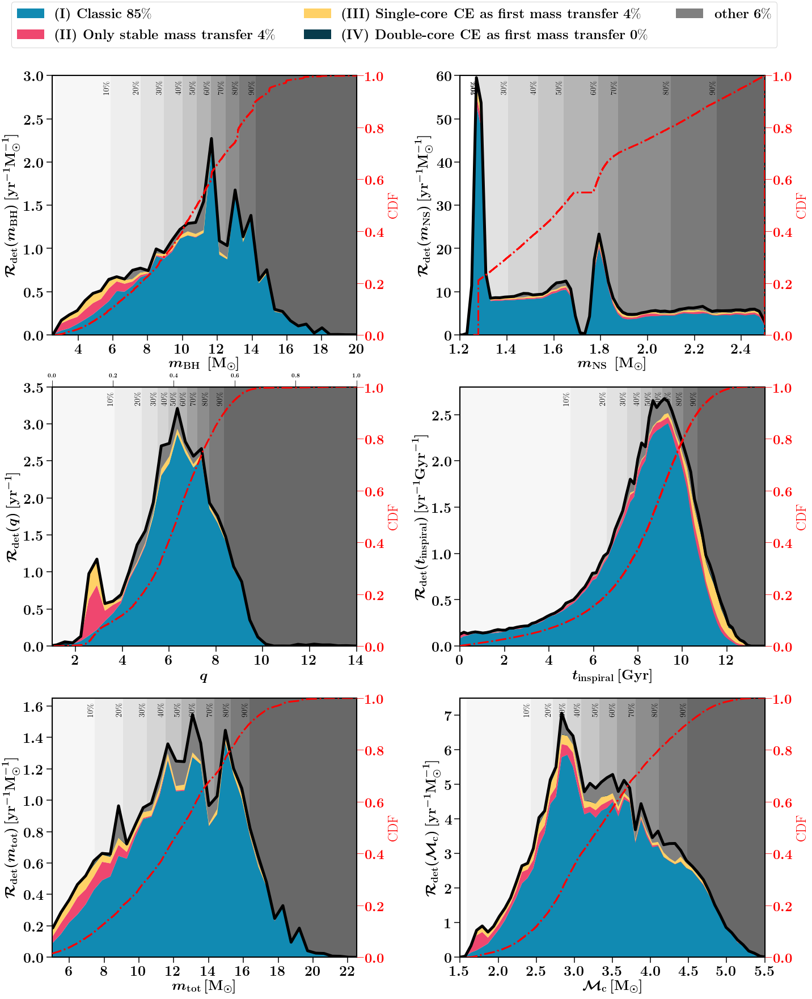

In [44]:


# dictChannelsList = ['classic',  'double-core CE', 'other']    
TYPE = 'BHNS' 
whichWeight='observed'
Nbins= .04#1#25 #.05#50 #.1 #50
Data = Data_BHNS

##
linewidth=3.5
ALPHA=0

# channelSystems = channelSystems_BHNS
channelSystems=None
dictRank=dictChannelsBHNS

f, ax= plt.subplots(ncols=2,nrows=3,figsize=(20,23), 
                  gridspec_kw={"width_ratios":[1.5, 1.5], "height_ratios":[2,2,2]})



fdata = h5.File(pathCOMPASOutput + 'COMPASOutput.h5')



####### BH MASS 
M1, M2 = Data_BHNS.COMPAS.mass1, Data_BHNS.COMPAS.mass2
MBH, MNS = obtainM1BHandM2BHassymetric(m1=M1, m2=M2)
print(len(MBH))
# rate_disrupted = np.zeros(4)
# # CHECK EJECTA MASS? 
# ii=0
# allweight = np.sum(Data_BHNS.PerSystemPerRedshift_ratesObserved*Data_BHNS.COMPAS.weight, axis=0)
# for ind_chi, chi in enumerate([0.0, 0.5]):
#     BH_chi   = chi * np.ones_like(MNS)
#     for ind_Rns, NSradii in enumerate([11.5,13.0]):
#         Rns = NSradii
#         NS_radii = Rns * np.ones_like(MNS)

#         Mej = calculateEjectedMassMerger(m_ns=MNS, r_ns=NS_radii, m_bh=MBH, Xeff=BH_chi)

#         maskEjecta = (Mej > 0)


#         combinedweight = np.sum(Data_BHNS.PerSystemPerRedshift_ratesObserved*Data_BHNS.COMPAS.weight, axis=0)[maskEjecta]
        
#         rate_disrupted[ii]+= np.sum(combinedweight) / np.sum(allweight)
#         ii+=1


#                 maskq5 = (MBH/MNS <=5.0)

seedsSN = fdata['supernovae']['randomSeed'][...].squeeze()
# get only SN seeds for DCOs 
maskSNdco = np.in1d(seedsSN,  Data.COMPAS.seeds) 
whichSN = fdata['supernovae']['whichStar'][...].squeeze()[maskSNdco]
whichSN1 = whichSN[::2] # get whichStar for first SN 


separationPreSN = fdata['supernovae']['separationBefore'][...].squeeze()[maskSNdco]
separationPreSN2 = separationPreSN[1::2] # in Rsun. 
maskNSBH = ((whichSN1==2) & (M1>M2) ) | ((whichSN1==1) & (M1<M2) ) 

ii=0
rate_disrupted = np.zeros(6)
allweight = np.sum(Data_BHNS.PerSystemPerRedshift_ratesObserved*Data_BHNS.COMPAS.weight, axis=0)
labelMej = []
for ind_chi, chi in enumerate([0.0, .5, 'Qin']):
    if chi=='Qin':
        # Qin 2018 spin model 
        BH_chi = QinBHspinmodel(separationPreSN2, M1, M2, maskNSBH)
    else:    
        BH_chi   = chi * np.ones_like(MNS)

    for ind_Rns, NSradii in enumerate([11.5,13.0]):
        Rns = NSradii
        NS_radii = Rns * np.ones_like(MNS)

        Mej = calculateEjectedMassMerger(m_ns=MNS, r_ns=NS_radii, m_bh=MBH, Xeff=BH_chi)

        maskEjecta = (Mej > 0)
        combinedweight = np.sum(Data_BHNS.PerSystemPerRedshift_ratesObserved*Data_BHNS.COMPAS.weight, axis=0)[maskEjecta]
        
        rate_disrupted[ii]+= np.sum(combinedweight) / np.sum(allweight)
        labelMej.append('chi = ' + str(chi) + ' Rns = ' + str(NSradii) +' km')
        ii+=1





xvar = MBH
nameY = r'$ \mathcal{R}_{\rm{det}}(m_{\rm{BH}}) \, [\rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r' $m_{\rm{BH}}$ $ \,  [\rm{M}_{\odot}]$'

handles, labels=plotdesigndistribution(axe=ax[0,0], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                              xlim=[2.5,20], ylim=[0,3], whichWeight=whichWeight, channelSystems=channelSystems, indplot=0) 


####### NS MASS 
xvar = MNS
nameY = r'$ \mathcal{R}_{\rm{det}}(m_{\rm{NS}}) \, [\rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r'$m_{\rm{NS}}$   $ \,  [\rm{M}_{\odot}]$ '

_,_=plotdesigndistribution(axe=ax[0,1], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                              xlim=[1.2,2.5], ylim=[0,60], whichWeight=whichWeight, channelSystems=channelSystems, indplot=1) 




####### mass ratio
xvar = MBH/MNS
nameY = r'$ \mathcal{R}_{\rm{det}}(q) \, [\rm{yr}^{-1}]  $'
nameX = r'$q$'

_,_=plotdesigndistribution(axe=ax[1,0], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                              xlim=[1,14], ylim=[0,3.5], whichWeight=whichWeight, channelSystems=channelSystems, indplot=2) 

######## INSPIRAL TIME
xvar = Data_BHNS.COMPAS.tc / 1000
nameY = r'$ \mathcal{R}_{\rm{det}}(t_{\rm{inspiral}}) \, [\rm{yr}^{-1}  \rm{Gyr}^{-1}]  $'
nameX = r'$t_{\rm{inspiral}} \, [\rm{Gyr}]$'

_,_=plotdesigndistribution(axe=ax[1,1], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                              xlim=[0,13.7], ylim=[0,2.8], whichWeight=whichWeight, channelSystems=channelSystems, indplot=3) 




####### mass total
xvar = MBH+MNS
nameY = r'$ \mathcal{R}_{\rm{det}}(m_{\rm{tot}}) \, [\rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r'$m_{\rm{tot}} \,  [\rm{M}_{\odot}]$'

_,_=plotdesigndistribution(axe=ax[2,0], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                              xlim=[5,22.5], ylim=[0,1.65], whichWeight=whichWeight, channelSystems=channelSystems, indplot=4) 


####### mass chirp
xvar = chirpmass(MBH, MNS)
nameY = r'$ \mathcal{R}_{\rm{det}}(\mathcal{M}_{\rm{c}}) \, [\rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r'$\mathcal{M}_{\rm{c}} \,  [\rm{M}_{\odot}]$'

_,_=plotdesigndistribution(axe=ax[2,1], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                              xlim=[1.5,5.5], ylim=[0,7.5], whichWeight=whichWeight, channelSystems=channelSystems, indplot=5) 

# ###########


# LEGEND
lgd = f.legend(handles, labels, fontsize=fs, ncol=3,\
         bbox_to_anchor=(0.96, 1.07),  markerscale=3., scatterpoints=1) # loc = 'upper center')




plt.tight_layout()
plt.subplots_adjust(wspace=0.34, hspace=0.2)
plt.savefig('./DistributionsFiducialchannels_' + whichWeight + '_' + TYPE +'.pdf',  transparent=False,\
           bbox_extra_artists=(lgd,), bbox_inches='tight')
plt.savefig('./DistributionsFiducialchannels_' + whichWeight + '_' + TYPE +'.png',  transparent=False,\
           bbox_extra_artists=(lgd,), bbox_inches='tight')
plt.show()
plt.show()
plt.close()





In [33]:
print(rate_disrupted)
print(labelM)

[0.01553142 0.04665842 0.13187204 0.28633842 0.01743246 0.04884509]


# intrinsic BHNS distribution

\textbf{Classic} 84.15\%
\textbf{Only stable mass transfer} 8.44\%
\textbf{Immediate single-core CE } 4.65\%
\textbf{Immediate double-core CE} 2.34\%
\textbf{other} 0.42\%
(array([ 2.6719    ,  3.47011262,  4.5483282 ,  5.61394   ,  7.04617464,
        8.59779   ,  9.99833087, 11.1479    , 12.2618    , 13.5003    ,
       38.1698    ]), ' =quant')
('xq =', 3.470112620030159, 0)
('xq =', 4.548328204612789, 1)
('xq =', 5.61394, 2)
('xq =', 7.046174644416248, 3)
('xq =', 8.59779, 4)
('xq =', 9.998330869720444, 5)
('xq =', 11.1479, 6)
('xq =', 12.2618, 7)
('xq =', 13.5003, 8)
filling till end
('ind ', 9)
(array([1.26      , 1.27758   , 1.27758   , 1.31966904, 1.43449   ,
       1.53575   , 1.63071   , 1.78913   , 1.93886   , 2.17373   ,
       2.5       ]), ' =quant')
('xq =', 1.27758, 0)
('xq =', 1.27758, 1)
('xq =', 1.319669038618174, 2)
('xq =', 1.43449, 3)
('xq =', 1.53575, 4)
('xq =', 1.63071, 5)
('xq =', 1.78913, 6)
('xq =', 1.93886, 7)
('xq =', 2.17373, 8)
filling till end
('ind ', 

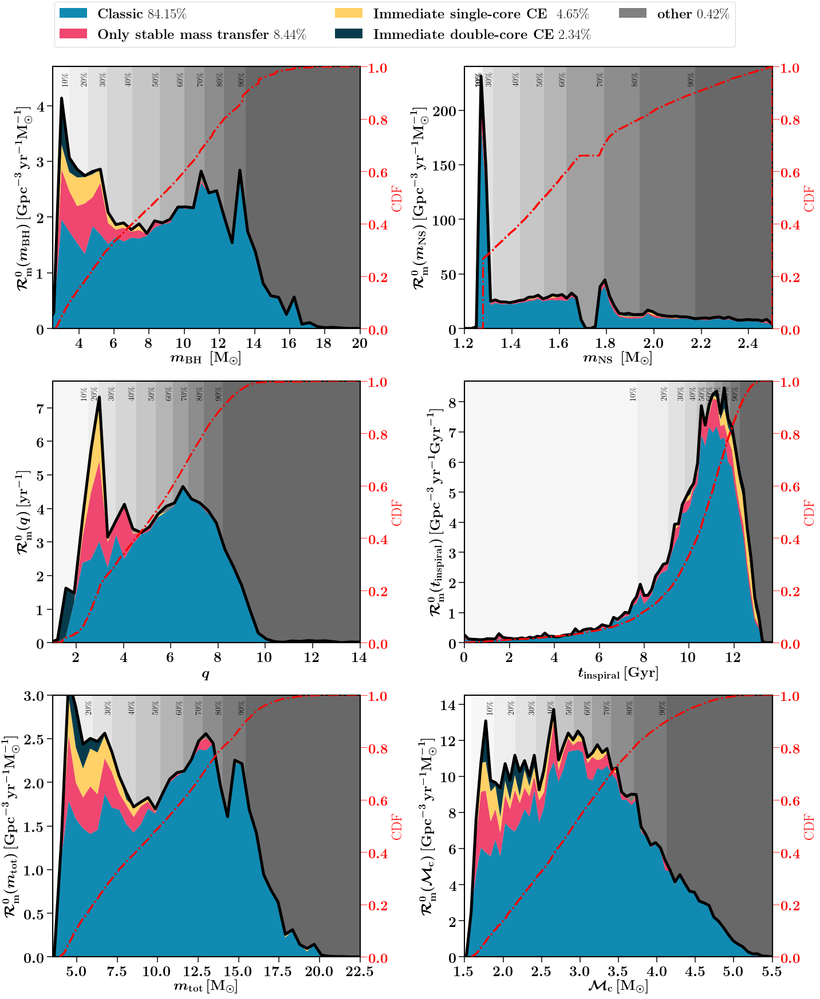

In [247]:
   
TYPE = 'BHNS' 
whichWeight='intrinsic'
Data = Data_BHNS


#general
Nbins= .025 #.05#50 #.1 #50
linewidth=3.5
ALPHA=0


f, ax= plt.subplots(ncols=2,nrows=3,figsize=(20,23), 
                  gridspec_kw={"width_ratios":[1.5, 1.5], "height_ratios":[2,2,2]})







####### BH MASS 
M1, M2 = Data_BHNS.COMPAS.mass1, Data_BHNS.COMPAS.mass2
MBH, MNS = obtainM1BHandM2BHassymetric(m1=M1, m2=M2)

rate_disrupted = np.zeros(4)
# CHECK EJECTA MASS? 
ii=0
allweight = np.sum(Data_BHNS.PerSystemPerRedshift_ratesObserved*Data_BHNS.COMPAS.weight, axis=0)
for ind_chi, chi in enumerate([0.0, 0.5]):
    BH_chi   = chi * np.ones_like(MNS)
    for ind_Rns, NSradii in enumerate([11.5,13.0]):
        Rns = NSradii
        NS_radii = Rns * np.ones_like(MNS)

        Mej = calculateEjectedMassMerger(m_ns=MNS, r_ns=NS_radii, m_bh=MBH, Xeff=BH_chi)

        maskEjecta = (Mej > 0)


        combinedweight = np.sum(Data_BHNS.PerSystemPerRedshift_ratesObserved*Data_BHNS.COMPAS.weight, axis=0)[maskEjecta]
        
        rate_disrupted[ii]+= np.sum(combinedweight) / np.sum(allweight)
        ii+=1


#                 maskq5 = (MBH/MNS <=5.0)






xvar = MBH
nameY = r'$ \mathcal{R}_{\rm{m}}^0(m_{\rm{BH}}) \, [\rm{Gpc}^{-3} \, \rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r' $m_{\rm{BH}}$ $ \,  [\rm{M}_{\odot}]$'

handles, labels=plotdesigndistribution(axe=ax[0,0], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                              xlim=[2.5,20], ylim=[0,4.7], whichWeight=whichWeight, channelSystems=channelSystems, indplot=0) 


####### NS MASS 
xvar = MNS
nameY = r'$ \mathcal{R}_{\rm{m}}^0(m_{\rm{NS}}) \, [\rm{Gpc}^{-3} \, \rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r'$m_{\rm{NS}}$   $ \,  [\rm{M}_{\odot}]$ '

_,_=plotdesigndistribution(axe=ax[0,1], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                              xlim=[1.2,2.5], ylim=[0,240], whichWeight=whichWeight, channelSystems=channelSystems, indplot=1) 




####### mass ratio
xvar = MBH/MNS
nameY = r'$ \mathcal{R}_{\rm{m}}^0(q) \, [\rm{yr}^{-1}]  $'
nameX = r'$q$'

_,_=plotdesigndistribution(axe=ax[1,0], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                              xlim=[1,14], ylim=[0,7.8], whichWeight=whichWeight, channelSystems=channelSystems, indplot=2) 

######## INSPIRAL TIME
xvar = Data_BHNS.COMPAS.tc / 1000
nameY = r'$ \mathcal{R}_{\rm{m}}^0(t_{\rm{inspiral}}) \, [\rm{Gpc}^{-3} \, \rm{yr}^{-1}  \rm{Gyr}^{-1}]  $'
nameX = r'$t_{\rm{inspiral}} \, [\rm{Gyr}]$'

_,_=plotdesigndistribution(axe=ax[1,1], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                              xlim=[0,13.7], ylim=[0, 8.7], whichWeight=whichWeight, channelSystems=channelSystems, indplot=3) 




####### mass total
xvar = MBH+MNS
nameY = r'$ \mathcal{R}_{\rm{m}}^0(m_{\rm{tot}}) \, [\rm{Gpc}^{-3} \, \rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r'$m_{\rm{tot}} \,  [\rm{M}_{\odot}]$'

_,_=plotdesigndistribution(axe=ax[2,0], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                              xlim=[3.5,22.5], ylim=[0,3.0], whichWeight=whichWeight, channelSystems=channelSystems, indplot=4) 


####### mass chirp
xvar = chirpmass(MBH, MNS)
nameY = r'$ \mathcal{R}_{\rm{m}}^0(\mathcal{M}_{\rm{c}}) \, [\rm{Gpc}^{-3} \, \rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r'$\mathcal{M}_{\rm{c}} \,  [\rm{M}_{\odot}]$'

_,_=plotdesigndistribution(axe=ax[2,1], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                              xlim=[1.5,5.5], ylim=[0,14.5], whichWeight=whichWeight, channelSystems=channelSystems, indplot=5) 

# ###########


# LEGEND
lgd = f.legend(handles, labels, fontsize=fs, ncol=3,\
         bbox_to_anchor=(.9, 1.06),  markerscale=3., scatterpoints=1) # loc = 'upper center')




plt.tight_layout()
plt.subplots_adjust(wspace=0.34, hspace=0.2)
plt.savefig('./DistributionsFiducialchannels_' + whichWeight + '_' + TYPE +'.pdf',  transparent=False,\
           bbox_extra_artists=(lgd,), bbox_inches='tight')
plt.savefig('./DistributionsFiducialchannels_' + whichWeight + '_' + TYPE +'.png',  transparent=False,\
           bbox_extra_artists=(lgd,), bbox_inches='tight')
plt.show()
plt.show()
plt.close()





# how this is build up from different metallicities:

In [45]:
import seaborn as sns

In [67]:
def plotdesigndistributionMetallicityBuildUp(axe, Data, xvar, bandwidth, xvarrange, xlabel, ylabel, xlim, ylim, whichWeight, channelSystems, indplot):
    """ plot total mass distribution with channels 
    input:
    
    axe = the axis to plot it on
    xvar= the array of data that you want to plot the kde of
    bw_method = bandwith method of the kernel density function you want to use (see class gaussian_kde())
    xvarrange, the x-axis range to use for the kde [should be typically slightly larger than the range of xvar]
    xlabel, ylabel = x and y labels of the plot
    xlim, ylim = xlim and ylim of the plot axis 
    indplot = something I use to hack the legend labels (I only want to plot the legends for some subplots)
    whichWeight = 'intrinsic' 'observed'
    you can just put indplot=0 or indplot=1 to get labels or no labels resp. 
    
    """
    dictList=dictChannelsBHNSList

    axes = [axe]
    
    weightSTROOPWAFEL = Data.COMPAS.weight
    
    Zgrid = [0.0001, 0.00011, 0.00012, 0.00014, 0.00016, 0.00017,\
           0.00019, 0.00022, 0.00024, 0.00027, 0.0003, 0.00034, \
           0.00037, 0.00042, 0.00047, 0.00052, 0.00058, 0.00065,\
           0.00073, 0.00081, 0.0009, 0.00101, 0.00113, 0.00126,\
           0.0014, 0.00157, 0.00175, 0.00195, 0.00218, 0.00243, \
           0.00272, 0.00303, 0.00339, 0.00378, 0.00422, 0.00471, \
           0.00526, 0.00587, 0.00655, 0.00732, 0.00817, 0.00912, \
           0.01018, 0.01137, 0.01269, 0.01416, 0.01581, 0.01765, 0.01971, 0.022, 0.0244, 0.02705, 0.03]
    
    Zcolors =  sns.color_palette("plasma", len(Zgrid))
#     sns.color_palette("rocket")
#     Zcolors = 
    
    # MAKE MAIN DISTRIBUTION PLOT
    res_kde =1000 # resolution kde, just the nr of interpolation points (so this is not the bandwith). 
    if xvarrange:
        binsM = np.linspace(xvarrange[0], xvarrange[1], res_kde)
    else:
        binsM =np.linspace(min(xvar)*0.9, 1.1*max(xvar), res_kde)
    dM    = np.diff(binsM)
    M     = (binsM[1:]+binsM[:-1])/2.

    
    # decide what weighting we are interested in:
    if whichWeight == 'intrinsic': # formation rate at redshift 0
        weights     = (Data.PerSystemPerRedshift_ratesIntrinsic[0,:]*weightSTROOPWAFEL)
    elif whichWeight == 'observed': # detectable rate weights for GW observations
        weights     = np.sum(Data.PerSystemPerRedshift_ratesObserved*weightSTROOPWAFEL, axis=0)

    totalweight = 0

    
    

        
    #### 
    
    ZlabelIndex = [r'\approx Z_{\odot} / 50', r'\approx Z_{\odot} / 10',r'\approx Z_{\odot} / 5',\
                   r'\approx Z_{\odot} / 2', r'\approx Z_{\odot} ']
        

    xx_boot = np.linspace(min(xvar)*0.8,max(xvar)*1.2, 100)
    yLow        = np.zeros(len(xx_boot))
    ZlabelIndexNo=0
    for nrZ, ZZ in enumerate(Zgrid):
    
    #   #Get the seeds that relate to sorted indices
#         seedsInterest = (Data.COMPAS.metallicitySystems ==ZZ)
        maskSeedsInterest = (Data.COMPAS.metallicitySystems == ZZ)#np.where(Data.metallicityGrid == ZZ) #np.in1d(Data.COMPAS.seeds, seedsInterest)
    
        
#     for nrG, group in enumerate(groups):
        # only if the channel group is present do plotting:
        if len(xvar[maskSeedsInterest]):
            Nsamples = len(xvar[maskSeedsInterest])
            if Nsamples>50: # we want min of 10 samples
                m       = xvar[maskSeedsInterest]
                w       = weights[maskSeedsInterest]
                print('percentage Z=', ZZ, ' =',((np.sum(w)/float(np.sum(weights)))*100))

                percentage = np.round((np.sum(w)/float(np.sum(weights)))*100,6)
                y, _    = np.histogram(m, bins=binsM, weights=w)
                y       = np.divide(y, dM)

                # remake histogram


                totalweight += np.sum(w)
                totalweight_nrG = np.sum(w)
                ##
                
#                 print('len m', len(m))
                KDE = gaussian_kde(m, weights=w, bw_method = bandwidth)
                y_boot = KDE(xx_boot)


                ##
                if ZZ in np.asarray([0.00027, 0.0014, 0.00272, 0.00732, 0.01416 ]):
                    LABEL = r'$Z_{\rm{i}}  %s$'%ZlabelIndex[ZlabelIndexNo]
                    print(LABEL)
                    ZlabelIndexNo+=1
                else:
                    LABEL = None


                axe.fill_between(xx_boot, yLow, yLow+(y_boot*totalweight_nrG), facecolor=Zcolors[nrZ], \
                                 alpha=1, label=LABEL, zorder=200)#,\
        #                           label=)
                yLow   +=y_boot*totalweight_nrG

 
    axe.plot(xx_boot,  (yLow), color='k', linewidth=5, zorder=200)
    
    
    ### for mass ratio plot second y-axis:
    if indplot==2:
        ax2x = axe.twiny()
        xlabel2 = r'$1/q$'
        
        maxq2x = 1/xlim[0]
        minq2x = 1/xlim[1]
        ax2x.set_xlim(0,1)
    
    
    ### PLOT CDF on right axes ###
    ax2y = axe.twinx()
    # label / tick settings
    cdfcolor = 'red'
    ylabel2 = 'CDF'

    ax2y.set_ylim(0,1)
    ax2y.tick_params(labelsize=fs, colors=cdfcolor)
    ax2y.set_ylabel(ylabel2, fontsize=fs, color=cdfcolor)       
    
    # plot cdf:
    ax2y.hist(xvar, normed=True, bins=len(xvar), cumulative=True, label=None,
         histtype='step', alpha=1, color=cdfcolor, linewidth=3, linestyle='-.', zorder=30, weights=weights)    


        
    # MAKE CDF background
    y_quantiles = np.linspace(0,1,11)
    x_quantiles = weighted_quantile(values=xvar, quantiles=y_quantiles, \
                       sample_weight=weights)
#     print(x_quantiles, ' =quant')
    xx0 = x_quantiles[0] # start of cdf = 0%
    # COLOR MAP 
    cm       = plt.get_cmap('Greys')
    Nc = len(x_quantiles)
    greys = [cm(x) for x in np.linspace(0,1 , int(1.5*Nc))]  # I dont want the dark colors
    greysFlip = [cm(x) for x in np.flip(np.linspace(0,1 , int(1.5*Nc)))]  # flip the grey list for text colors
    
    
#     if TYPE=='BHNS':
#         x_qplot = x_quantiles[1:]:
        
    
    for ind_q, xquant in enumerate(x_quantiles[1:]): # skip 0 
        if ind_q==len(x_quantiles[1:])-1:
            print('filling till end')
#             print('ind ', ind_q)
            xx = np.linspace(xx0, xlim[1], 10)
        else:
            xx = np.linspace(xx0, xquant, 10)
            textt_q = str(int(y_quantiles[ind_q+1]*100))  +'\%'
#             print('xq =', xquant, ind_q)
            axe.text(xquant, 0.98*ylim[1], s=textt_q, rotation = 90, \
                     fontsize = fs-10, color ='k', ha = 'right', va='top')#, weight = 'bold')

        axe.fill_between(xx, np.zeros_like(xx), np.ones_like(xx)*ylim[1]*1.1, facecolor=greys[ind_q+1], \
                         alpha=1, zorder=1)#,\ 


        xx0 = xquant     
    
    ###########
    if xlim:
        axe.set_xlim(xlim[0], xlim[1])
    if ylim:
        axe.set_ylim(ylim[0], ylim[1])

    axe == CV.layoutAxes(axe, nameX=xlabel, nameY=ylabel)

    
    if indplot==0: 
        handles, labels = axe.get_legend_handles_labels()
    else:
        handles, labels = None, None
        
    
#     axe.grid(True)
    
    
    return handles, labels
    

1525553
('percentage Z=', 0.0001, ' =', 0.0018045331847033933)
('percentage Z=', 0.00011, ' =', 1.7544236671529397e-05)
('percentage Z=', 0.00012, ' =', 0.0024924183153004335)
('percentage Z=', 0.00014, ' =', 0.026068670171574874)
('percentage Z=', 0.00016, ' =', 0.0024198323575580155)
('percentage Z=', 0.00017, ' =', 0.004486081120699384)
('percentage Z=', 0.00019, ' =', 0.012876952731350722)
('percentage Z=', 0.00022, ' =', 0.008738079121490749)
('percentage Z=', 0.00024, ' =', 0.012863517286641854)
('percentage Z=', 0.00027, ' =', 0.012973540054858151)
$Z_{\rm{i}}  \approx Z_{\odot} / 50$
('percentage Z=', 0.0003, ' =', 0.030324919062929487)
('percentage Z=', 0.00034, ' =', 0.034213996839525786)
('percentage Z=', 0.00037, ' =', 0.029543386011682115)
('percentage Z=', 0.00042, ' =', 0.055599715535446965)
('percentage Z=', 0.00047, ' =', 0.05458819818376889)
('percentage Z=', 0.00052, ' =', 0.06946460425861553)
('percentage Z=', 0.00058, ' =', 0.07665073653995451)
('percentage Z=', 0.

('percentage Z=', 0.01416, ' =', 10.471933134680912)
$Z_{\rm{i}}  \approx Z_{\odot} $
('percentage Z=', 0.01581, ' =', 5.985601266096725)
('percentage Z=', 0.01765, ' =', 3.529336416974612)
('percentage Z=', 0.01971, ' =', 1.8609102296639086)
filling till end
('percentage Z=', 0.0001, ' =', 0.0018045331847033933)
('percentage Z=', 0.00011, ' =', 1.7544236671529397e-05)
('percentage Z=', 0.00012, ' =', 0.0024924183153004335)
('percentage Z=', 0.00014, ' =', 0.026068670171574874)
('percentage Z=', 0.00016, ' =', 0.0024198323575580155)
('percentage Z=', 0.00017, ' =', 0.004486081120699384)
('percentage Z=', 0.00019, ' =', 0.012876952731350722)
('percentage Z=', 0.00022, ' =', 0.008738079121490749)
('percentage Z=', 0.00024, ' =', 0.012863517286641854)
('percentage Z=', 0.00027, ' =', 0.012973540054858151)
$Z_{\rm{i}}  \approx Z_{\odot} / 50$
('percentage Z=', 0.0003, ' =', 0.030324919062929487)
('percentage Z=', 0.00034, ' =', 0.034213996839525786)
('percentage Z=', 0.00037, ' =', 0.02954

('percentage Z=', 0.00912, ' =', 8.487461906283569)
('percentage Z=', 0.01018, ' =', 9.821012250234928)
('percentage Z=', 0.01137, ' =', 15.007341826679346)
('percentage Z=', 0.01269, ' =', 13.675252204119086)
('percentage Z=', 0.01416, ' =', 10.471933134680912)
$Z_{\rm{i}}  \approx Z_{\odot} $
('percentage Z=', 0.01581, ' =', 5.985601266096725)
('percentage Z=', 0.01765, ' =', 3.529336416974612)
('percentage Z=', 0.01971, ' =', 1.8609102296639086)
filling till end


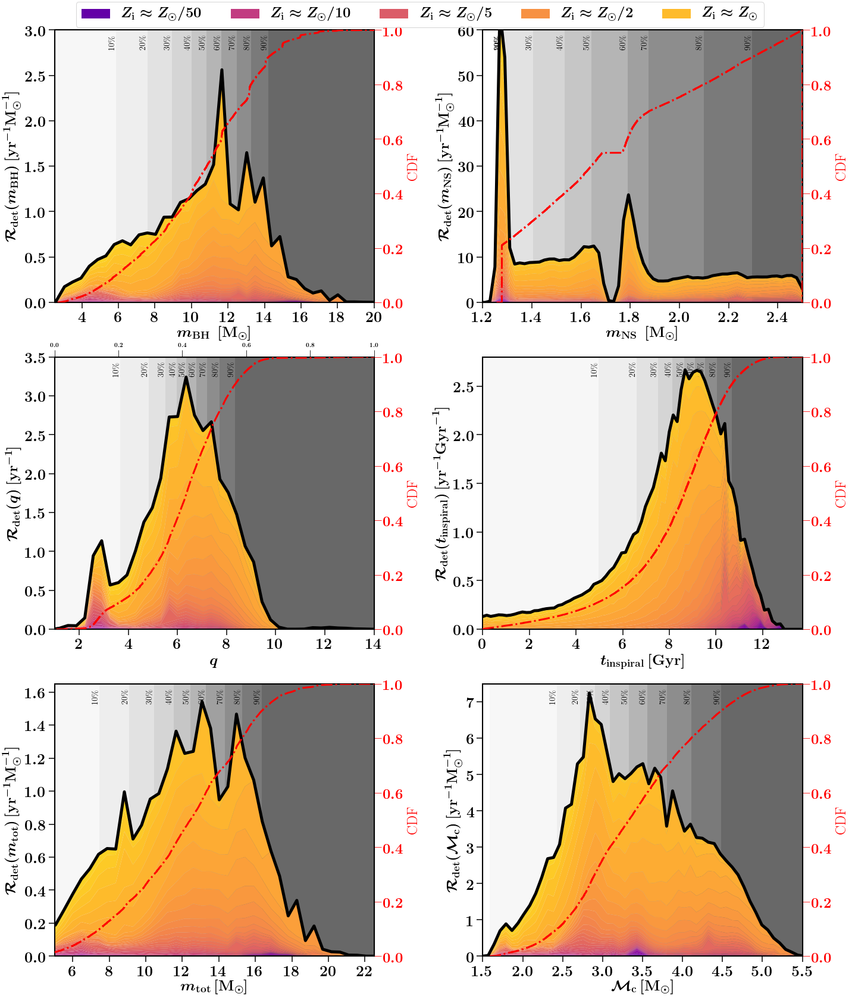

In [70]:


# dictChannelsList = ['classic',  'double-core CE', 'other']    
TYPE = 'BHNS' 
whichWeight='observed'
Nbins= .04#1#25 #.05#50 #.1 #50
Data = Data_BHNS

##
linewidth=3.5
ALPHA=0

# channelSystems = channelSystems_BHNS
channelSystems=None
dictRank=dictChannelsBHNS

f, ax= plt.subplots(ncols=2,nrows=3,figsize=(20,23), 
                  gridspec_kw={"width_ratios":[1.5, 1.5], "height_ratios":[2,2,2]})



# fdata = h5.File(pathCOMPASOutput + 'COMPASOutput.h5')



####### BH MASS 
M1, M2 = Data_BHNS.COMPAS.mass1, Data_BHNS.COMPAS.mass2
MBH, MNS = obtainM1BHandM2BHassymetric(m1=M1, m2=M2)
print(len(MBH))





xvar = MBH
nameY = r'$ \mathcal{R}_{\rm{det}}(m_{\rm{BH}}) \, [\rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r' $m_{\rm{BH}}$ $ \,  [\rm{M}_{\odot}]$'

handles, labels=plotdesigndistributionMetallicityBuildUp(axe=ax[0,0], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                              xlim=[2.5,20], ylim=[0,3], whichWeight=whichWeight, channelSystems=channelSystems, indplot=0) 


####### NS MASS 
xvar = MNS
nameY = r'$ \mathcal{R}_{\rm{det}}(m_{\rm{NS}}) \, [\rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r'$m_{\rm{NS}}$   $ \,  [\rm{M}_{\odot}]$ '

_,_=plotdesigndistributionMetallicityBuildUp(axe=ax[0,1], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                              xlim=[1.2,2.5], ylim=[0,60], whichWeight=whichWeight, channelSystems=channelSystems, indplot=1) 




####### mass ratio
xvar = MBH/MNS
nameY = r'$ \mathcal{R}_{\rm{det}}(q) \, [\rm{yr}^{-1}]  $'
nameX = r'$q$'

_,_=plotdesigndistributionMetallicityBuildUp(axe=ax[1,0], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                              xlim=[1,14], ylim=[0,3.5], whichWeight=whichWeight, channelSystems=channelSystems, indplot=2) 

######## INSPIRAL TIME
xvar = Data_BHNS.COMPAS.tc / 1000
nameY = r'$ \mathcal{R}_{\rm{det}}(t_{\rm{inspiral}}) \, [\rm{yr}^{-1}  \rm{Gyr}^{-1}]  $'
nameX = r'$t_{\rm{inspiral}} \, [\rm{Gyr}]$'

_,_=plotdesigndistributionMetallicityBuildUp(axe=ax[1,1], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                              xlim=[0,13.7], ylim=[0,2.8], whichWeight=whichWeight, channelSystems=channelSystems, indplot=3) 




####### mass total
xvar = MBH+MNS
nameY = r'$ \mathcal{R}_{\rm{det}}(m_{\rm{tot}}) \, [\rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r'$m_{\rm{tot}} \,  [\rm{M}_{\odot}]$'

_,_=plotdesigndistributionMetallicityBuildUp(axe=ax[2,0], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                              xlim=[5,22.5], ylim=[0,1.65], whichWeight=whichWeight, channelSystems=channelSystems, indplot=4) 


####### mass chirp
xvar = chirpmass(MBH, MNS)
nameY = r'$ \mathcal{R}_{\rm{det}}(\mathcal{M}_{\rm{c}}) \, [\rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r'$\mathcal{M}_{\rm{c}} \,  [\rm{M}_{\odot}]$'

_,_=plotdesigndistributionMetallicityBuildUp(axe=ax[2,1], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                              xlim=[1.5,5.5], ylim=[0,7.5], whichWeight=whichWeight, channelSystems=channelSystems, indplot=5) 

# ###########


# LEGEND
lgd = f.legend(handles, labels, fontsize=fs, ncol=5,\
         bbox_to_anchor=(0.9, 1.04),  markerscale=3., scatterpoints=1) # loc = 'upper center')




plt.tight_layout()
plt.subplots_adjust(wspace=0.34, hspace=0.2)
plt.savefig('./DistributionsFiducialchannels_' + whichWeight + '_' + TYPE +'MetallicityBuildUp.pdf',  transparent=False,\
           bbox_extra_artists=(lgd,), bbox_inches='tight')
plt.savefig('./DistributionsFiducialchannels_' + whichWeight + '_' + TYPE +'MetalliciyBuildUp.png',  transparent=False,\
           bbox_extra_artists=(lgd,), bbox_inches='tight')
plt.show()
plt.show()
plt.close()





In [ ]:
# [0.0001, 0.00011, 0.00012, 0.00014, 0.00016, 0.00017,\
#            0.00019, 0.00022, 0.00024, 0.00027, 0.0003, 0.00034, \
#            0.00037, 0.00042, 0.00047, 0.00052, 0.00058, 0.00065,\
#            0.00073, 0.00081, 0.0009, 0.00101, 0.00113, 0.00126,\
#            0.0014, 0.00157, 0.00175, 0.00195, 0.00218, 0.00243, \
#            0.00272, 0.00303, 0.00339, 0.00378, 0.00422, 0.00471, \
#            0.00526, 0.00587, 0.00655, 0.00732, 0.00817, 0.00912, \
#            0.01018, 0.01137, 0.01269, 0.01416, 0.01581, 0.01765, 0.01971, 0.022, 0.0244, 0.02705, 0.03]

# model A231 (highest)

In [72]:
# #Will only look at BBHs so might as well set everything
# minz = 0.
# maxz = 6
# resz = 100 #200 //floor
# sensitivity = 'design'
# Data_BHNS = CI.CosmicIntegrator(COMPASpath = pathCOMPASOutput, DCOtypes='BHNS',\
#        minRedshift=minz,   maxRedshift=maxz, nrRedshiftBins=resz,\
#                            GWdetector_sensitivity=sensitivity,\
#                            optimistic=False, Cosmology='WMAP', COMPASbinaryFraction=1.0)


# fc = FC.FormationChannels(path = pathCOMPASOutput,verbose=False)


# fc.formationChannelsSeeds(seeds=Data_BHNS.COMPAS.seeds, withinHubbleTime=True, optimistic=False)

# channelSystems_BHNS  = np.ones(len(fc.rankArray)) * -1



# for nrC, Channel in enumerate(dictChannelsBHNSList):
#     subchannel = np.asarray(dictChannelsBHNS[Channel]) -1.
#     for nrc, nr_subchannel in enumerate(subchannel):

    
#         channelSystems_BHNS[(fc.rankArray == nr_subchannel)] =nrC
    
# # 4 = is "other channels"
# channelSystems_BHNS[(channelSystems_BHNS ==-1.)] =4


# print np.unique(channelSystems_BHNS)


model = 'A231'


if model == 'Preferred':
    Data_BHNS.MSSFR.Zprescription         = 'logNormal'
    Data_BHNS.MSSFR.SFRprescription       = 'Neijssel et al. (2019)'
    Data_BHNS.MSSFR.logNormalPrescription = 'Neijssel Phenomenological'

if model =='A231':
    Data_BHNS.MSSFR.Zprescription         = 'MZ_GSMF'
    Data_BHNS.MSSFR.SFRprescription       = 'Strolger et al. (2004)'
    Data_BHNS.MSSFR.logNormalPrescription = None
    Data_BHNS.MSSFR.GSMFprescription      = 'Furlong et al. (2015) Double'
    Data_BHNS.MSSFR.ZMprescription        = 'Langer et al. (2006)'



Data_BHNS.cosmologicalIntegration()





1525553
('percentage=', 73.57479271605281)
\textbf{(I) Classic} $74$\%
('percentage=', 3.789344164613783)
\textbf{(II) Only stable mass transfer} $4$\%
('percentage=', 13.883890169359269)
\textbf{(III) Single-core CE as first mass transfer} $14$\%
('percentage=', 1.23290960844557)
\textbf{(IV) Double-core CE as first mass transfer} $1$\%
('percentage=', 7.519063341528547)
\textbf{other} $8$\%
filling till end
('percentage=', 73.57479271605281)
('percentage=', 3.789344164613783)
('percentage=', 13.883890169359269)
('percentage=', 1.23290960844557)
('percentage=', 7.519063341528547)
filling till end
('percentage=', 73.57479271605281)
('percentage=', 3.789344164613783)
('percentage=', 13.883890169359269)
('percentage=', 1.23290960844557)
('percentage=', 7.519063341528547)
filling till end
('percentage=', 73.57479271605281)
('percentage=', 3.789344164613783)
('percentage=', 13.883890169359269)
('percentage=', 1.23290960844557)
('percentage=', 7.519063341528547)
filling till end
('percentag

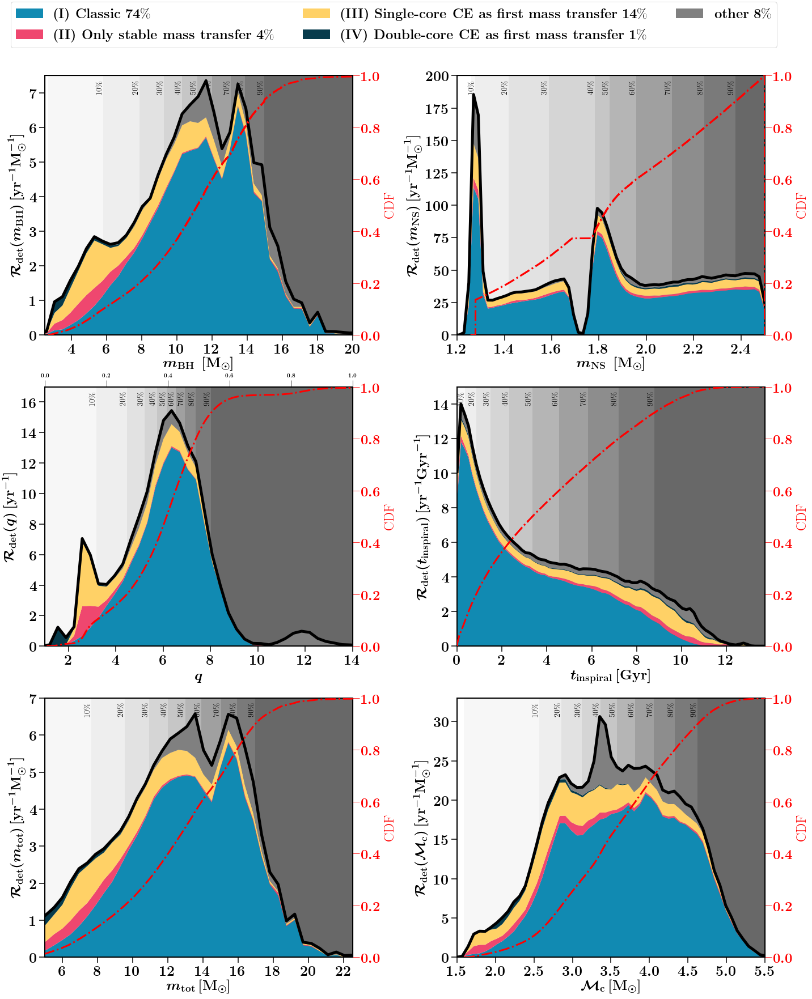

In [78]:


# dictChannelsList = ['classic',  'double-core CE', 'other']    
TYPE = 'BHNS' 
whichWeight='observed'
Nbins= .04#1#25 #.05#50 #.1 #50
Data = Data_BHNS

##
linewidth=3.5
ALPHA=0

# channelSystems = channelSystems_BHNS
channelSystems=None
dictRank=dictChannelsBHNS

f, ax= plt.subplots(ncols=2,nrows=3,figsize=(20,23), 
                  gridspec_kw={"width_ratios":[1.5, 1.5], "height_ratios":[2,2,2]})



fdata = h5.File(pathCOMPASOutput + 'COMPASOutput.h5')



####### BH MASS 
M1, M2 = Data_BHNS.COMPAS.mass1, Data_BHNS.COMPAS.mass2
MBH, MNS = obtainM1BHandM2BHassymetric(m1=M1, m2=M2)
print(len(MBH))
# rate_disrupted = np.zeros(4)
# # CHECK EJECTA MASS? 
# ii=0
# allweight = np.sum(Data_BHNS.PerSystemPerRedshift_ratesObserved*Data_BHNS.COMPAS.weight, axis=0)
# for ind_chi, chi in enumerate([0.0, 0.5]):
#     BH_chi   = chi * np.ones_like(MNS)
#     for ind_Rns, NSradii in enumerate([11.5,13.0]):
#         Rns = NSradii
#         NS_radii = Rns * np.ones_like(MNS)

#         Mej = calculateEjectedMassMerger(m_ns=MNS, r_ns=NS_radii, m_bh=MBH, Xeff=BH_chi)

#         maskEjecta = (Mej > 0)


#         combinedweight = np.sum(Data_BHNS.PerSystemPerRedshift_ratesObserved*Data_BHNS.COMPAS.weight, axis=0)[maskEjecta]
        
#         rate_disrupted[ii]+= np.sum(combinedweight) / np.sum(allweight)
#         ii+=1


#                 maskq5 = (MBH/MNS <=5.0)

seedsSN = fdata['supernovae']['randomSeed'][...].squeeze()
# get only SN seeds for DCOs 
maskSNdco = np.in1d(seedsSN,  Data.COMPAS.seeds) 
whichSN = fdata['supernovae']['whichStar'][...].squeeze()[maskSNdco]
whichSN1 = whichSN[::2] # get whichStar for first SN 


separationPreSN = fdata['supernovae']['separationBefore'][...].squeeze()[maskSNdco]
separationPreSN2 = separationPreSN[1::2] # in Rsun. 
maskNSBH = ((whichSN1==2) & (M1>M2) ) | ((whichSN1==1) & (M1<M2) ) 

ii=0
rate_disrupted = np.zeros(6)
allweight = np.sum(Data_BHNS.PerSystemPerRedshift_ratesObserved*Data_BHNS.COMPAS.weight, axis=0)
labelMej = []
for ind_chi, chi in enumerate([0.0, .5, 'Qin']):
    if chi=='Qin':
        # Qin 2018 spin model 
        BH_chi = QinBHspinmodel(separationPreSN2, M1, M2, maskNSBH)
    else:    
        BH_chi   = chi * np.ones_like(MNS)

    for ind_Rns, NSradii in enumerate([11.5,13.0]):
        Rns = NSradii
        NS_radii = Rns * np.ones_like(MNS)

        Mej = calculateEjectedMassMerger(m_ns=MNS, r_ns=NS_radii, m_bh=MBH, Xeff=BH_chi)

        maskEjecta = (Mej > 0)
        combinedweight = np.sum(Data_BHNS.PerSystemPerRedshift_ratesObserved*Data_BHNS.COMPAS.weight, axis=0)[maskEjecta]
        
        rate_disrupted[ii]+= np.sum(combinedweight) / np.sum(allweight)
        labelMej.append('chi = ' + str(chi) + ' Rns = ' + str(NSradii) +' km')
        ii+=1





xvar = MBH
nameY = r'$ \mathcal{R}_{\rm{det}}(m_{\rm{BH}}) \, [\rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r' $m_{\rm{BH}}$ $ \,  [\rm{M}_{\odot}]$'

handles, labels=plotdesigndistribution(axe=ax[0,0], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                              xlim=[2.5,20], ylim=[0,7.5], whichWeight=whichWeight, channelSystems=channelSystems, indplot=0) 


####### NS MASS 
xvar = MNS
nameY = r'$ \mathcal{R}_{\rm{det}}(m_{\rm{NS}}) \, [\rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r'$m_{\rm{NS}}$   $ \,  [\rm{M}_{\odot}]$ '

_,_=plotdesigndistribution(axe=ax[0,1], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                              xlim=[1.2,2.5], ylim=[0,200], whichWeight=whichWeight, channelSystems=channelSystems, indplot=1) 




####### mass ratio
xvar = MBH/MNS
nameY = r'$ \mathcal{R}_{\rm{det}}(q) \, [\rm{yr}^{-1}]  $'
nameX = r'$q$'

_,_=plotdesigndistribution(axe=ax[1,0], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                              xlim=[1,14], ylim=[0,17], whichWeight=whichWeight, channelSystems=channelSystems, indplot=2) 

######## INSPIRAL TIME
xvar = Data_BHNS.COMPAS.tc / 1000
nameY = r'$ \mathcal{R}_{\rm{det}}(t_{\rm{inspiral}}) \, [\rm{yr}^{-1}  \rm{Gyr}^{-1}]  $'
nameX = r'$t_{\rm{inspiral}} \, [\rm{Gyr}]$'

_,_=plotdesigndistribution(axe=ax[1,1], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                              xlim=[0,13.7], ylim=[0,15], whichWeight=whichWeight, channelSystems=channelSystems, indplot=3) 




####### mass total
xvar = MBH+MNS
nameY = r'$ \mathcal{R}_{\rm{det}}(m_{\rm{tot}}) \, [\rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r'$m_{\rm{tot}} \,  [\rm{M}_{\odot}]$'

_,_=plotdesigndistribution(axe=ax[2,0], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                              xlim=[5,22.5], ylim=[0,7], whichWeight=whichWeight, channelSystems=channelSystems, indplot=4) 


####### mass chirp
xvar = chirpmass(MBH, MNS)
nameY = r'$ \mathcal{R}_{\rm{det}}(\mathcal{M}_{\rm{c}}) \, [\rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r'$\mathcal{M}_{\rm{c}} \,  [\rm{M}_{\odot}]$'

_,_=plotdesigndistribution(axe=ax[2,1], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                              xlim=[1.5,5.5], ylim=[0,33], whichWeight=whichWeight, channelSystems=channelSystems, indplot=5) 

# ###########


# LEGEND
lgd = f.legend(handles, labels, fontsize=fs, ncol=3,\
         bbox_to_anchor=(0.96, 1.07),  markerscale=3., scatterpoints=1) # loc = 'upper center')




plt.tight_layout()
plt.subplots_adjust(wspace=0.34, hspace=0.2)
plt.savefig('./DistributionsFiducialchannels_' + whichWeight + '_' + TYPE + '_' + model +'.pdf',  transparent=False,\
           bbox_extra_artists=(lgd,), bbox_inches='tight')
plt.savefig('./DistributionsFiducialchannels_' + whichWeight + '_' + TYPE + '_' + model +'.png',  transparent=False,\
           bbox_extra_artists=(lgd,), bbox_inches='tight')
plt.show()
plt.show()
plt.close()





1525553
('percentage Z=', 0.0001, ' =', 1.176335687213253)
('percentage Z=', 0.00011, ' =', 0.05070334537219754)
('percentage Z=', 0.00012, ' =', 0.1195468129664348)
('percentage Z=', 0.00014, ' =', 0.14124852326661563)
('percentage Z=', 0.00016, ' =', 0.14917145225118453)
('percentage Z=', 0.00017, ' =', 0.08291274327816821)
('percentage Z=', 0.00019, ' =', 0.130218927318899)
('percentage Z=', 0.00022, ' =', 0.21710299675255307)
('percentage Z=', 0.00024, ' =', 0.1285484975513289)
('percentage Z=', 0.00027, ' =', 0.2171088677928164)
$Z_{\rm{i}}  \approx Z_{\odot} / 50$
('percentage Z=', 0.0003, ' =', 0.30102941563818175)
('percentage Z=', 0.00034, ' =', 0.2753439541000674)
('percentage Z=', 0.00037, ' =', 0.32627409575235916)
('percentage Z=', 0.00042, ' =', 0.42277310449473265)
('percentage Z=', 0.00047, ' =', 0.4428385111079959)
('percentage Z=', 0.00052, ' =', 0.49920548586219576)
('percentage Z=', 0.00058, ' =', 0.5633464473474663)
('percentage Z=', 0.00065, ' =', 0.63130888272987

filling till end
('percentage Z=', 0.0001, ' =', 1.176335687213253)
('percentage Z=', 0.00011, ' =', 0.05070334537219754)
('percentage Z=', 0.00012, ' =', 0.1195468129664348)
('percentage Z=', 0.00014, ' =', 0.14124852326661563)
('percentage Z=', 0.00016, ' =', 0.14917145225118453)
('percentage Z=', 0.00017, ' =', 0.08291274327816821)
('percentage Z=', 0.00019, ' =', 0.130218927318899)
('percentage Z=', 0.00022, ' =', 0.21710299675255307)
('percentage Z=', 0.00024, ' =', 0.1285484975513289)
('percentage Z=', 0.00027, ' =', 0.2171088677928164)
$Z_{\rm{i}}  \approx Z_{\odot} / 50$
('percentage Z=', 0.0003, ' =', 0.30102941563818175)
('percentage Z=', 0.00034, ' =', 0.2753439541000674)
('percentage Z=', 0.00037, ' =', 0.32627409575235916)
('percentage Z=', 0.00042, ' =', 0.42277310449473265)
('percentage Z=', 0.00047, ' =', 0.4428385111079959)
('percentage Z=', 0.00052, ' =', 0.49920548586219576)
('percentage Z=', 0.00058, ' =', 0.5633464473474663)
('percentage Z=', 0.00065, ' =', 0.63130

filling till end


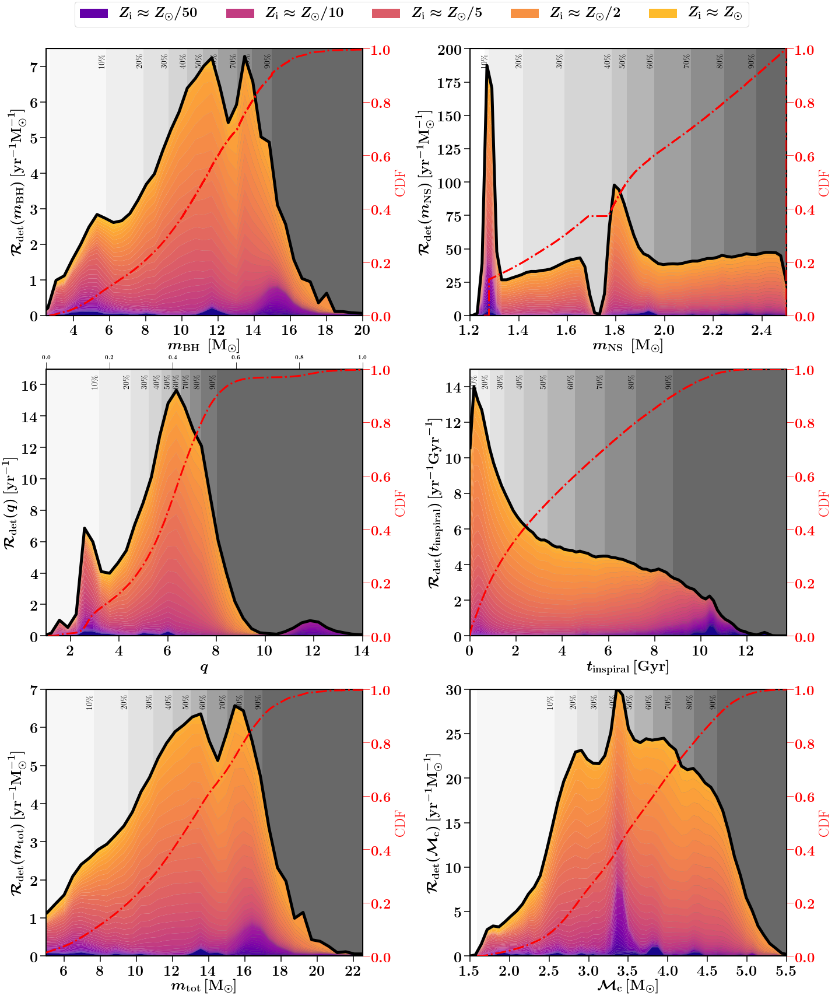

In [74]:


# dictChannelsList = ['classic',  'double-core CE', 'other']    
TYPE = 'BHNS' 
whichWeight='observed'
Nbins= .04#1#25 #.05#50 #.1 #50
Data = Data_BHNS

##
linewidth=3.5
ALPHA=0

# channelSystems = channelSystems_BHNS
channelSystems=None
dictRank=dictChannelsBHNS

f, ax= plt.subplots(ncols=2,nrows=3,figsize=(20,23), 
                  gridspec_kw={"width_ratios":[1.5, 1.5], "height_ratios":[2,2,2]})



# fdata = h5.File(pathCOMPASOutput + 'COMPASOutput.h5')



####### BH MASS 
M1, M2 = Data_BHNS.COMPAS.mass1, Data_BHNS.COMPAS.mass2
MBH, MNS = obtainM1BHandM2BHassymetric(m1=M1, m2=M2)
print(len(MBH))





xvar = MBH
nameY = r'$ \mathcal{R}_{\rm{det}}(m_{\rm{BH}}) \, [\rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r' $m_{\rm{BH}}$ $ \,  [\rm{M}_{\odot}]$'

handles, labels=plotdesigndistributionMetallicityBuildUp(axe=ax[0,0], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                              xlim=[2.5,20], ylim=[0,7.5], whichWeight=whichWeight, channelSystems=channelSystems, indplot=0) 


####### NS MASS 
xvar = MNS
nameY = r'$ \mathcal{R}_{\rm{det}}(m_{\rm{NS}}) \, [\rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r'$m_{\rm{NS}}$   $ \,  [\rm{M}_{\odot}]$ '

_,_=plotdesigndistributionMetallicityBuildUp(axe=ax[0,1], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                              xlim=[1.2,2.5], ylim=[0,200], whichWeight=whichWeight, channelSystems=channelSystems, indplot=1) 




####### mass ratio
xvar = MBH/MNS
nameY = r'$ \mathcal{R}_{\rm{det}}(q) \, [\rm{yr}^{-1}]  $'
nameX = r'$q$'

_,_=plotdesigndistributionMetallicityBuildUp(axe=ax[1,0], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                              xlim=[1,14], ylim=[0,17], whichWeight=whichWeight, channelSystems=channelSystems, indplot=2) 

######## INSPIRAL TIME
xvar = Data_BHNS.COMPAS.tc / 1000
nameY = r'$ \mathcal{R}_{\rm{det}}(t_{\rm{inspiral}}) \, [\rm{yr}^{-1}  \rm{Gyr}^{-1}]  $'
nameX = r'$t_{\rm{inspiral}} \, [\rm{Gyr}]$'

_,_=plotdesigndistributionMetallicityBuildUp(axe=ax[1,1], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                              xlim=[0,13.7], ylim=[0,15], whichWeight=whichWeight, channelSystems=channelSystems, indplot=3) 




####### mass total
xvar = MBH+MNS
nameY = r'$ \mathcal{R}_{\rm{det}}(m_{\rm{tot}}) \, [\rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r'$m_{\rm{tot}} \,  [\rm{M}_{\odot}]$'

_,_=plotdesigndistributionMetallicityBuildUp(axe=ax[2,0], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                              xlim=[5,22.5], ylim=[0,7], whichWeight=whichWeight, channelSystems=channelSystems, indplot=4) 


####### mass chirp
xvar = chirpmass(MBH, MNS)
nameY = r'$ \mathcal{R}_{\rm{det}}(\mathcal{M}_{\rm{c}}) \, [\rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r'$\mathcal{M}_{\rm{c}} \,  [\rm{M}_{\odot}]$'

_,_=plotdesigndistributionMetallicityBuildUp(axe=ax[2,1], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                              xlim=[1.5,5.5], ylim=[0,30], whichWeight=whichWeight, channelSystems=channelSystems, indplot=5) 

# ###########


# LEGEND
lgd = f.legend(handles, labels, fontsize=fs, ncol=5,\
         bbox_to_anchor=(0.9, 1.04),  markerscale=3., scatterpoints=1) # loc = 'upper center')




plt.tight_layout()
plt.subplots_adjust(wspace=0.34, hspace=0.2)
plt.savefig('./DistributionsFiducialchannels_' + whichWeight + '_' + TYPE + '_' + model + 'MetallicityBuildUp.pdf',  transparent=False,\
           bbox_extra_artists=(lgd,), bbox_inches='tight')
plt.savefig('./DistributionsFiducialchannels_' + whichWeight + '_' + TYPE + '_' + model + 'MetalliciyBuildUp.png',  transparent=False,\
           bbox_extra_artists=(lgd,), bbox_inches='tight')
plt.show()
plt.show()
plt.close()





# ALL MSSFR MODELS

In [87]:
def plotdesigndistributionLOOP(axe, Data, xvar, bandwidth, xvarrange, xlabel, ylabel, xlim, ylim, whichWeight, channelSystems, indplot):
    """ plot total mass distribution with channels 
    input:
    
    axe = the axis to plot it on
    xvar= the array of data that you want to plot the kde of
    bw_method = bandwith method of the kernel density function you want to use (see class gaussian_kde())
    xvarrange, the x-axis range to use for the kde [should be typically slightly larger than the range of xvar]
    xlabel, ylabel = x and y labels of the plot
    xlim, ylim = xlim and ylim of the plot axis 
    indplot = something I use to hack the legend labels (I only want to plot the legends for some subplots)
    whichWeight = 'intrinsic' 'observed'
    you can just put indplot=0 or indplot=1 to get labels or no labels resp. 
    
    """
    dictList=dictChannelsBHNSList

    axes = [axe]
    
    weightSTROOPWAFEL = Data.COMPAS.weight
    
   
    
    
    # MAKE MAIN DISTRIBUTION PLOT
    res_kde =1000 # resolution kde, just the nr of interpolation points (so this is not the bandwith). 
    if xvarrange:
        binsM = np.linspace(xvarrange[0], xvarrange[1], res_kde)
    else:
        binsM =np.linspace(min(xvar)*0.9, 1.1*max(xvar), res_kde)
    dM    = np.diff(binsM)
    M     = (binsM[1:]+binsM[:-1])/2.

    
    # decide what weighting we are interested in:
    if whichWeight == 'intrinsic': # formation rate at redshift 0
        weights     = (Data.PerSystemPerRedshift_ratesIntrinsic[0,:]*weightSTROOPWAFEL)
    elif whichWeight == 'observed': # detectable rate weights for GW observations
        weights     = np.sum(Data.PerSystemPerRedshift_ratesObserved*weightSTROOPWAFEL, axis=0)

    totalweight = 0

    
    

        
    #### 
    
    

    xx_boot = np.linspace(min(xvar)*0.8,max(xvar)*1.2, 100)
    yLow        = np.zeros(len(xx_boot))

    for nrC, Channel in enumerate(dictList):
    
    #   #Get the seeds that relate to sorted indices
        seedsInterest = dictRank[Channel] 
        maskSeedsInterest = np.in1d(Data.COMPAS.seeds, seedsInterest)
    
        
#     for nrG, group in enumerate(groups):
        # only if the channel group is present do plotting:
        if len(xvar[maskSeedsInterest]):
            m       = xvar[maskSeedsInterest]
            w       = weights[maskSeedsInterest]
#             print('percentage=',((np.sum(w)/float(np.sum(weights)))*100))
            percentage = np.round((np.sum(w)/float(np.sum(weights)))*100,6)
            y, _    = np.histogram(m, bins=binsM, weights=w)
            y       = np.divide(y, dM)

            # remake histogram


            totalweight += np.sum(w)
            totalweight_nrG = np.sum(w)
            ##

            KDE = gaussian_kde(m, weights=w, bw_method = bandwidth)
            y_boot = KDE(xx_boot)


            ##
            if indplot==0:
                LABEL = dictChannelsBHNSListBolt[nrC]+' '+r'$%s$'%str((roundAndFormat1(percentage))) + str(r'\%')
                print(LABEL)
            else:
                LABEL = None


            axe.fill_between(xx_boot, yLow, yLow+(y_boot*totalweight_nrG), facecolor=colorlist[nrC], \
                             alpha=1, label=LABEL, zorder=200)#,\
    #                           label=)
            yLow   +=y_boot*totalweight_nrG
    
 
    axe.plot(xx_boot,  (yLow), color='k', linewidth=5, zorder=200)
    maxY = max((yLow))
    yLIM = maxY*1.05
    
    ### for mass ratio plot second y-axis:
    if indplot==2:
        ax2x = axe.twiny()
        xlabel2 = r'$1/q$'
        
        maxq2x = 1/xlim[0]
        minq2x = 1/xlim[1]
        ax2x.set_xlim(0,1)
    
    
    ### PLOT CDF on right axes ###
    ax2y = axe.twinx()
    # label / tick settings
    cdfcolor = 'red'
    ylabel2 = 'CDF'

    ax2y.set_ylim(0,1)
    ax2y.tick_params(labelsize=fs, colors=cdfcolor)
    ax2y.set_ylabel(ylabel2, fontsize=fs, color=cdfcolor)       
    
    # plot cdf:
    ax2y.hist(xvar, normed=True, bins=len(xvar), cumulative=True, label=None,
         histtype='step', alpha=1, color=cdfcolor, linewidth=3, linestyle='-.', zorder=30, weights=weights)    


        
    # MAKE CDF background
    y_quantiles = np.linspace(0,1,11)
    x_quantiles = weighted_quantile(values=xvar, quantiles=y_quantiles, \
                       sample_weight=weights)
#     print(x_quantiles, ' =quant')
    xx0 = x_quantiles[0] # start of cdf = 0%
    # COLOR MAP 
    cm       = plt.get_cmap('Greys')
    Nc = len(x_quantiles)
    greys = [cm(x) for x in np.linspace(0,1 , int(1.5*Nc))]  # I dont want the dark colors
    greysFlip = [cm(x) for x in np.flip(np.linspace(0,1 , int(1.5*Nc)))]  # flip the grey list for text colors
    
    
#     if TYPE=='BHNS':
#         x_qplot = x_quantiles[1:]:
        
    
    for ind_q, xquant in enumerate(x_quantiles[1:]): # skip 0 
        if ind_q==len(x_quantiles[1:])-1:
            print('filling till end')
#             print('ind ', ind_q)
            xx = np.linspace(xx0, xlim[1], 10)
        else:
            xx = np.linspace(xx0, xquant, 10)
            textt_q = str(int(y_quantiles[ind_q+1]*100))  +'\%' 
#             print('xq =', xquant, ind_q)
            axe.text(xquant, yLIM , s=textt_q, rotation = 90, \
                     fontsize = fs-10, color ='k', ha = 'right', va='top')#, weight = 'bold')

        axe.fill_between(xx, np.zeros_like(xx), np.ones_like(xx)*yLIM *1.1, facecolor=greys[ind_q+1], \
                         alpha=1, zorder=1)#,\ 


        xx0 = xquant     
    
    ###########
    if xlim:
        axe.set_xlim(xlim[0], xlim[1])
#     if ylim:
    axe.set_ylim(ylim[0], maxY*1.08)

    axe == CV.layoutAxes(axe, nameX=xlabel, nameY=ylabel)

    
    if indplot==0: 
        handles, labels = axe.get_legend_handles_labels()
    else:
        handles, labels = None, None
        
    
#     axe.grid(True)
    
    
    return handles, labels
    

# Fiducial 

1525553
\textbf{(I) Classic} $80$\%
\textbf{(II) Only stable mass transfer} $4$\%
\textbf{(III) Single-core CE as first mass transfer} $9$\%
\textbf{(IV) Double-core CE as first mass transfer} $1$\%
\textbf{other} $6$\%
filling till end
filling till end
filling till end
filling till end
filling till end
filling till end


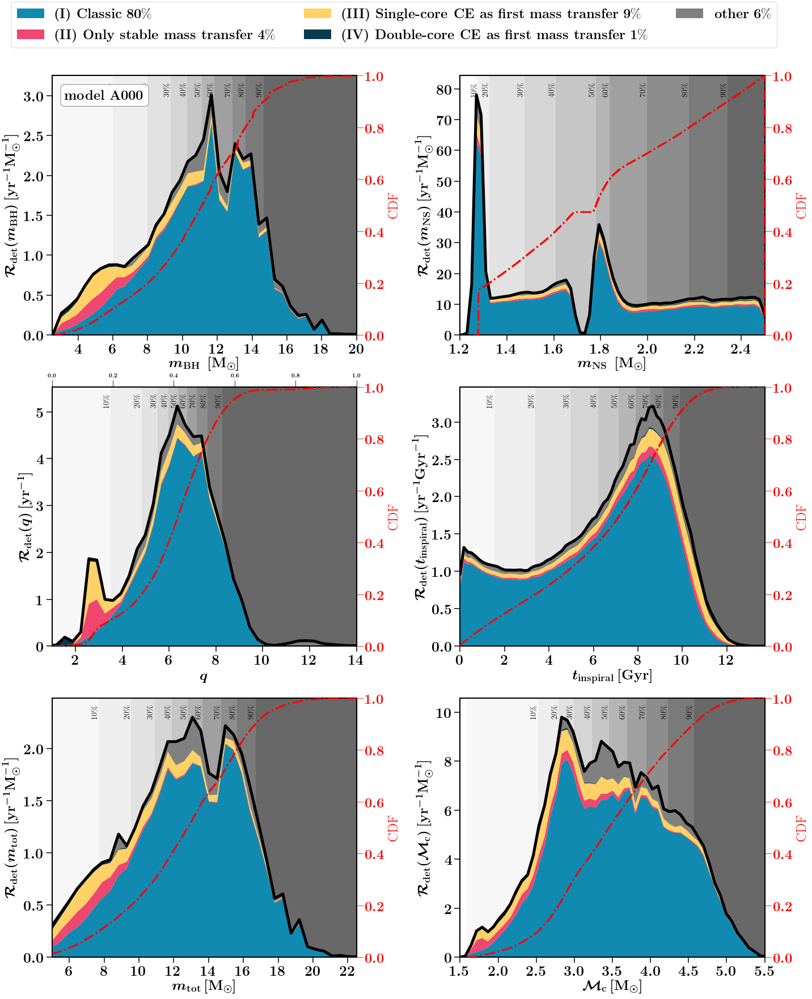

completed figure


In [89]:




Data_BHNS.MSSFR.Zprescription         = 'logNormal'
Data_BHNS.MSSFR.SFRprescription       = 'Neijssel et al. (2019)'
Data_BHNS.MSSFR.logNormalPrescription = 'Neijssel Phenomenological'



model = '000'




# dictChannelsList = ['classic',  'double-core CE', 'other']    
TYPE = 'BHNS' 
whichWeight='observed'
Nbins= .04#1#25 #.05#50 #.1 #50
Data = Data_BHNS

bps_model = 'A'

##
linewidth=3.5
ALPHA=0

# channelSystems = channelSystems_BHNS
channelSystems=None
dictRank=dictChannelsBHNS

f, ax= plt.subplots(ncols=2,nrows=3,figsize=(20,23), 
                  gridspec_kw={"width_ratios":[1.5, 1.5], "height_ratios":[2,2,2]})



fdata = h5.File(pathCOMPASOutput + 'COMPASOutput.h5')



####### BH MASS 
M1, M2 = Data_BHNS.COMPAS.mass1, Data_BHNS.COMPAS.mass2
MBH, MNS = obtainM1BHandM2BHassymetric(m1=M1, m2=M2)
print(len(MBH))
rate_disrupted = np.zeros(4)
# CHECK EJECTA MASS? 

allweight = np.sum(Data_BHNS.PerSystemPerRedshift_ratesObserved*Data_BHNS.COMPAS.weight, axis=0)


seedsSN = fdata['supernovae']['randomSeed'][...].squeeze()
# get only SN seeds for DCOs 
maskSNdco = np.in1d(seedsSN,  Data.COMPAS.seeds) 
whichSN = fdata['supernovae']['whichStar'][...].squeeze()[maskSNdco]
whichSN1 = whichSN[::2] # get whichStar for first SN 


separationPreSN = fdata['supernovae']['separationBefore'][...].squeeze()[maskSNdco]
separationPreSN2 = separationPreSN[1::2] # in Rsun. 
maskNSBH = ((whichSN1==2) & (M1>M2) ) | ((whichSN1==1) & (M1<M2) ) 

ii=0
rate_disrupted = np.zeros(6)
allweight = np.sum(Data_BHNS.PerSystemPerRedshift_ratesObserved*Data_BHNS.COMPAS.weight, axis=0)
labelMej = []
for ind_chi, chi in enumerate([0.0, .5, 'Qin']):
    if chi=='Qin':
        # Qin 2018 spin model 
        BH_chi = QinBHspinmodel(separationPreSN2, M1, M2, maskNSBH)
    else:    
        BH_chi   = chi * np.ones_like(MNS)

    for ind_Rns, NSradii in enumerate([11.5,13.0]):
        Rns = NSradii
        NS_radii = Rns * np.ones_like(MNS)

        Mej = calculateEjectedMassMerger(m_ns=MNS, r_ns=NS_radii, m_bh=MBH, Xeff=BH_chi)

        maskEjecta = (Mej > 0)
        combinedweight = np.sum(Data_BHNS.PerSystemPerRedshift_ratesObserved*Data_BHNS.COMPAS.weight, axis=0)[maskEjecta]

        rate_disrupted[ii]+= np.sum(combinedweight) / np.sum(allweight)
        labelMej.append('chi = ' + str(chi) + ' Rns = ' + str(NSradii) +' km')
        ii+=1





xvar = MBH
nameY = r'$ \mathcal{R}_{\rm{det}}(m_{\rm{BH}}) \, [\rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r' $m_{\rm{BH}}$ $ \,  [\rm{M}_{\odot}]$'

handles, labels=plotdesigndistributionLOOP(axe=ax[0,0], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                              xlim=[2.5,20], ylim=[0,7.5], whichWeight=whichWeight, channelSystems=channelSystems, indplot=0) 



modeltext = bps_model + model 
bbox_props = dict(boxstyle="round", fc="w", ec="0.5", alpha=0.95)
ax[0,0].annotate(r'\textbf{model %s}'%(modeltext), xy=(0.042, .95),\
 xycoords='axes fraction', fontsize = fs, weight = 'bold', ha='left', va="top",bbox=bbox_props,\
zorder=1E10)            


####### NS MASS 
xvar = MNS
nameY = r'$ \mathcal{R}_{\rm{det}}(m_{\rm{NS}}) \, [\rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r'$m_{\rm{NS}}$   $ \,  [\rm{M}_{\odot}]$ '

_,_=plotdesigndistributionLOOP(axe=ax[0,1], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                              xlim=[1.2,2.5], ylim=[0,200], whichWeight=whichWeight, channelSystems=channelSystems, indplot=1) 



####### mass ratio
xvar = MBH/MNS
nameY = r'$ \mathcal{R}_{\rm{det}}(q) \, [\rm{yr}^{-1}]  $'
nameX = r'$q$'

_,_=plotdesigndistributionLOOP(axe=ax[1,0], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                              xlim=[1,14], ylim=[0,17], whichWeight=whichWeight, channelSystems=channelSystems, indplot=2) 

######## INSPIRAL TIME
xvar = Data_BHNS.COMPAS.tc / 1000
nameY = r'$ \mathcal{R}_{\rm{det}}(t_{\rm{inspiral}}) \, [\rm{yr}^{-1}  \rm{Gyr}^{-1}]  $'
nameX = r'$t_{\rm{inspiral}} \, [\rm{Gyr}]$'

_,_=plotdesigndistributionLOOP(axe=ax[1,1], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                              xlim=[0,13.7], ylim=[0,15], whichWeight=whichWeight, channelSystems=channelSystems, indplot=3) 




####### mass total
xvar = MBH+MNS
nameY = r'$ \mathcal{R}_{\rm{det}}(m_{\rm{tot}}) \, [\rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r'$m_{\rm{tot}} \,  [\rm{M}_{\odot}]$'

_,_=plotdesigndistributionLOOP(axe=ax[2,0], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                              xlim=[5,22.5], ylim=[0,7], whichWeight=whichWeight, channelSystems=channelSystems, indplot=4) 


####### mass chirp
xvar = chirpmass(MBH, MNS)
nameY = r'$ \mathcal{R}_{\rm{det}}(\mathcal{M}_{\rm{c}}) \, [\rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r'$\mathcal{M}_{\rm{c}} \,  [\rm{M}_{\odot}]$'

_,_=plotdesigndistributionLOOP(axe=ax[2,1], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                              xlim=[1.5,5.5], ylim=[0,33], whichWeight=whichWeight, channelSystems=channelSystems, indplot=5) 

# ###########


# LEGEND
lgd = f.legend(handles, labels, fontsize=fs, ncol=3,\
         bbox_to_anchor=(0.96, 1.07),  markerscale=3., scatterpoints=1) # loc = 'upper center')




plt.tight_layout()
plt.subplots_adjust(wspace=0.34, hspace=0.2)
plt.savefig('DistributionsPlots' + TYPE + '/' + whichWeight +'_'+bps_model + model +'.pdf',  transparent=False,\
           bbox_extra_artists=(lgd,), bbox_inches='tight')
plt.savefig('DistributionsPlots' + TYPE + '/' + whichWeight +'_'+bps_model + model +'.png',  transparent=False,\
           bbox_extra_artists=(lgd,), bbox_inches='tight')
plt.show()
plt.show()
plt.close()
print('completed figure')





In [93]:
# print(rate_disrupted)
# print(labelMej)

print
for ii in range(6):
    print(labelMej[ii])
    print(rate_disrupted[ii])
    print


chi = 0.0 Rns = 11.5 km
0.013209696528487443

chi = 0.0 Rns = 13.0 km
0.03628019277618037

chi = 0.5 Rns = 11.5 km
0.1000923657376319

chi = 0.5 Rns = 13.0 km
0.23850469651248243

chi = Qin Rns = 11.5 km
0.017533078572950528

chi = Qin Rns = 13.0 km
0.041127049206122965



# All other SFRD(Z,Z)

('now at mssfr xyz=', '111')
('now at SFRD: ', '111')
1525553
\textbf{(I) Classic} $79$\%
\textbf{(II) Only stable mass transfer} $3$\%
\textbf{(III) Single-core CE as first mass transfer} $11$\%
\textbf{(IV) Double-core CE as first mass transfer} $1$\%
\textbf{other} $6$\%
filling till end
filling till end
filling till end
filling till end
filling till end
filling till end


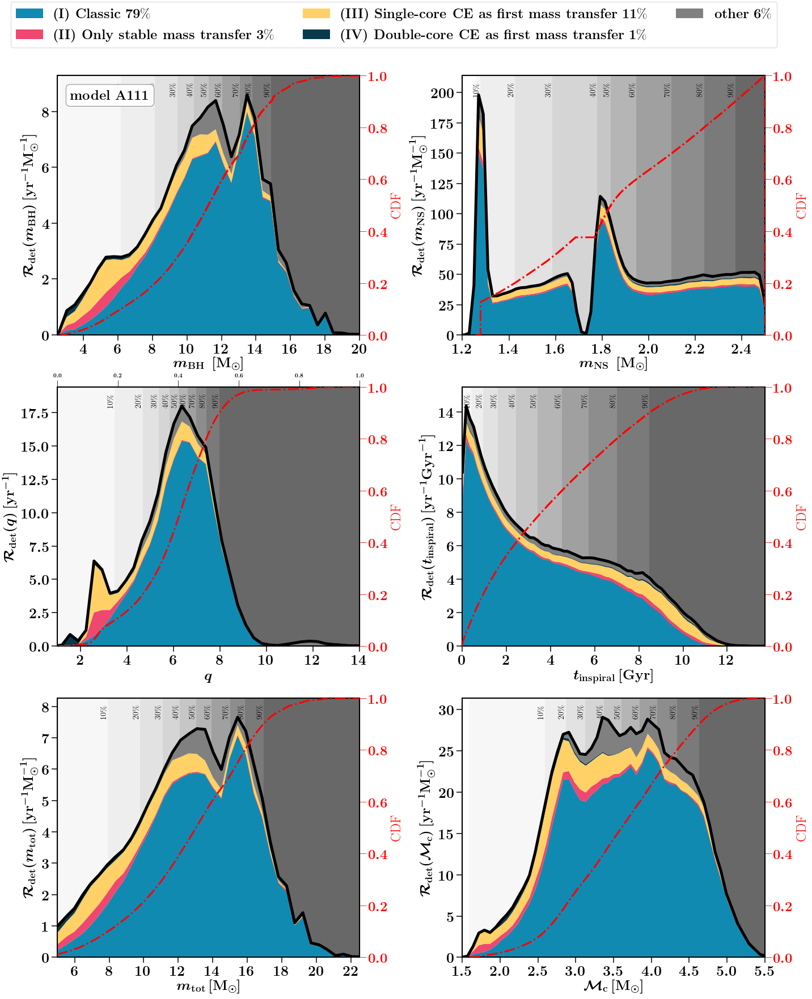

completed figure
('now at mssfr xyz=', '211')
('now at SFRD: ', '211')
1525553
\textbf{(I) Classic} $76$\%
\textbf{(II) Only stable mass transfer} $4$\%
\textbf{(III) Single-core CE as first mass transfer} $13$\%
\textbf{(IV) Double-core CE as first mass transfer} $1$\%
\textbf{other} $7$\%
filling till end
filling till end
filling till end
filling till end
filling till end
filling till end


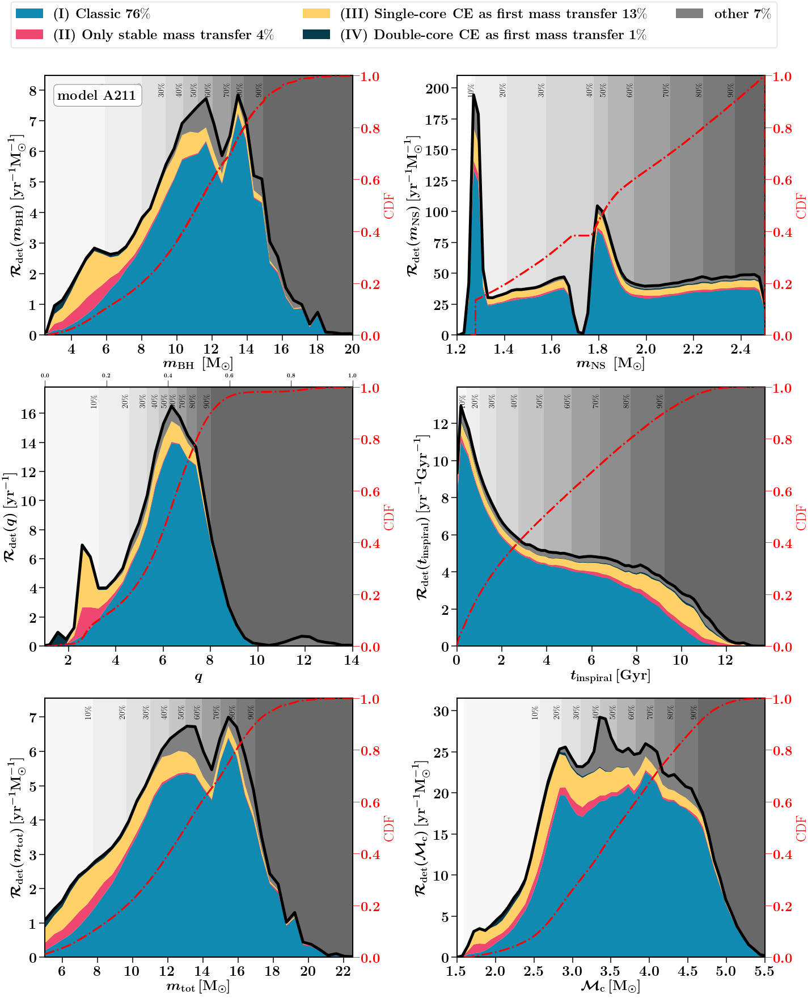

completed figure
('now at mssfr xyz=', '311')
('now at SFRD: ', '311')
1525553
\textbf{(I) Classic} $78$\%
\textbf{(II) Only stable mass transfer} $3$\%
\textbf{(III) Single-core CE as first mass transfer} $12$\%
\textbf{(IV) Double-core CE as first mass transfer} $1$\%
\textbf{other} $6$\%
filling till end
filling till end
filling till end
filling till end
filling till end
filling till end


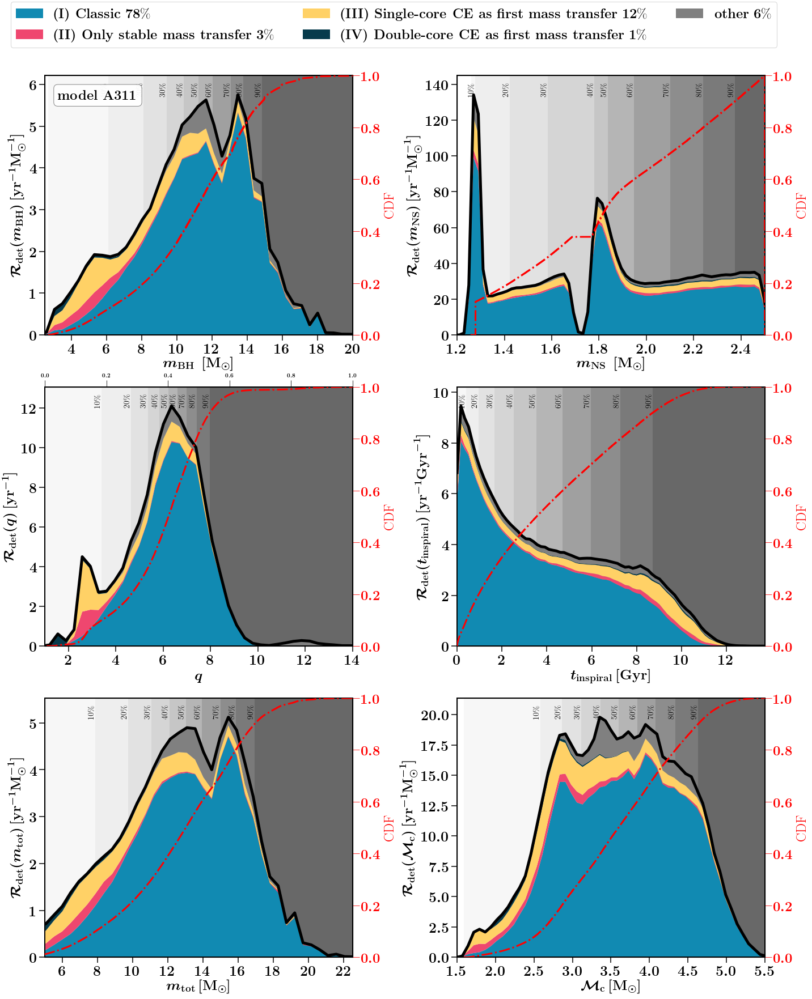

completed figure
('now at mssfr xyz=', '112')
('now at SFRD: ', '112')
1525553
\textbf{(I) Classic} $84$\%
\textbf{(II) Only stable mass transfer} $4$\%
\textbf{(III) Single-core CE as first mass transfer} $6$\%
\textbf{(IV) Double-core CE as first mass transfer} $0$\%
\textbf{other} $6$\%
filling till end
filling till end
filling till end
filling till end
filling till end
filling till end


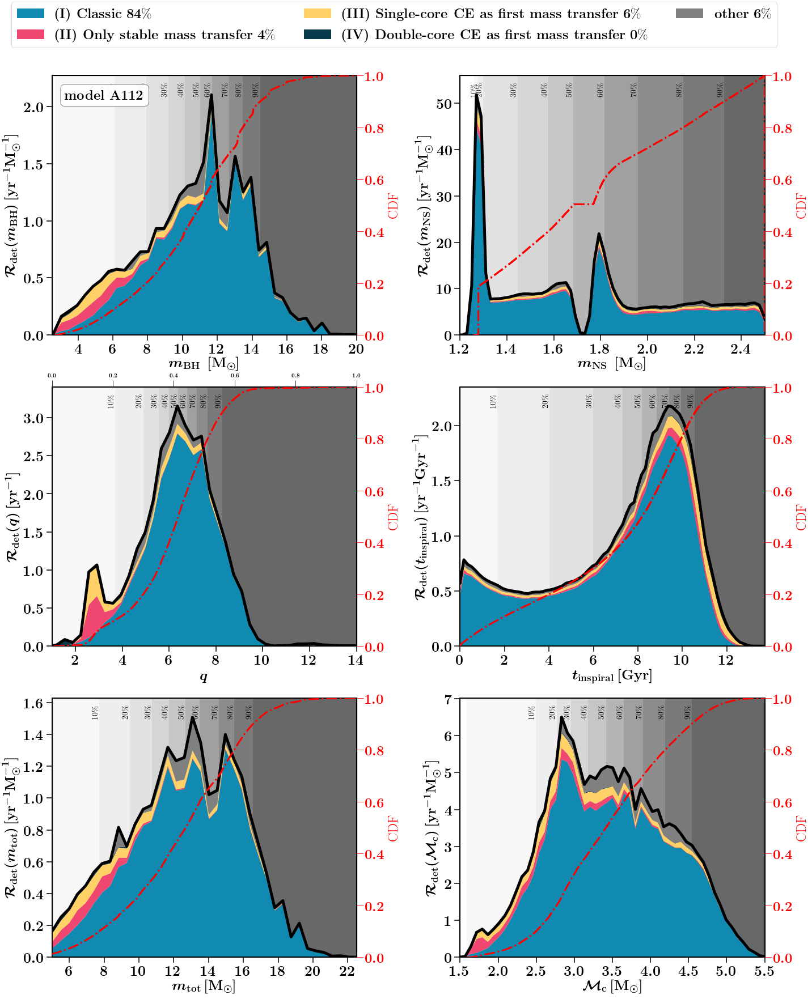

completed figure
('now at mssfr xyz=', '212')
('now at SFRD: ', '212')
1525553
\textbf{(I) Classic} $78$\%
\textbf{(II) Only stable mass transfer} $5$\%
\textbf{(III) Single-core CE as first mass transfer} $10$\%
\textbf{(IV) Double-core CE as first mass transfer} $1$\%
\textbf{other} $7$\%
filling till end
filling till end
filling till end
filling till end
filling till end
filling till end


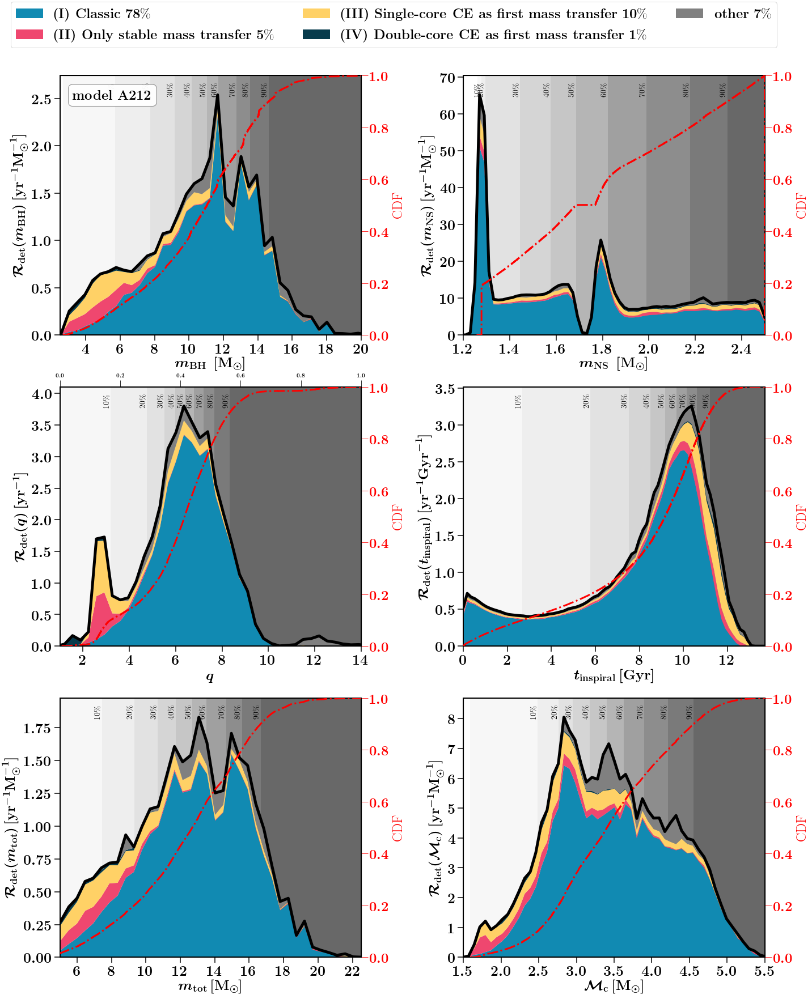

completed figure
('now at mssfr xyz=', '312')
('now at SFRD: ', '312')
1525553
\textbf{(I) Classic} $84$\%
\textbf{(II) Only stable mass transfer} $4$\%
\textbf{(III) Single-core CE as first mass transfer} $6$\%
\textbf{(IV) Double-core CE as first mass transfer} $0$\%
\textbf{other} $6$\%
filling till end
filling till end
filling till end
filling till end
filling till end
filling till end


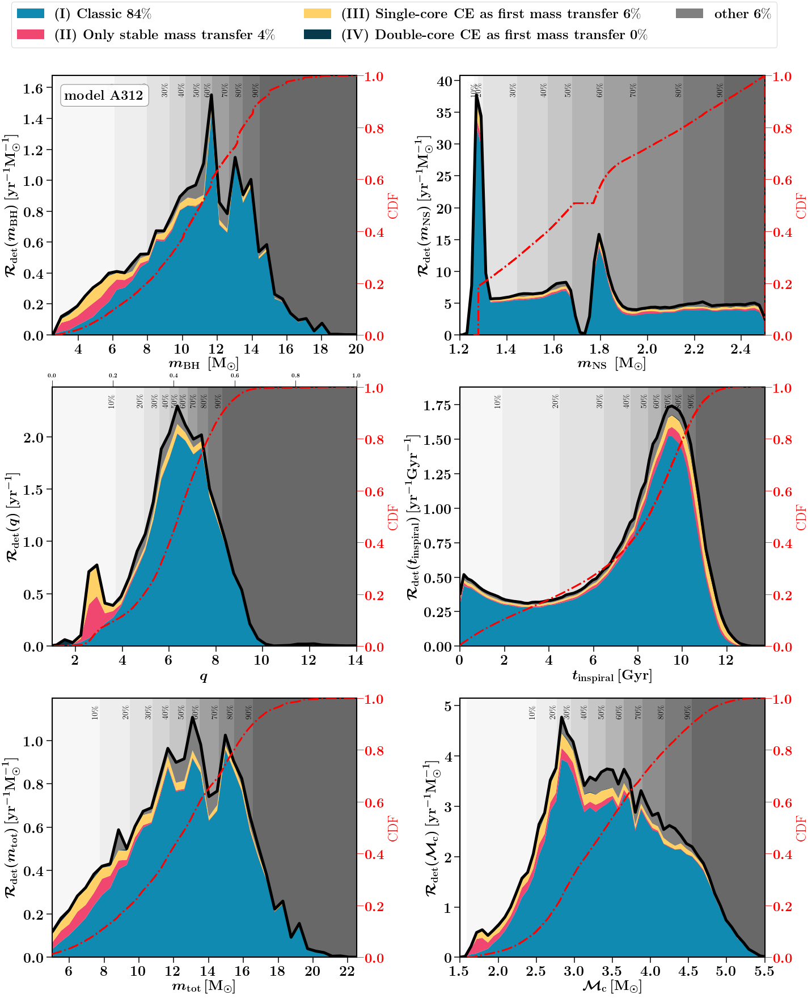

completed figure
('now at mssfr xyz=', '113')
('now at SFRD: ', '113')
1525553
\textbf{(I) Classic} $87$\%
\textbf{(II) Only stable mass transfer} $4$\%
\textbf{(III) Single-core CE as first mass transfer} $3$\%
\textbf{(IV) Double-core CE as first mass transfer} $0$\%
\textbf{other} $6$\%
filling till end
filling till end
filling till end
filling till end
filling till end
filling till end


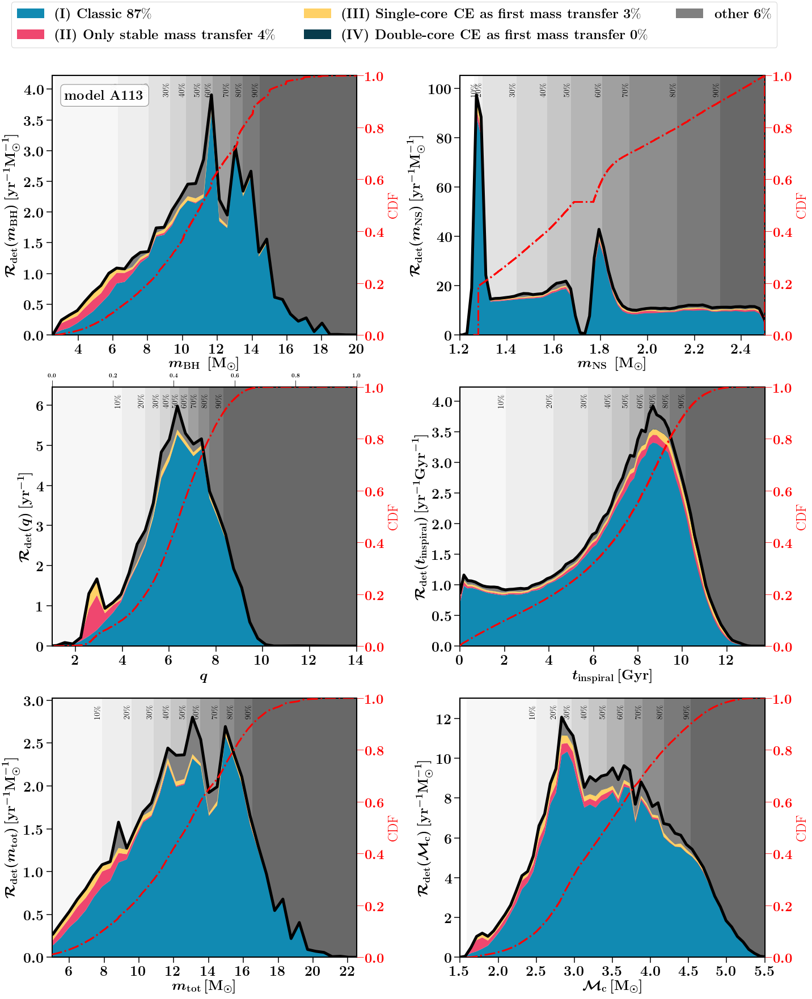

completed figure
('now at mssfr xyz=', '213')
('now at SFRD: ', '213')
1525553
\textbf{(I) Classic} $86$\%
\textbf{(II) Only stable mass transfer} $4$\%
\textbf{(III) Single-core CE as first mass transfer} $5$\%
\textbf{(IV) Double-core CE as first mass transfer} $0$\%
\textbf{other} $6$\%
filling till end
filling till end
filling till end
filling till end
filling till end
filling till end


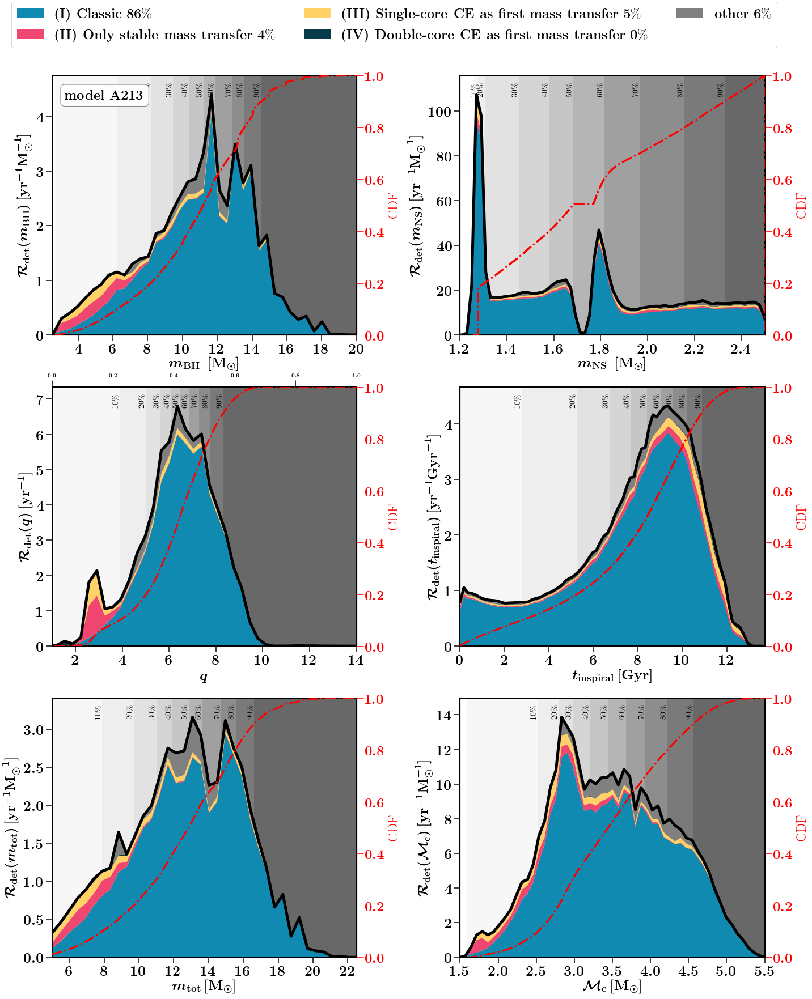

completed figure
('now at mssfr xyz=', '313')
('now at SFRD: ', '313')
1525553
\textbf{(I) Classic} $87$\%
\textbf{(II) Only stable mass transfer} $4$\%
\textbf{(III) Single-core CE as first mass transfer} $3$\%
\textbf{(IV) Double-core CE as first mass transfer} $0$\%
\textbf{other} $6$\%
filling till end
filling till end
filling till end
filling till end
filling till end
filling till end


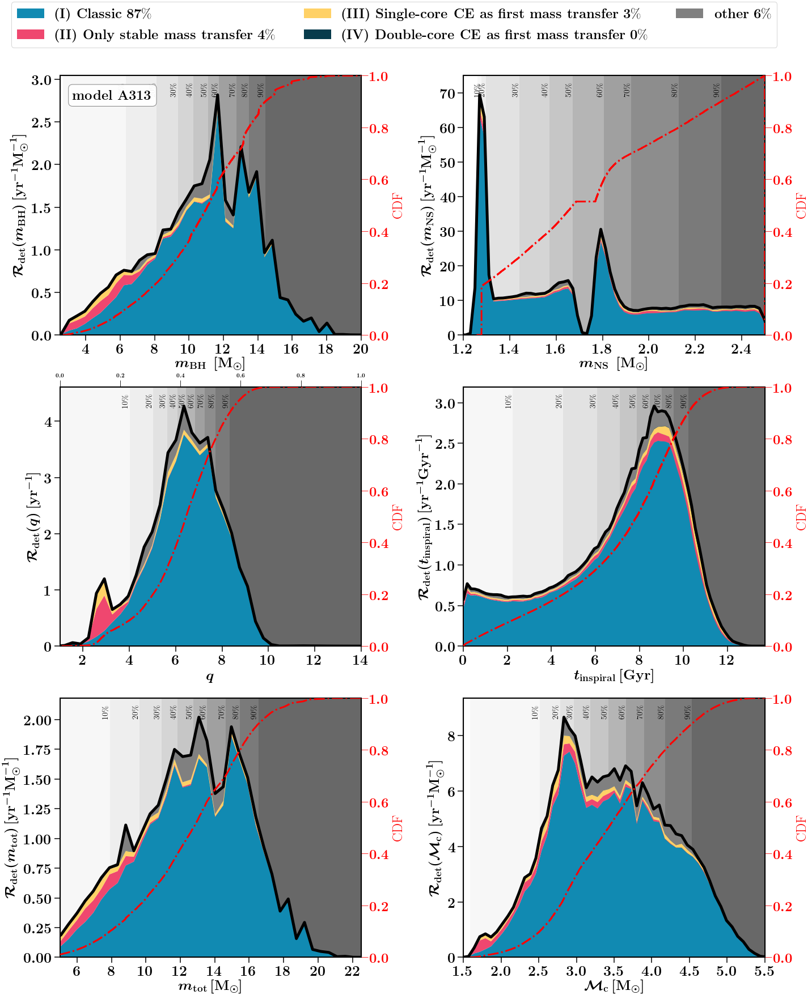

completed figure
('now at mssfr xyz=', '121')
('now at SFRD: ', '121')
1525553
\textbf{(I) Classic} $76$\%
\textbf{(II) Only stable mass transfer} $3$\%
\textbf{(III) Single-core CE as first mass transfer} $13$\%
\textbf{(IV) Double-core CE as first mass transfer} $1$\%
\textbf{other} $7$\%
filling till end
filling till end
filling till end
filling till end
filling till end
filling till end


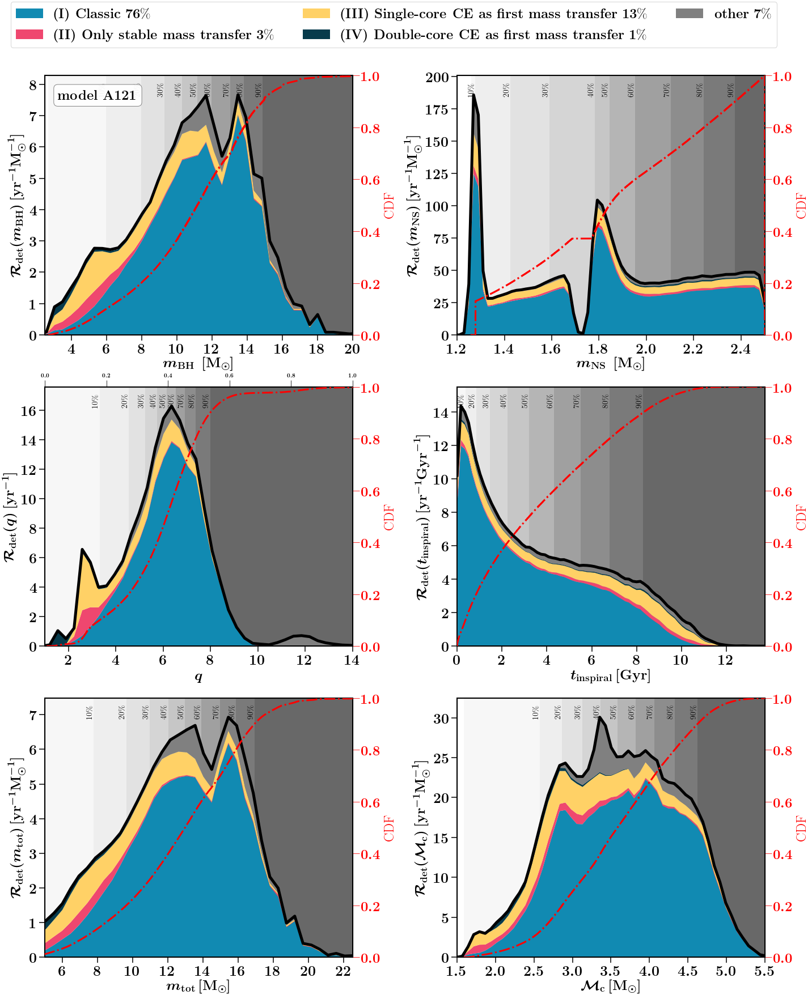

completed figure
('now at mssfr xyz=', '221')
('now at SFRD: ', '221')
1525553
\textbf{(I) Classic} $73$\%
\textbf{(II) Only stable mass transfer} $4$\%
\textbf{(III) Single-core CE as first mass transfer} $14$\%
\textbf{(IV) Double-core CE as first mass transfer} $1$\%
\textbf{other} $8$\%
filling till end
filling till end
filling till end
filling till end
filling till end
filling till end


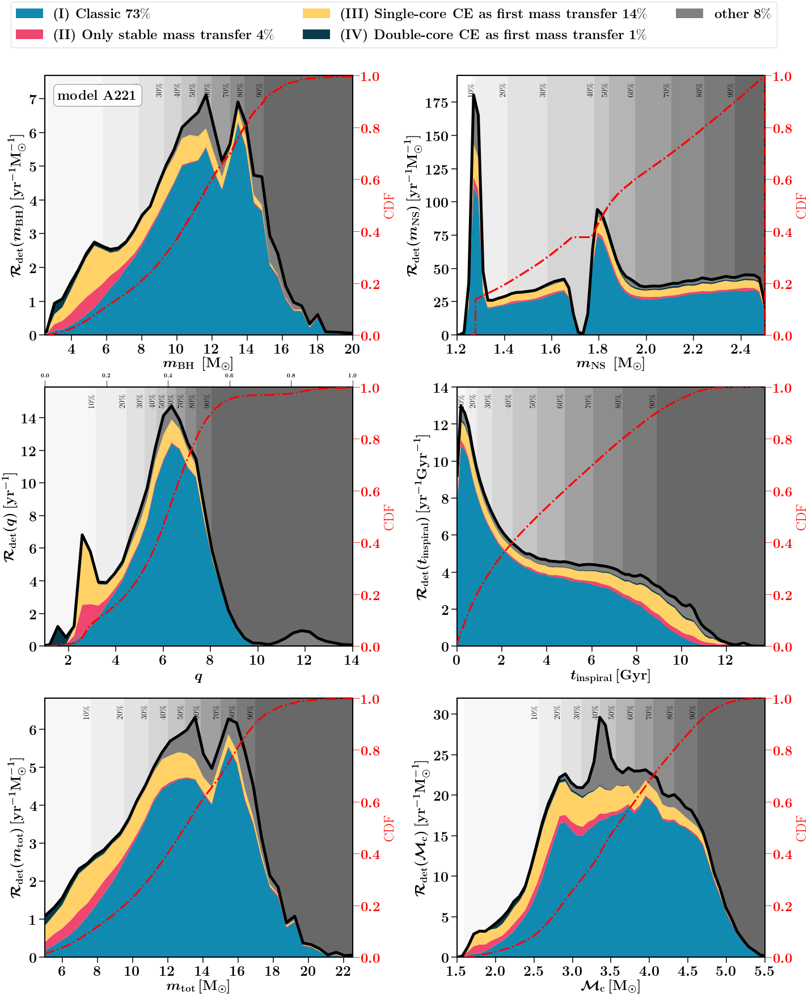

completed figure
('now at mssfr xyz=', '321')
('now at SFRD: ', '321')
1525553
\textbf{(I) Classic} $75$\%
\textbf{(II) Only stable mass transfer} $3$\%
\textbf{(III) Single-core CE as first mass transfer} $13$\%
\textbf{(IV) Double-core CE as first mass transfer} $1$\%
\textbf{other} $7$\%
filling till end
filling till end
filling till end
filling till end
filling till end
filling till end


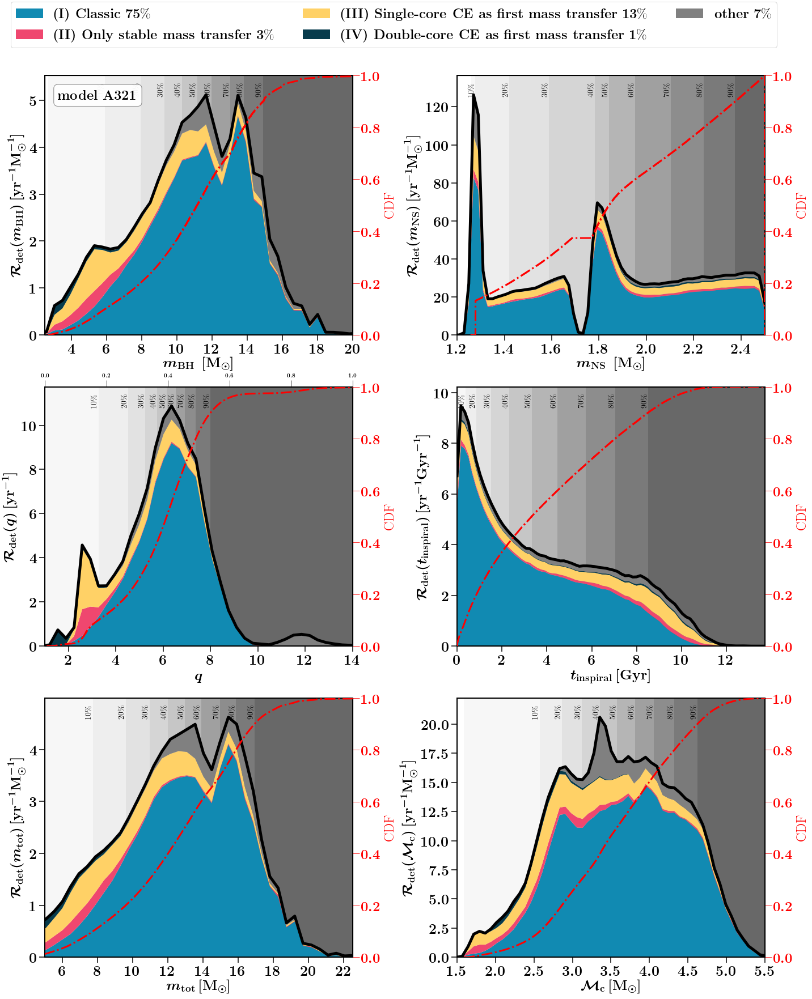

completed figure
('now at mssfr xyz=', '122')
('now at SFRD: ', '122')
1525553
\textbf{(I) Classic} $78$\%
\textbf{(II) Only stable mass transfer} $4$\%
\textbf{(III) Single-core CE as first mass transfer} $10$\%
\textbf{(IV) Double-core CE as first mass transfer} $1$\%
\textbf{other} $7$\%
filling till end
filling till end
filling till end
filling till end
filling till end
filling till end


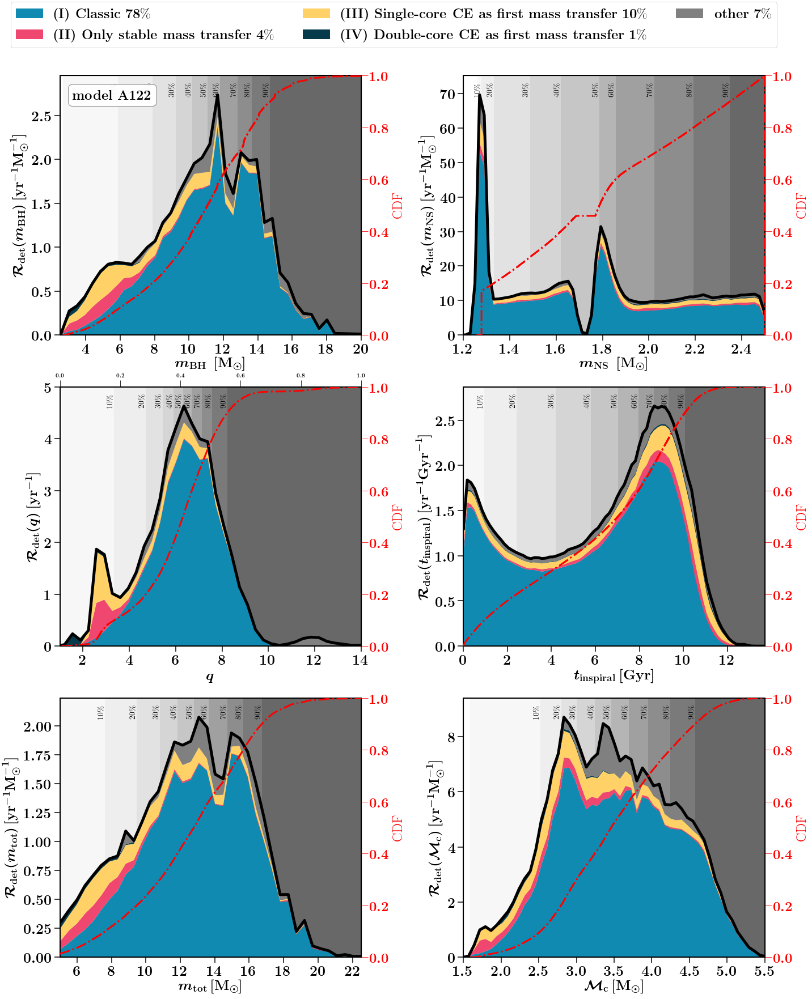

completed figure
('now at mssfr xyz=', '222')
('now at SFRD: ', '222')
1525553
\textbf{(I) Classic} $73$\%
\textbf{(II) Only stable mass transfer} $5$\%
\textbf{(III) Single-core CE as first mass transfer} $13$\%
\textbf{(IV) Double-core CE as first mass transfer} $1$\%
\textbf{other} $8$\%
filling till end
filling till end
filling till end
filling till end
filling till end
filling till end


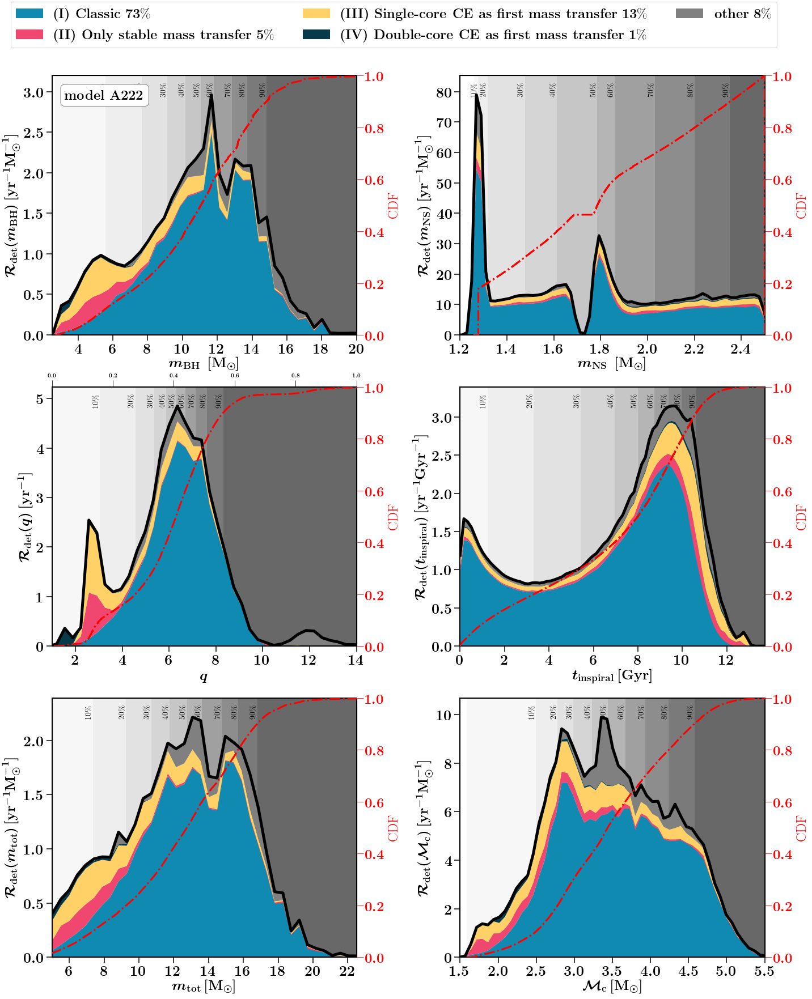

completed figure
('now at mssfr xyz=', '322')
('now at SFRD: ', '322')
1525553
\textbf{(I) Classic} $78$\%
\textbf{(II) Only stable mass transfer} $4$\%
\textbf{(III) Single-core CE as first mass transfer} $11$\%
\textbf{(IV) Double-core CE as first mass transfer} $1$\%
\textbf{other} $7$\%
filling till end
filling till end
filling till end
filling till end
filling till end
filling till end


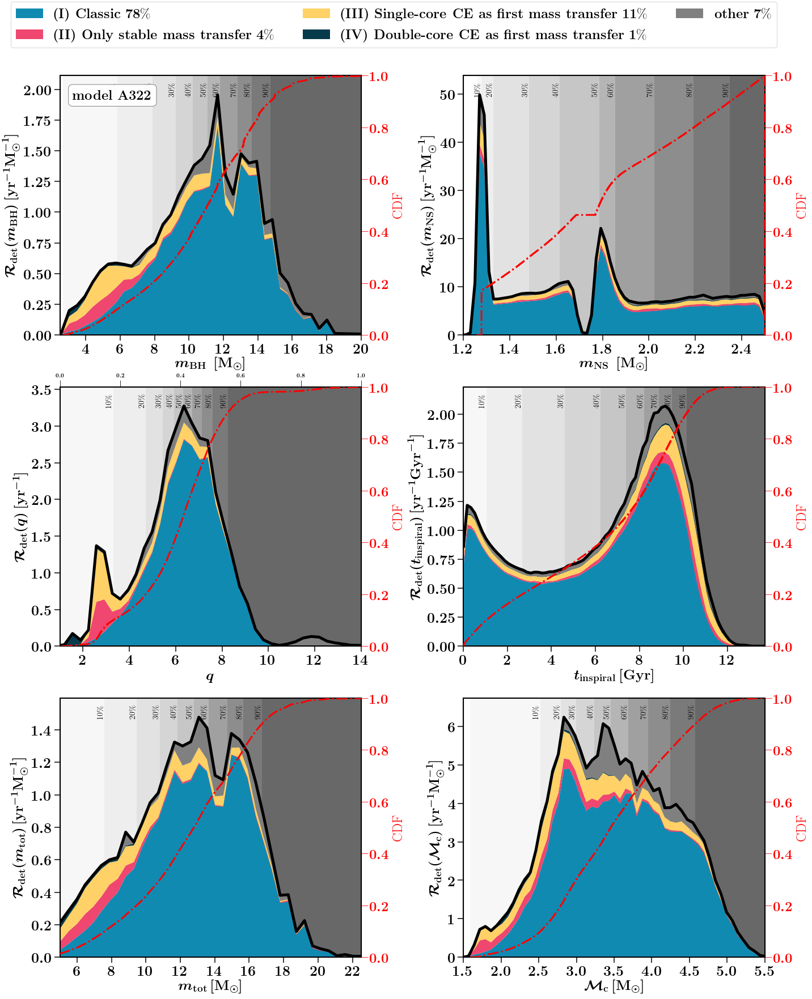

completed figure
('now at mssfr xyz=', '123')
('now at SFRD: ', '123')
1525553
\textbf{(I) Classic} $82$\%
\textbf{(II) Only stable mass transfer} $4$\%
\textbf{(III) Single-core CE as first mass transfer} $8$\%
\textbf{(IV) Double-core CE as first mass transfer} $1$\%
\textbf{other} $6$\%
filling till end
filling till end
filling till end
filling till end
filling till end
filling till end


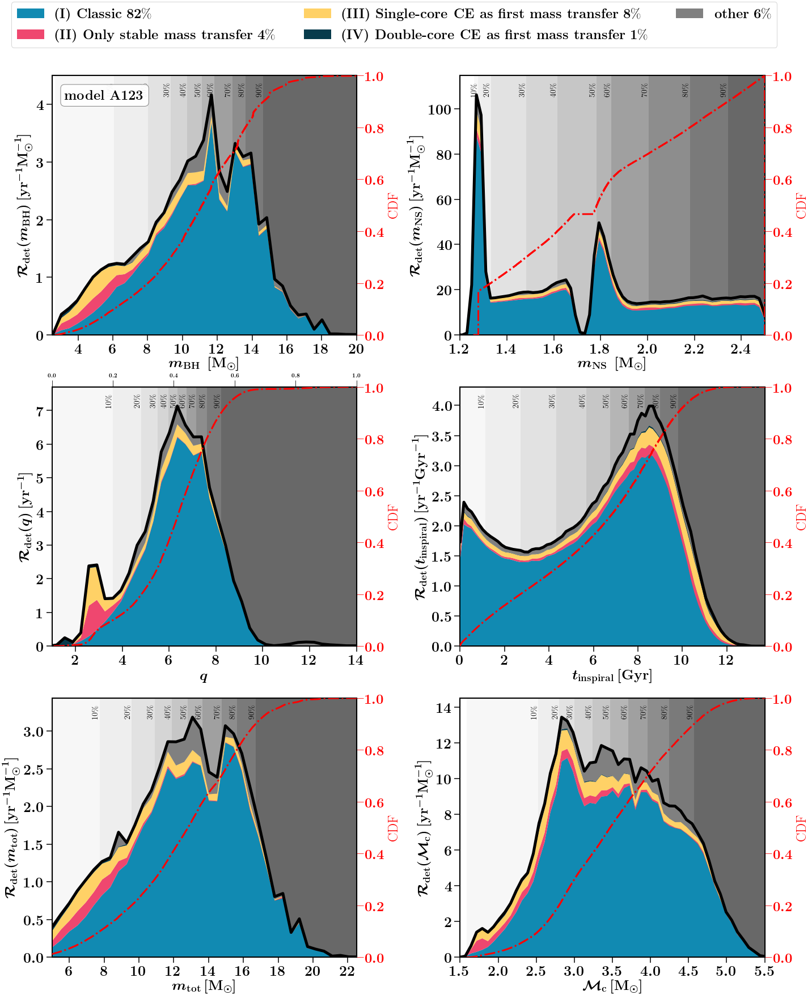

completed figure
('now at mssfr xyz=', '223')
('now at SFRD: ', '223')
1525553
\textbf{(I) Classic} $78$\%
\textbf{(II) Only stable mass transfer} $4$\%
\textbf{(III) Single-core CE as first mass transfer} $10$\%
\textbf{(IV) Double-core CE as first mass transfer} $1$\%
\textbf{other} $7$\%
filling till end
filling till end
filling till end
filling till end
filling till end
filling till end


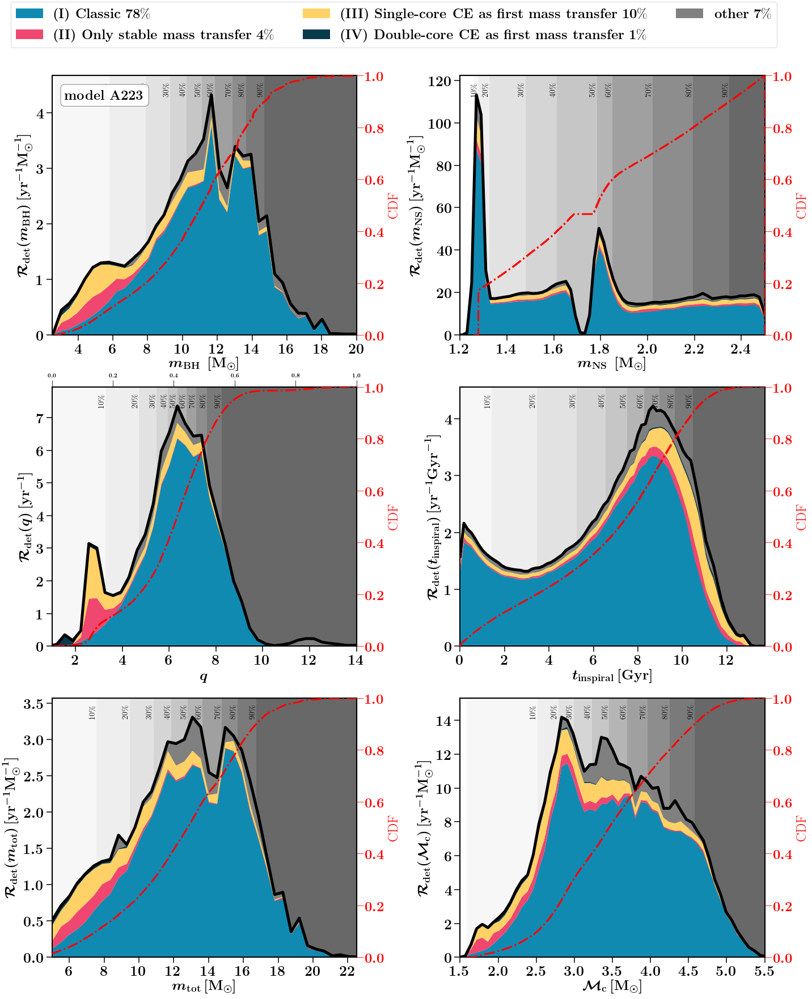

completed figure
('now at mssfr xyz=', '323')
('now at SFRD: ', '323')
1525553
\textbf{(I) Classic} $81$\%
\textbf{(II) Only stable mass transfer} $4$\%
\textbf{(III) Single-core CE as first mass transfer} $8$\%
\textbf{(IV) Double-core CE as first mass transfer} $1$\%
\textbf{other} $6$\%
filling till end
filling till end
filling till end
filling till end
filling till end
filling till end


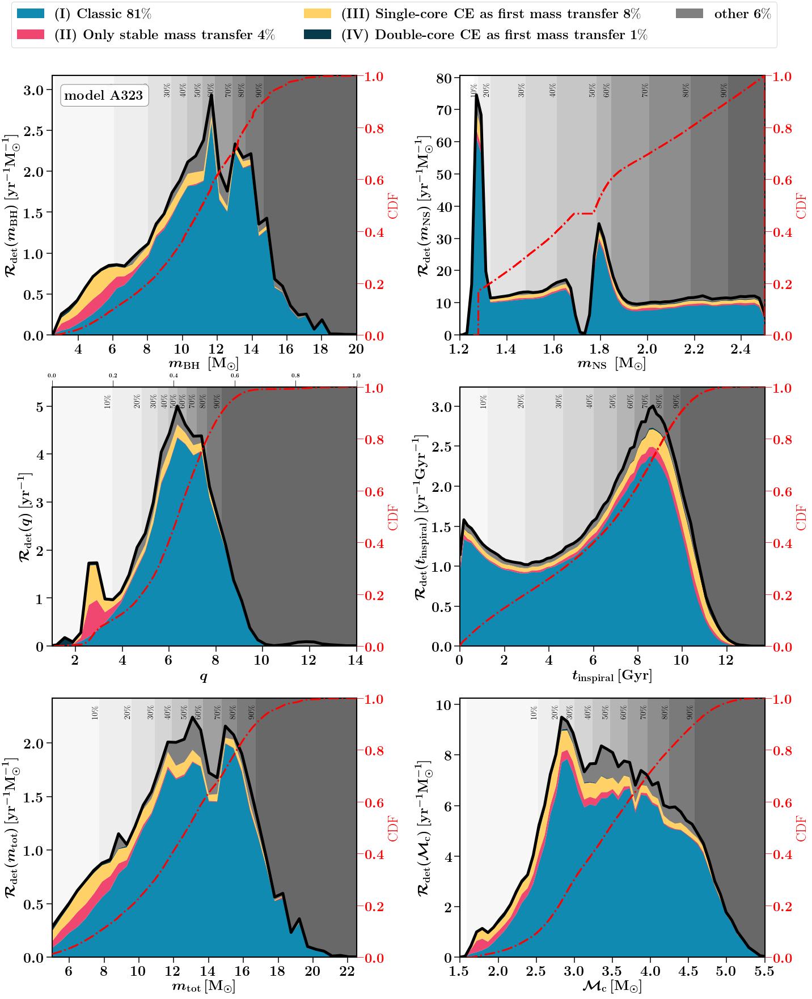

completed figure
('now at mssfr xyz=', '131')
('now at SFRD: ', '131')
1525553
\textbf{(I) Classic} $76$\%
\textbf{(II) Only stable mass transfer} $3$\%
\textbf{(III) Single-core CE as first mass transfer} $13$\%
\textbf{(IV) Double-core CE as first mass transfer} $1$\%
\textbf{other} $7$\%
filling till end
filling till end
filling till end
filling till end
filling till end
filling till end


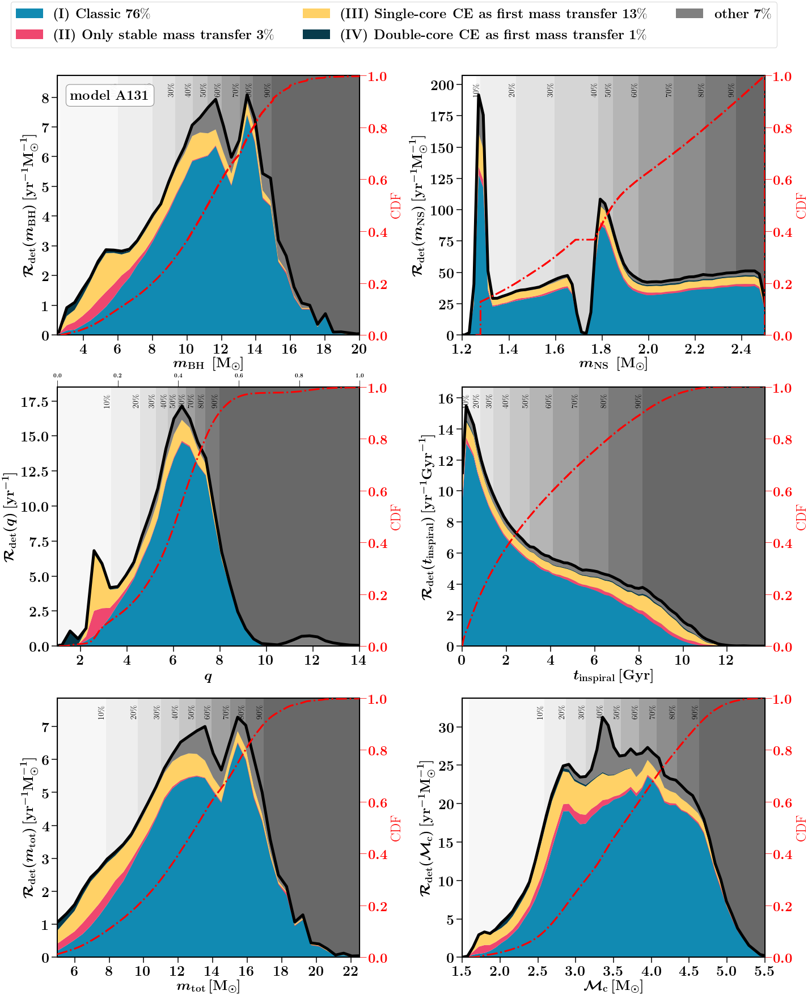

completed figure
('now at mssfr xyz=', '231')
('now at SFRD: ', '231')
1525553
\textbf{(I) Classic} $74$\%
\textbf{(II) Only stable mass transfer} $4$\%
\textbf{(III) Single-core CE as first mass transfer} $14$\%
\textbf{(IV) Double-core CE as first mass transfer} $1$\%
\textbf{other} $8$\%
filling till end
filling till end
filling till end
filling till end
filling till end
filling till end


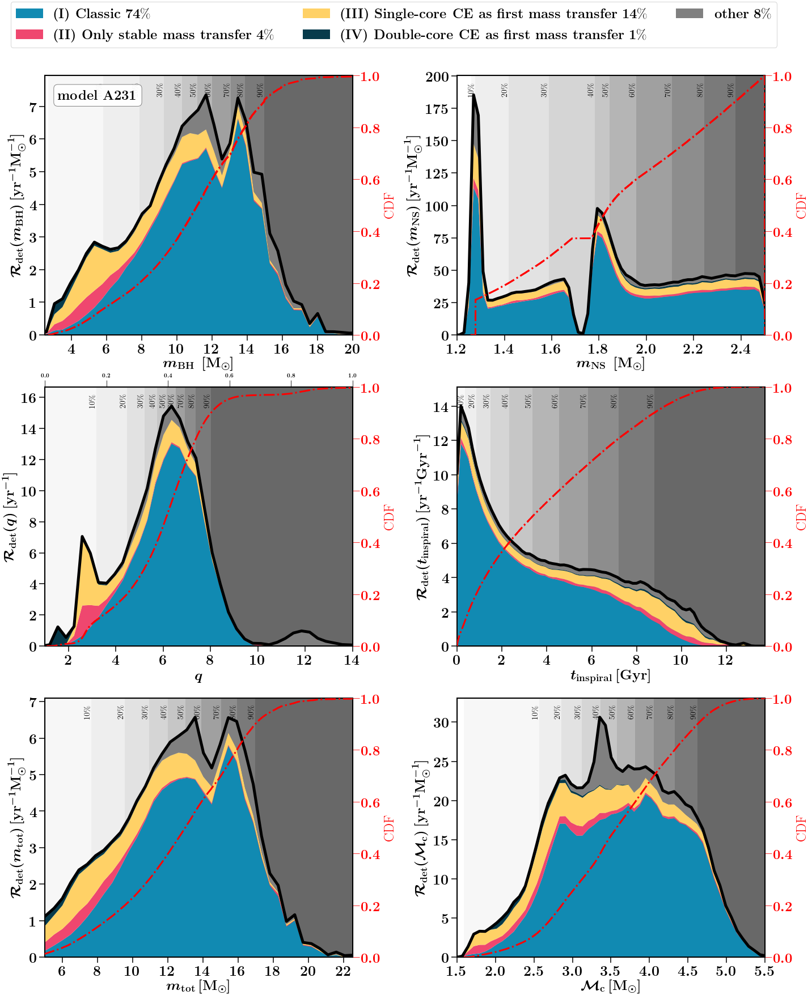

completed figure
('now at mssfr xyz=', '331')
('now at SFRD: ', '331')
1525553
\textbf{(I) Classic} $75$\%
\textbf{(II) Only stable mass transfer} $3$\%
\textbf{(III) Single-core CE as first mass transfer} $13$\%
\textbf{(IV) Double-core CE as first mass transfer} $1$\%
\textbf{other} $7$\%
filling till end
filling till end
filling till end
filling till end
filling till end
filling till end


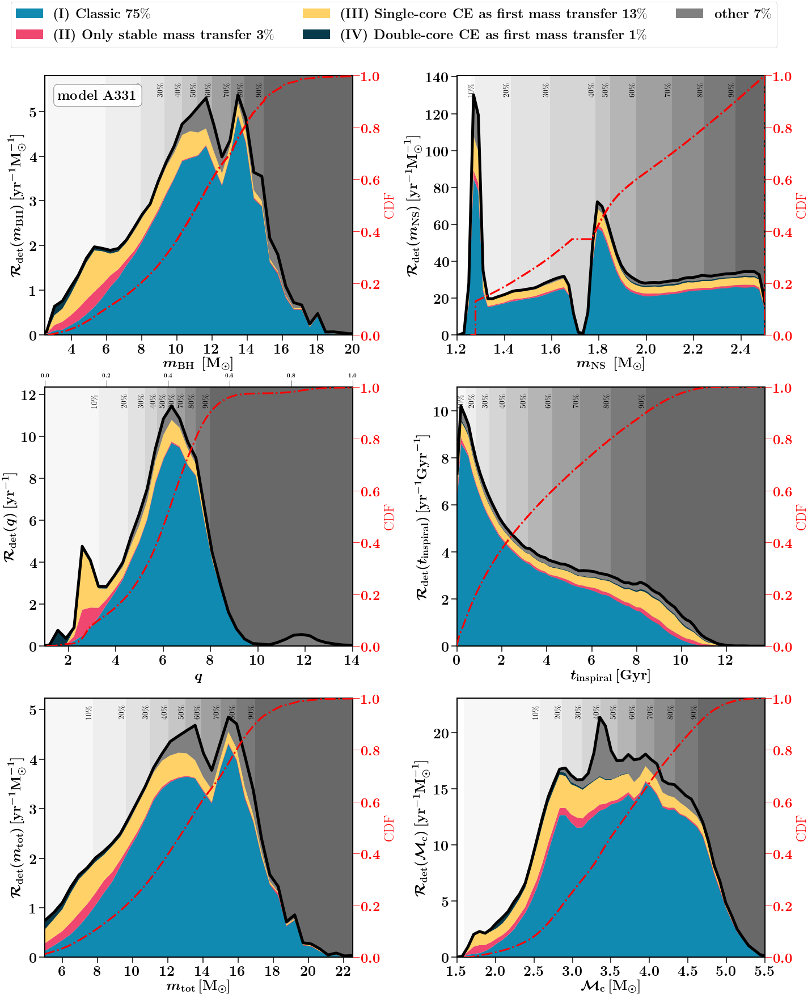

completed figure
('now at mssfr xyz=', '132')
('now at SFRD: ', '132')
1525553
\textbf{(I) Classic} $77$\%
\textbf{(II) Only stable mass transfer} $4$\%
\textbf{(III) Single-core CE as first mass transfer} $11$\%
\textbf{(IV) Double-core CE as first mass transfer} $1$\%
\textbf{other} $7$\%
filling till end
filling till end
filling till end
filling till end
filling till end
filling till end


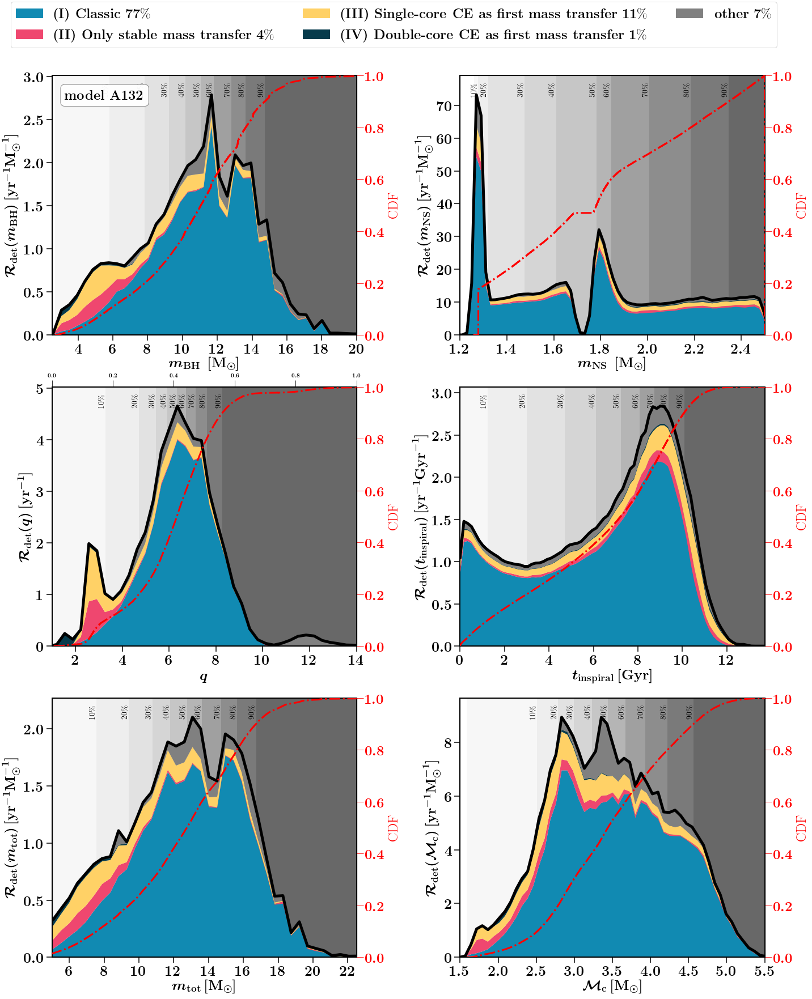

completed figure
('now at mssfr xyz=', '232')
('now at SFRD: ', '232')
1525553
\textbf{(I) Classic} $72$\%
\textbf{(II) Only stable mass transfer} $5$\%
\textbf{(III) Single-core CE as first mass transfer} $13$\%
\textbf{(IV) Double-core CE as first mass transfer} $1$\%
\textbf{other} $8$\%
filling till end
filling till end
filling till end
filling till end
filling till end
filling till end


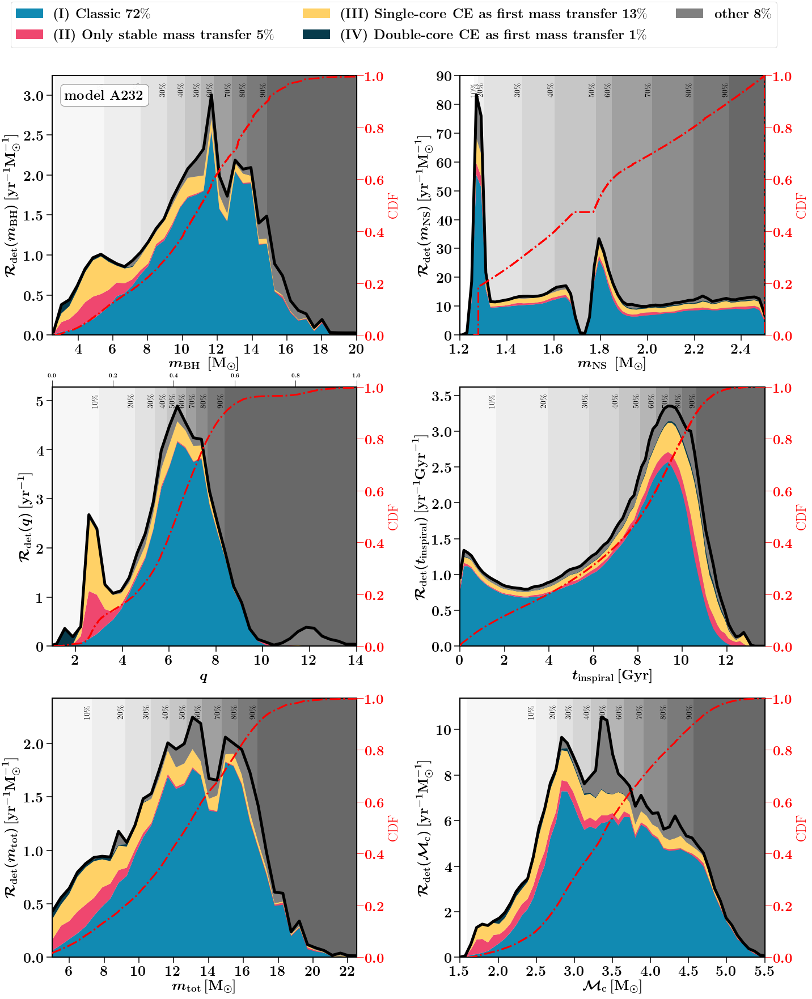

completed figure
('now at mssfr xyz=', '332')
('now at SFRD: ', '332')
1525553
\textbf{(I) Classic} $76$\%
\textbf{(II) Only stable mass transfer} $5$\%
\textbf{(III) Single-core CE as first mass transfer} $11$\%
\textbf{(IV) Double-core CE as first mass transfer} $1$\%
\textbf{other} $7$\%
filling till end
filling till end
filling till end
filling till end
filling till end
filling till end


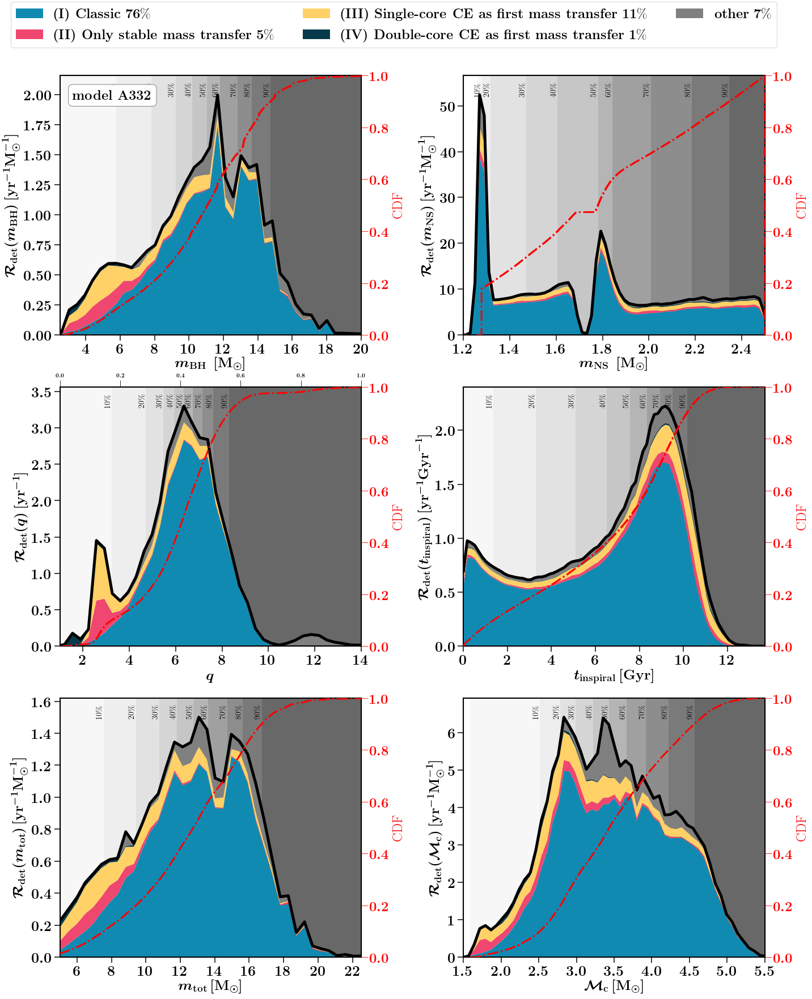

completed figure
('now at mssfr xyz=', '133')
('now at SFRD: ', '133')
1525553
\textbf{(I) Classic} $81$\%
\textbf{(II) Only stable mass transfer} $4$\%
\textbf{(III) Single-core CE as first mass transfer} $8$\%
\textbf{(IV) Double-core CE as first mass transfer} $1$\%
\textbf{other} $6$\%
filling till end
filling till end
filling till end
filling till end
filling till end
filling till end


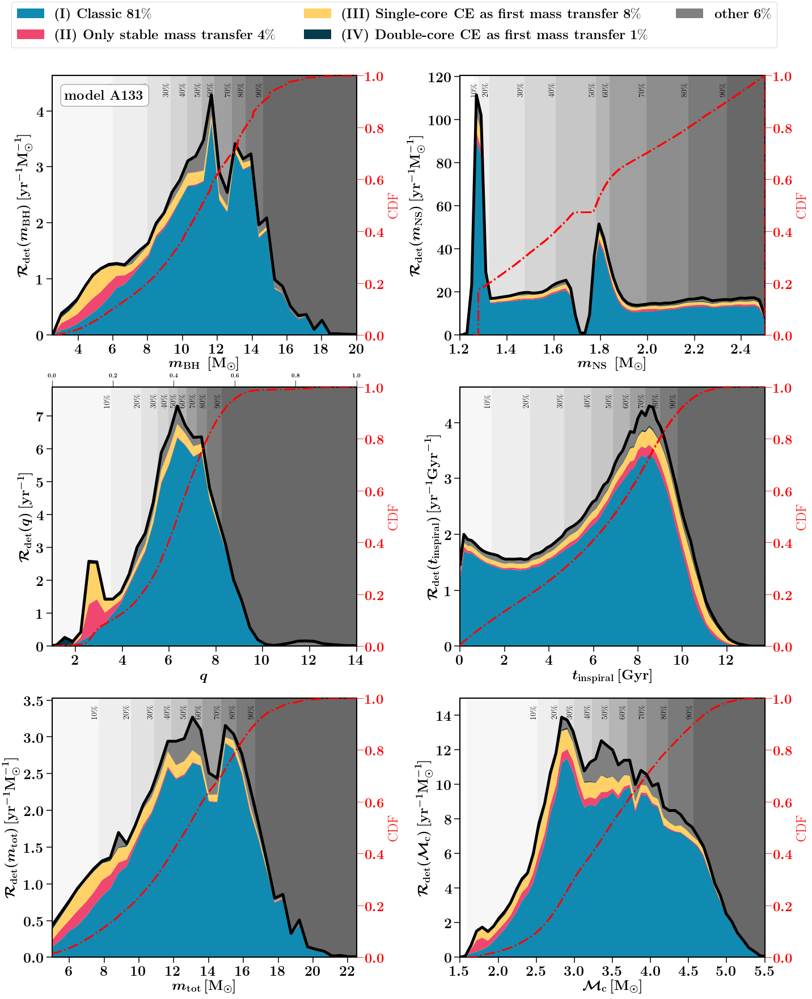

completed figure
('now at mssfr xyz=', '233')
('now at SFRD: ', '233')
1525553
\textbf{(I) Classic} $77$\%
\textbf{(II) Only stable mass transfer} $5$\%
\textbf{(III) Single-core CE as first mass transfer} $11$\%
\textbf{(IV) Double-core CE as first mass transfer} $1$\%
\textbf{other} $7$\%
filling till end
filling till end
filling till end
filling till end
filling till end
filling till end


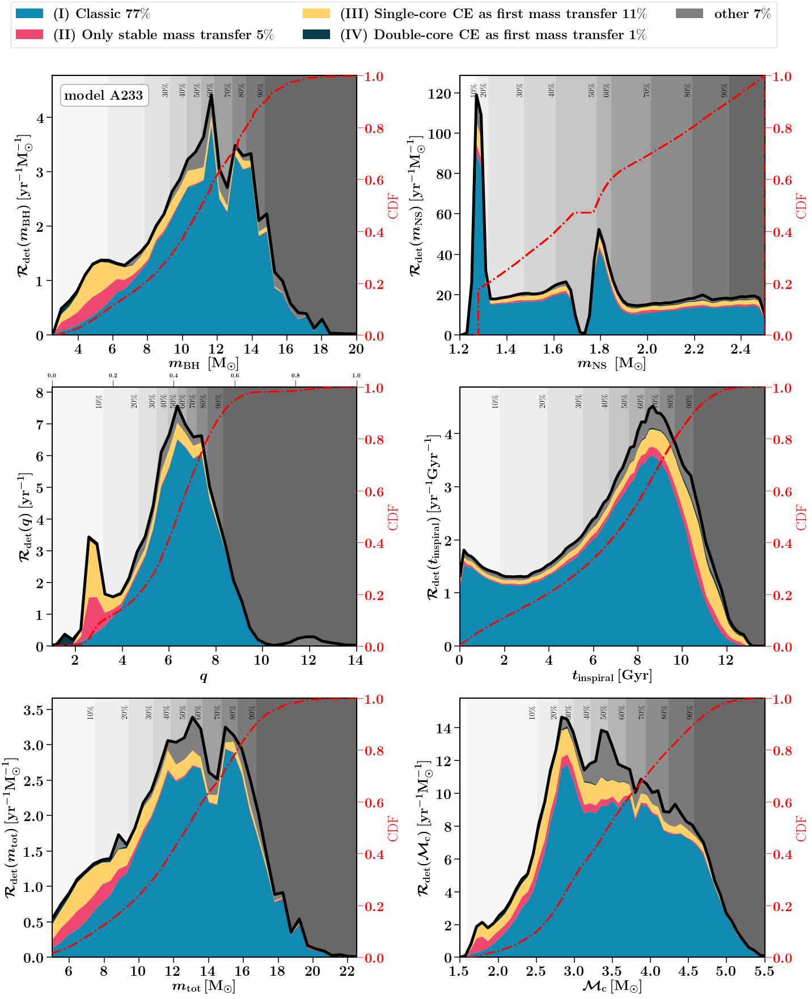

completed figure
('now at mssfr xyz=', '333')
('now at SFRD: ', '333')
1525553
\textbf{(I) Classic} $80$\%
\textbf{(II) Only stable mass transfer} $4$\%
\textbf{(III) Single-core CE as first mass transfer} $9$\%
\textbf{(IV) Double-core CE as first mass transfer} $1$\%
\textbf{other} $6$\%
filling till end
filling till end
filling till end
filling till end
filling till end
filling till end


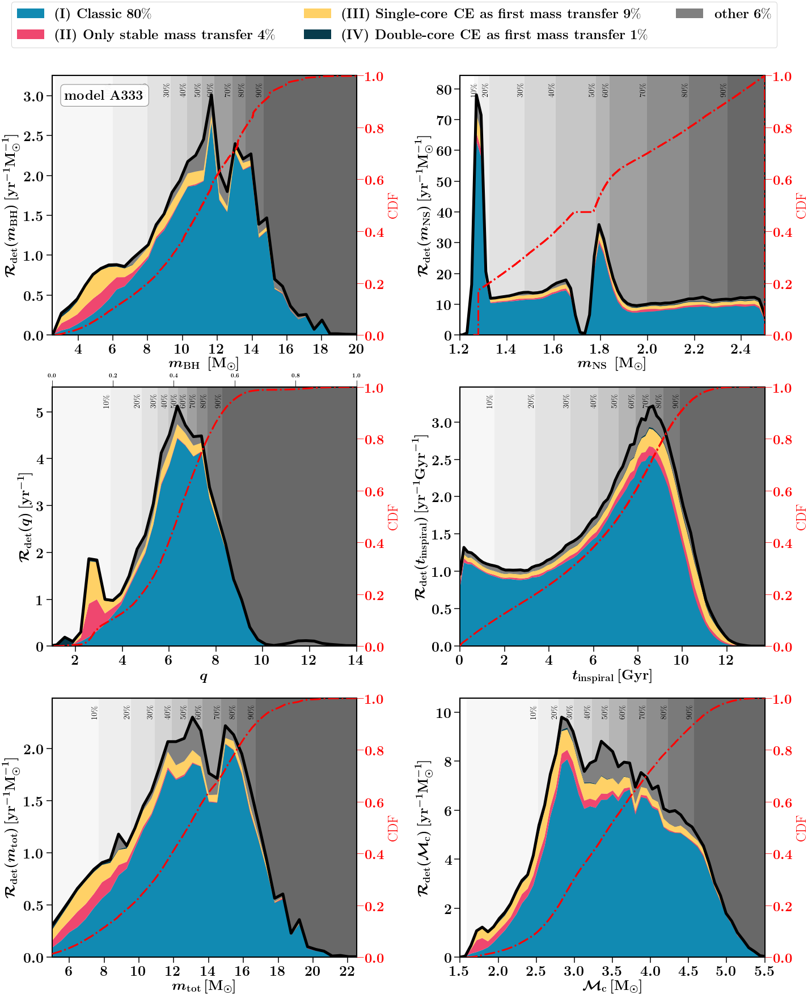

completed figure


In [88]:




for ind_GSMF, GSMF in enumerate(GSMFs):
    ind_y = ind_GSMF + 1
    for ind_MZ, MZ in enumerate(MZs):
        ind_z = ind_MZ +1
        for ind_SFR, SFR in enumerate(SFRs):
            ind_x = ind_SFR+1

            mssfrName = '%s%s%s'%(ind_x, ind_y, ind_z)   
            print('now at mssfr xyz=', mssfrName)

            Data.MSSFR.Zprescription         = 'MZ_GSMF'
            Data.MSSFR.SFRprescription       = SFR
#                 Data.MSSFR.logNormalPrescription = logNormal[nrL]
            Data.MSSFR.GSMFprescription      = GSMF
            Data.MSSFR.ZMprescription        = MZ
            Data.cosmologicalIntegration()




            model = str(ind_x) + str(ind_y) + str(ind_z)
            print('now at SFRD: ', model)




            # dictChannelsList = ['classic',  'double-core CE', 'other']    
            TYPE = 'BHNS' 
            whichWeight='observed'
            Nbins= .04#1#25 #.05#50 #.1 #50
            Data = Data_BHNS

            bps_model = 'A'

            ##
            linewidth=3.5
            ALPHA=0

            # channelSystems = channelSystems_BHNS
            channelSystems=None
            dictRank=dictChannelsBHNS

            f, ax= plt.subplots(ncols=2,nrows=3,figsize=(20,23), 
                              gridspec_kw={"width_ratios":[1.5, 1.5], "height_ratios":[2,2,2]})



            fdata = h5.File(pathCOMPASOutput + 'COMPASOutput.h5')



            ####### BH MASS 
            M1, M2 = Data_BHNS.COMPAS.mass1, Data_BHNS.COMPAS.mass2
            MBH, MNS = obtainM1BHandM2BHassymetric(m1=M1, m2=M2)
            print(len(MBH))
            # rate_disrupted = np.zeros(4)
            # # CHECK EJECTA MASS? 
            # ii=0
            # allweight = np.sum(Data_BHNS.PerSystemPerRedshift_ratesObserved*Data_BHNS.COMPAS.weight, axis=0)
            # for ind_chi, chi in enumerate([0.0, 0.5]):
            #     BH_chi   = chi * np.ones_like(MNS)
            #     for ind_Rns, NSradii in enumerate([11.5,13.0]):
            #         Rns = NSradii
            #         NS_radii = Rns * np.ones_like(MNS)

            #         Mej = calculateEjectedMassMerger(m_ns=MNS, r_ns=NS_radii, m_bh=MBH, Xeff=BH_chi)

            #         maskEjecta = (Mej > 0)


            #         combinedweight = np.sum(Data_BHNS.PerSystemPerRedshift_ratesObserved*Data_BHNS.COMPAS.weight, axis=0)[maskEjecta]

            #         rate_disrupted[ii]+= np.sum(combinedweight) / np.sum(allweight)
            #         ii+=1


            #                 maskq5 = (MBH/MNS <=5.0)

#             seedsSN = fdata['supernovae']['randomSeed'][...].squeeze()
#             # get only SN seeds for DCOs 
#             maskSNdco = np.in1d(seedsSN,  Data.COMPAS.seeds) 
#             whichSN = fdata['supernovae']['whichStar'][...].squeeze()[maskSNdco]
#             whichSN1 = whichSN[::2] # get whichStar for first SN 


#             separationPreSN = fdata['supernovae']['separationBefore'][...].squeeze()[maskSNdco]
#             separationPreSN2 = separationPreSN[1::2] # in Rsun. 
#             maskNSBH = ((whichSN1==2) & (M1>M2) ) | ((whichSN1==1) & (M1<M2) ) 

#             ii=0
#             rate_disrupted = np.zeros(6)
#             allweight = np.sum(Data_BHNS.PerSystemPerRedshift_ratesObserved*Data_BHNS.COMPAS.weight, axis=0)
#             labelMej = []
#             for ind_chi, chi in enumerate([0.0, .5, 'Qin']):
#                 if chi=='Qin':
#                     # Qin 2018 spin model 
#                     BH_chi = QinBHspinmodel(separationPreSN2, M1, M2, maskNSBH)
#                 else:    
#                     BH_chi   = chi * np.ones_like(MNS)

#                 for ind_Rns, NSradii in enumerate([11.5,13.0]):
#                     Rns = NSradii
#                     NS_radii = Rns * np.ones_like(MNS)

#                     Mej = calculateEjectedMassMerger(m_ns=MNS, r_ns=NS_radii, m_bh=MBH, Xeff=BH_chi)

#                     maskEjecta = (Mej > 0)
#                     combinedweight = np.sum(Data_BHNS.PerSystemPerRedshift_ratesObserved*Data_BHNS.COMPAS.weight, axis=0)[maskEjecta]

#                     rate_disrupted[ii]+= np.sum(combinedweight) / np.sum(allweight)
#                     labelMej.append('chi = ' + str(chi) + ' Rns = ' + str(NSradii) +' km')
#                     ii+=1





            xvar = MBH
            nameY = r'$ \mathcal{R}_{\rm{det}}(m_{\rm{BH}}) \, [\rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
            nameX = r' $m_{\rm{BH}}$ $ \,  [\rm{M}_{\odot}]$'

            handles, labels=plotdesigndistributionLOOP(axe=ax[0,0], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                                          xlim=[2.5,20], ylim=[0,7.5], whichWeight=whichWeight, channelSystems=channelSystems, indplot=0) 


            
            modeltext = bps_model + model 
            bbox_props = dict(boxstyle="round", fc="w", ec="0.5", alpha=0.95)
            ax[0,0].annotate(r'\textbf{model %s}'%(modeltext), xy=(0.042, .95),\
             xycoords='axes fraction', fontsize = fs, weight = 'bold', ha='left', va="top",bbox=bbox_props,\
            zorder=1E10)            
            
            
            ####### NS MASS 
            xvar = MNS
            nameY = r'$ \mathcal{R}_{\rm{det}}(m_{\rm{NS}}) \, [\rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
            nameX = r'$m_{\rm{NS}}$   $ \,  [\rm{M}_{\odot}]$ '

            _,_=plotdesigndistributionLOOP(axe=ax[0,1], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                                          xlim=[1.2,2.5], ylim=[0,200], whichWeight=whichWeight, channelSystems=channelSystems, indplot=1) 



            ####### mass ratio
            xvar = MBH/MNS
            nameY = r'$ \mathcal{R}_{\rm{det}}(q) \, [\rm{yr}^{-1}]  $'
            nameX = r'$q$'

            _,_=plotdesigndistributionLOOP(axe=ax[1,0], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                                          xlim=[1,14], ylim=[0,17], whichWeight=whichWeight, channelSystems=channelSystems, indplot=2) 

            ######## INSPIRAL TIME
            xvar = Data_BHNS.COMPAS.tc / 1000
            nameY = r'$ \mathcal{R}_{\rm{det}}(t_{\rm{inspiral}}) \, [\rm{yr}^{-1}  \rm{Gyr}^{-1}]  $'
            nameX = r'$t_{\rm{inspiral}} \, [\rm{Gyr}]$'

            _,_=plotdesigndistributionLOOP(axe=ax[1,1], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                                          xlim=[0,13.7], ylim=[0,15], whichWeight=whichWeight, channelSystems=channelSystems, indplot=3) 




            ####### mass total
            xvar = MBH+MNS
            nameY = r'$ \mathcal{R}_{\rm{det}}(m_{\rm{tot}}) \, [\rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
            nameX = r'$m_{\rm{tot}} \,  [\rm{M}_{\odot}]$'

            _,_=plotdesigndistributionLOOP(axe=ax[2,0], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                                          xlim=[5,22.5], ylim=[0,7], whichWeight=whichWeight, channelSystems=channelSystems, indplot=4) 


            ####### mass chirp
            xvar = chirpmass(MBH, MNS)
            nameY = r'$ \mathcal{R}_{\rm{det}}(\mathcal{M}_{\rm{c}}) \, [\rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
            nameX = r'$\mathcal{M}_{\rm{c}} \,  [\rm{M}_{\odot}]$'

            _,_=plotdesigndistributionLOOP(axe=ax[2,1], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None,xlabel=nameX, ylabel=nameY, \
                                          xlim=[1.5,5.5], ylim=[0,33], whichWeight=whichWeight, channelSystems=channelSystems, indplot=5) 

            # ###########


            # LEGEND
            lgd = f.legend(handles, labels, fontsize=fs, ncol=3,\
                     bbox_to_anchor=(0.96, 1.07),  markerscale=3., scatterpoints=1) # loc = 'upper center')




            plt.tight_layout()
            plt.subplots_adjust(wspace=0.34, hspace=0.2)
            plt.savefig('DistributionsPlots' + TYPE + '/' + whichWeight +'_'+bps_model + model +'.pdf',  transparent=False,\
                       bbox_extra_artists=(lgd,), bbox_inches='tight')
            plt.savefig('DistributionsPlots' + TYPE + '/' + whichWeight +'_'+bps_model + model +'.png',  transparent=False,\
                       bbox_extra_artists=(lgd,), bbox_inches='tight')
            plt.show()
            plt.show()
            plt.close()
            print('completed figure')





# METALLICITIES 

In [129]:



def plotMetallicitiesScatter(axe, Data, dictChannels, channelSystems):
    solar=0.0142
    groups  = dictChannels
    solar = 0.0142
    axes = [axe]


    
    xvar = Data.COMPAS.metallicitySystems




    weights     = np.sum(Data.PerSystemPerRedshift_ratesObserved*Data.COMPAS.weight, axis=0)

    
    uniqueZ = np.unique(xvar)
    
    #     fig, axes = plt.subplots(1,1,figsize=(16,8))
    yLow        = np.zeros(len(uniqueZ))
    
    for nrG, group in enumerate(groups):
        ratesG = []
        m       = xvar[channelSystems == nrG]
        w       = weights[channelSystems == nrG]
        percentage = np.round((np.sum(w)/float(np.sum(weights)))*100,2)
        
#         uniqueZ = unique(m)
        
        for ind_Z, Z in enumerate(uniqueZ):
            maskZ = (m==Z)
            
            rate = np.sum(w[maskZ])
            ratesG.append(rate)
            
        axe.plot(np.log10(uniqueZ/solar), ratesG+yLow, c=colorlist[nrG], lw=3.5, \
                 label=dictChannelsBHNSListBolt[nrG]+' '+str(percentage)+'\%')     
        
        axe.scatter(np.log10(uniqueZ/solar), ratesG+yLow, c=colorlist[nrG], s=50, \
                  zorder=10) 
        axe.fill_between(np.log10(uniqueZ/solar), yLow, yLow+np.asarray(ratesG), facecolor=colorlist[nrG])

        yLow   += np.asarray(ratesG)

        
        
    # plot Z values for some fixed metallicities
    text_list = [r'$Z=Z_{\odot}$', r'$Z=0.001$', r'$Z=0.004$' , r'$Z=0.002$']
    for zz_ind, zz in enumerate([0, np.log10(0.001/solar),\
                                 np.log10(0.004/solar), np.log10(0.002/solar)]) :
        axe.plot([zz,zz], [0,max(yLow)*1.1], \
                         c='k',\
                         lw=2, alpha=1, linestyle=':', zorder=600)   
        axe.text(zz-0.05, max(yLow)*1, s=text_list[zz_ind], fontsize=fs-8, rotation=90, verticalalignment='top')

                
        
        
        
    axe.set_xlim(-2,0.5)
    axe.set_ylim(0,max(yLow)*1.1)
    nameY = r'$\rm dN /(dt_{obs} dZ) \ [yr^{-1} ]  $'
    nameX = r'$ \log_{10}(Z/Z_{\odot}) $'

    axe == CV.layoutAxes(axe, nameX=nameX, nameY=nameY)


#     axe.grid(True)
    
  



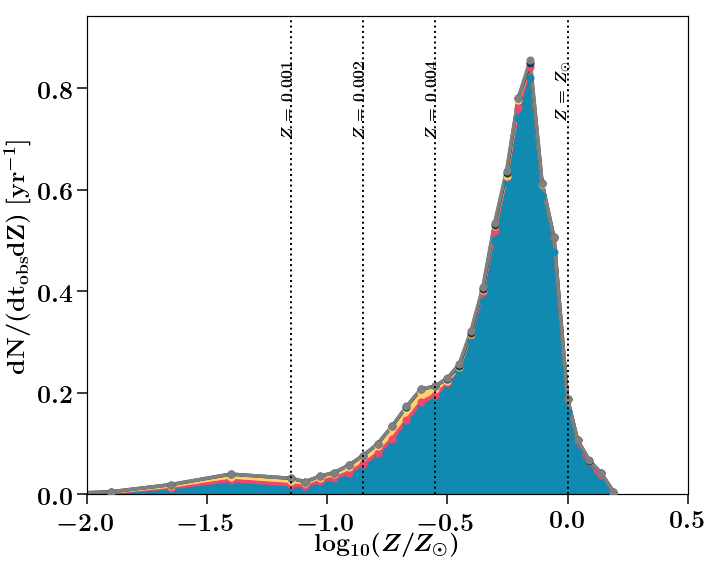

()
[0.00303143 0.00791052 0.0124634 ]
(array([0.21348099, 0.55707887, 0.87770423]), '$\\times Z_{\\odot}$')
$2$


In [130]:
Data=Data_BHNS

f, ax= plt.subplots(ncols=1,nrows=1,figsize=(10,8), 
                  gridspec_kw={"width_ratios":[1.5], "height_ratios":[2]})

ax=plotMetallicitiesScatter(axe=ax, Data=Data, dictChannels=dictChannelsBHNSList, channelSystems=channelSystems_BHNS)



plt.tight_layout()
plt.subplots_adjust(wspace=0.2, hspace=0.2)
plt.savefig('./Metallicities_channels_BHNS.png', dpi=600, transparent=False)
plt.show()
plt.close()



solar=0.0142
print()

weight = np.sum(Data.PerSystemPerRedshift_ratesObserved*Data.COMPAS.weight, axis=0)
print(weighted_quantile(values=Data.COMPAS.metallicitySystems, quantiles=[.10,.50,.90], \
                       sample_weight=weight))
print(weighted_quantile(values=Data.COMPAS.metallicitySystems/solar, quantiles=[.10,.50,.90], \
                       sample_weight=weight), r'$\times Z_{\odot}$')

print(r'$2$')


In [237]:



def plotMetallicitiesScatterLin(axe, Data, dictChannels, channelSystems):
    solar=0.0142
    groups  = dictChannels 
    solar = 0.0142
    axes = [axe]


    
    xvar = Data.COMPAS.metallicitySystems




    weights     = np.sum(Data.PerSystemPerRedshift_ratesObserved*Data.COMPAS.weight, axis=0)

    
    uniqueZ = np.unique(xvar)
    
    #     fig, axes = plt.subplots(1,1,figsize=(16,8))
    yLow        = np.zeros(len(uniqueZ))
    
    for nrG, group in enumerate(groups):
        ratesG = []
        m       = xvar[channelSystems == nrG]
        w       = weights[channelSystems == nrG]
        percentage = np.round((np.sum(w)/float(np.sum(weights)))*100,2)
        
#         uniqueZ = unique(m)
        
        for ind_Z, Z in enumerate(uniqueZ):
            maskZ = (m==Z)
            
            rate = np.sum(w[maskZ])
            ratesG.append(rate)
            
        axe.plot((uniqueZ/solar), ratesG+yLow, c=colorlist[nrG], lw=3.5, \
                 label=dictChannelsBHNSListBolt[nrG]+' '+str(percentage)+'\%')     
        
        axe.scatter((uniqueZ/solar), ratesG+yLow, c=colorlist[nrG], s=50, \
                  zorder=10) 
        axe.fill_between((uniqueZ/solar), yLow, yLow+np.asarray(ratesG), facecolor=colorlist[nrG])

        yLow   += np.asarray(ratesG)

        
        
    # plot Z values for some fixed metallicities
    text_list = [r'$Z=Z_{\odot}$', r'$Z=0.001$', r'$Z=0.004$' , r'$Z=0.002$']
    for zz_ind, zz in enumerate([1., (0.001/solar),\
                                 (0.004/solar), (0.002/solar)]) :
        axe.plot([zz,zz], [0,max(yLow)*1.1], \
                         c='k',\
                         lw=2, alpha=1, linestyle=':', zorder=600)   
        axe.text(zz-0.05, max(yLow)*1, s=text_list[zz_ind], fontsize=fs-8, rotation=90, verticalalignment='top')

                
        
        
        
    axe.set_xlim(0, 1.8)
    axe.set_ylim(0,max(yLow)*1.1)
    nameY = r'$\rm dN /(dt_{obs} dZ) \ [yr^{-1} ]  $'
    nameX = r'$ Z/Z_{\odot} $'

    axe == CV.layoutAxes(axe, nameX=nameX, nameY=nameY)


#     axe.grid(True)
    
  



In [238]:
# linewidth=3.5
# ALPHA=0


# N = nColors
# cmap = plt.cm.plasma  # define the colormap
# # extract all colors from the .jet map
# cmaplist = [cmap(i) for i in range(cmap.N)]
# # force the first color entry to be grey
# mycolors = sns.color_palette("viridis", nColors+1)

# f, ax= plt.subplots(ncols=2,nrows=1,figsize=(20,10), 
#                   gridspec_kw={"width_ratios":[1.5, 1.5], "height_ratios":[2]})
# ax[0]=plotMetallicities(ax[0], nbins=30)
# ax[1]=plotMetallicitiesLIN(ax[1], nbins=30)


# plt.tight_layout()
# plt.subplots_adjust(wspace=0.2, hspace=0.2)
# # plt.savefig('./Metallicities_channels.png', dpi=600, transparent=False)
# plt.show()
# plt.close()




# weight = np.sum(Data.PerSystemPerRedshift_ratesObserved*weightSTROOPWAFEL, axis=0)
# print(weighted_quantile(values=Data.COMPAS.metallicitySystems, quantiles=[.10,.50,.90], \
#                        sample_weight=weight))
# print(weighted_quantile(values=Data.COMPAS.metallicitySystems/solar, quantiles=[.10,.50,.90], \
#                        sample_weight=weight))

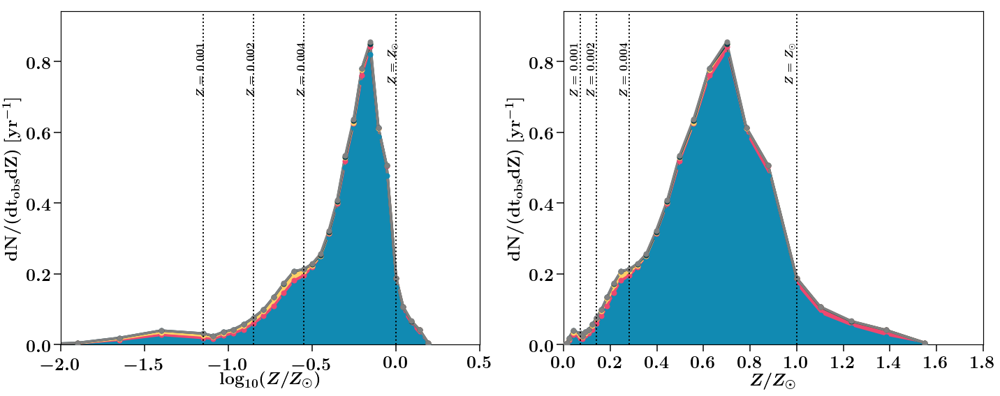

()
[0.00303143 0.00791052 0.0124634 ]
[0.21348099 0.55707887 0.87770423]


In [239]:
Data=Data_BHNS
TYPE ='BHNS'
f, ax= plt.subplots(ncols=2,nrows=1,figsize=(20,8), 
                  gridspec_kw={"width_ratios":[1.5,1.5], "height_ratios":[2]})

ax[0]=plotMetallicitiesScatter(axe=ax[0], Data=Data, dictChannels=dictChannelsBHNSList, channelSystems=channelSystems_BHNS)
ax[1]=plotMetallicitiesScatterLin(axe=ax[1], Data=Data, dictChannels=dictChannelsBHNSList,channelSystems=channelSystems_BHNS)



plt.tight_layout()
plt.subplots_adjust(wspace=0.2, hspace=0.2)
plt.savefig('./Metallicities_channels_' +TYPE+ '.png', dpi=600, transparent=False)
plt.show()
plt.close()



solar=0.0142
print()
weight = np.sum(Data.PerSystemPerRedshift_ratesObserved*Data.COMPAS.weight, axis=0)
print(weighted_quantile(values=Data.COMPAS.metallicitySystems, quantiles=[.10,.50,.90], \
                       sample_weight=weight))
print(weighted_quantile(values=Data.COMPAS.metallicitySystems/solar, quantiles=[.10,.50,.90], \
                       sample_weight=weight))

# Fiducial  BHBH :-) 

In [112]:
#Will only look at BBHs so might as well set everything

TYPE = 'BBH'

minz = 0.
maxz = 2
resz = 200 #200 //floor
sensitivity = 'design'
Data_BHBH = CI.CosmicIntegrator(COMPASpath = pathCOMPASOutput, DCOtypes=TYPE,\
       minRedshift=minz,   maxRedshift=maxz, nrRedshiftBins=resz,\
                           GWdetector_sensitivity=sensitivity,\
                           optimistic=False)


#formation channels
fc = FC.FormationChannels(path = pathCOMPASOutput,verbose=False)

fc.formationChannelsSeeds(seeds=Data_BHBH.COMPAS.seeds, withinHubbleTime=True, optimistic=False)



# SET GROUPS: should gice the unque 5 different groups (4 + "others")
channelSystems_BHBH  = np.ones(len(fc.rankArray)) * -1
for nrC, Channel in enumerate(dictChannelsBBHList):
    subchannel = np.asarray(dictChannelsBBH[Channel]) -1.
#     print subchannel
#     print nrC
    for nrc, nr_subchannel in enumerate(subchannel):

    
        channelSystems_BHBH[(fc.rankArray == nr_subchannel)] =nrC
    
# print(channelSystems_BHBH[(channelSystems_BHBH ==-1.)])
# print((channelSystems_BHBH))
channelSystems_BHBH[(channelSystems_BHBH ==-1.)] =4


print np.unique(channelSystems_BHBH)



# SET MSSFR:
model = 'Preferred'


if model == 'Preferred':
    Data_BHBH.MSSFR.Zprescription         = 'logNormal'
    Data_BHBH.MSSFR.SFRprescription       = 'Neijssel et al. (2019)'
    Data_BHBH.MSSFR.logNormalPrescription = 'Neijssel Phenomenological'

if model =='Barrett':
    Data_BHBH.MSSFR.Zprescription         = 'MZ_GSMF'
    Data_BHBH.MSSFR.SFRprescription       = 'Madau et al. (2014)'
    Data_BHBH.MSSFR.logNormalPrescription = None
    Data_BHBH.MSSFR.GSMFprescription      = 'Panter et al. (2004) Single'
    Data_BHBH.MSSFR.ZMprescription        = 'Langer et al. (2006)'



Data_BHBH.cosmologicalIntegration()






weighted samples :-D
Remember to  self.setCOMPASDCOmask() adag and self.setCOMPASData()
(52190.03630234331, 'sum sorted counts')
[0. 1. 2. 3. 4.]


\textbf{Classic} 24.27\%
\textbf{Only stable mass transfer} 72.31\%
\textbf{Immediate single-core CE } 0.24\%
\textbf{Immediate double-core CE} 0.63\%
\textbf{other} 2.54\%
(array([ 2.68014   , 15.8601    , 19.42457053, 21.99917904, 24.56261583,
       26.94787999, 29.09379222, 32.13736248, 36.13003734, 37.82947829,
       39.543     ]), ' =quant')
('xq =', 15.8601, 0)
('xq =', 19.424570532612762, 1)
('xq =', 21.999179041820746, 2)
('xq =', 24.562615827978146, 3)
('xq =', 26.947879992268536, 4)
('xq =', 29.093792224518605, 5)
('xq =', 32.137362477650946, 6)
('xq =', 36.13003733912231, 7)
('xq =', 37.82947828606309, 8)
filling till end
('ind ', 9)
(array([ 2.67188   , 11.34467405, 15.35061304, 17.18716726, 18.62131729,
       20.11947341, 22.14898143, 25.05513549, 27.40141147, 31.73953769,
       39.5376    ]), ' =quant')
('xq =', 11.344674045054617, 0)
('xq =', 15.350613037523047, 1)
('xq =', 17.18716725753861, 2)
('xq =', 18.621317292539846, 3)
('xq =', 20.11947341060241, 4)
('xq =', 

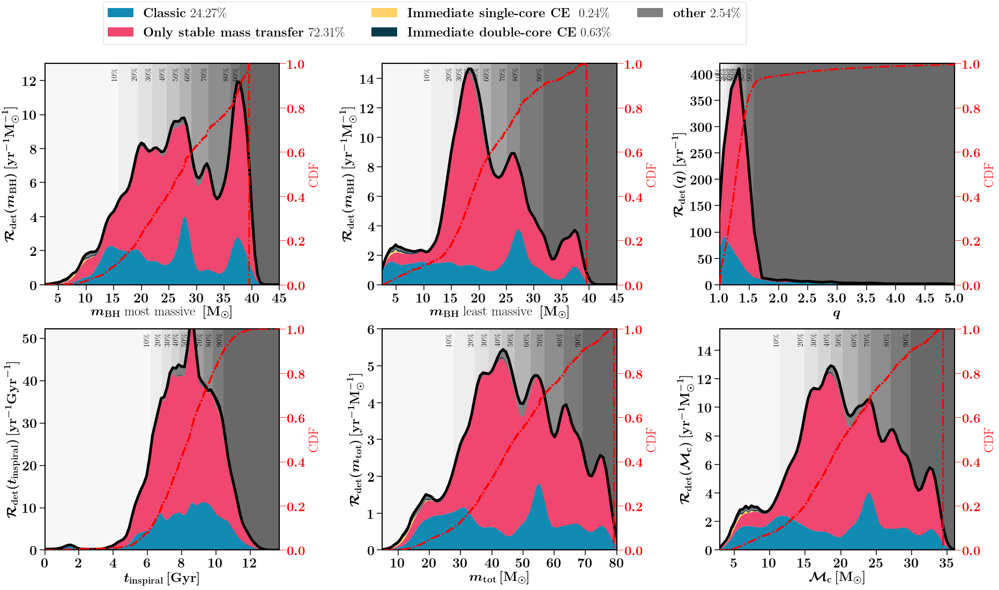

In [229]:


whichWeight ='observed'
    
linewidth=3.5
ALPHA=0
Data=Data_BHBH
TYPE ='BHBH'
f, ax= plt.subplots(ncols=3,nrows=2,figsize=(26,14), 
                  gridspec_kw={"width_ratios":[1.5, 1.5,1.5], "height_ratios":[2,2]})
channelSystems=channelSystems_BHBH

#general
Nbins= .1

####### BH MASS 
M1, M2 = Data_BHBH.COMPAS.mass1, Data_BHBH.COMPAS.mass2
MBH, MNS = obtainM1BHandM2BHassymetric(m1=M1, m2=M2)
xvar = MBH
nameY = r'$ \mathcal{R}_{\rm{det}}(m_{\rm{BH}}) \, [\rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r' $m_{\rm{BH}}$ most massive $ \,  [\rm{M}_{\odot}]$'

handles, labels=plotdesigndistribution(axe=ax[0,0], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None, xlabel=nameX, ylabel=nameY, \
                              xlim=[2.5,45], ylim=[0,13],whichWeight=whichWeight, channelSystems=channelSystems, indplot=0) 


####### NS MASS 
xvar = MNS
nameY = r'$ \mathcal{R}_{\rm{det}}(m_{\rm{BH}}) \, [\rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r'$m_{\rm{BH}}$ least massive  $ \,  [\rm{M}_{\odot}]$ '

_,_=plotdesigndistribution(axe=ax[0,1], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None, xlabel=nameX, ylabel=nameY, \
                              xlim=[2.5,45], ylim=[0,15],whichWeight=whichWeight, channelSystems=channelSystems, indplot=1) 



####### mass ratio
xvar = MBH/MNS
nameY = r'$ \mathcal{R}_{\rm{det}}(q) \, [\rm{yr}^{-1}]  $'
nameX = r'$q$'

_,_=plotdesigndistribution(axe=ax[0,2], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None, xlabel=nameX, ylabel=nameY, \
                              xlim=[1,5], ylim=[0,420],whichWeight=whichWeight, channelSystems=channelSystems, indplot=2) 


######## INSPIRAL TIME
xvar = Data_BHBH.COMPAS.tc / 1000
nameY = r'$ \mathcal{R}_{\rm{det}}(t_{\rm{inspiral}}) \, [\rm{yr}^{-1}  \rm{Gyr}^{-1}]  $'
nameX = r'$t_{\rm{inspiral}} \, [\rm{Gyr}]$'

_,_=plotdesigndistribution(axe=ax[1,0], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None, xlabel=nameX, ylabel=nameY, \
                              xlim=[0,13.7], ylim=[0,52.2],whichWeight=whichWeight, channelSystems=channelSystems, indplot=3) 



####### mass total
xvar = MBH+MNS
nameY = r'$ \mathcal{R}_{\rm{det}}(m_{\rm{tot}}) \, [\rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r'$m_{\rm{tot}} \,  [\rm{M}_{\odot}]$'

_,_=plotdesigndistribution(axe=ax[1,1], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None, xlabel=nameX, ylabel=nameY, \
                              xlim=[5,80], ylim=[0,6.0],whichWeight=whichWeight, channelSystems=channelSystems, indplot=4) 


####### mass chirp
xvar = chirpmass(MBH, MNS)
nameY = r'$ \mathcal{R}_{\rm{det}}(\mathcal{M}_{\rm{c}}) \, [\rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r'$\mathcal{M}_{\rm{c}} \,  [\rm{M}_{\odot}]$'

_,_=plotdesigndistribution(axe=ax[1,2], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None, xlabel=nameX, ylabel=nameY, \
                              xlim=[3,36], ylim=[0,15.5], whichWeight=whichWeight, channelSystems=channelSystems, indplot=5) 

# ###########
# Nbins = 15
# xvar = Data_BHBH.COMPAS.metallicitySystems
# solar=0.0142
# xvar = np.log10(xvar/solar)



# LEGEND
lgd = f.legend(handles, labels, fontsize=fs, ncol=3,\
         bbox_to_anchor=(.75, 1.1),  markerscale=3., scatterpoints=1) # loc = 'upper center')




plt.tight_layout()
plt.subplots_adjust(wspace=0.44, hspace=0.2)
plt.savefig('./DistributionsFiducialchannels_' + whichWeight + '_' + TYPE +'.pdf', transparent=False,\
           bbox_extra_artists=(lgd,), bbox_inches='tight')
plt.savefig('./DistributionsFiducialchannels_' + whichWeight + '_' + TYPE +'.png', transparent=False,\
           bbox_extra_artists=(lgd,), bbox_inches='tight')
plt.show()
plt.close()







\textbf{Classic} 35.83\%
\textbf{Only stable mass transfer} 53.43\%
\textbf{Immediate single-core CE } 2.08\%
\textbf{Immediate double-core CE} 3.97\%
\textbf{other} 4.69\%
(array([ 2.68014   ,  8.35920697, 10.47568877, 12.7686    , 14.4276    ,
       16.96346836, 18.90121134, 22.79429511, 26.80028234, 31.98053964,
       39.543     ]), ' =quant')
('xq =', 8.3592069669067, 0)
('xq =', 10.475688770602021, 1)
('xq =', 12.7686, 2)
('xq =', 14.4276, 3)
('xq =', 16.96346836008121, 4)
('xq =', 18.90121133882514, 5)
('xq =', 22.794295109792458, 6)
('xq =', 26.800282342456377, 7)
('xq =', 31.98053964155564, 8)
filling till end
('ind ', 9)
(array([ 2.67188   ,  3.11564   ,  3.9942796 ,  5.79281357,  7.52557556,
       10.5510832 , 15.01064239, 17.08517289, 20.38626333, 24.27733162,
       39.5376    ]), ' =quant')
('xq =', 3.11564, 0)
('xq =', 3.9942796027569627, 1)
('xq =', 5.792813568180005, 2)
('xq =', 7.525575555251304, 3)
('xq =', 10.551083197031073, 4)
('xq =', 15.010642389334595, 5)
('x

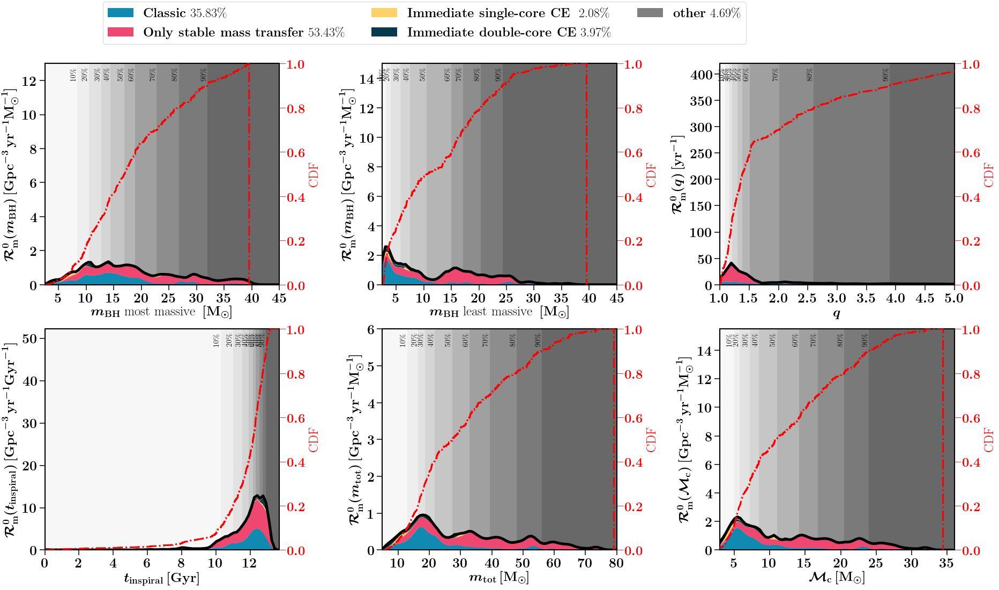

In [230]:


whichWeight ='intrinsic'
    
linewidth=3.5
ALPHA=0
Data=Data_BHBH
TYPE ='BHBH'
f, ax= plt.subplots(ncols=3,nrows=2,figsize=(26,14), 
                  gridspec_kw={"width_ratios":[1.5, 1.5,1.5], "height_ratios":[2,2]})
channelSystems=channelSystems_BHBH

#general
Nbins= .1

####### BH MASS 
M1, M2 = Data_BHBH.COMPAS.mass1, Data_BHBH.COMPAS.mass2
MBH, MNS = obtainM1BHandM2BHassymetric(m1=M1, m2=M2)
xvar = MBH
nameY = r'$ \mathcal{R}_{\rm{m}}^0(m_{\rm{BH}}) \, [\rm{Gpc}^{-3} \, \rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r' $m_{\rm{BH}}$ most massive $ \,  [\rm{M}_{\odot}]$'

handles, labels=plotdesigndistribution(axe=ax[0,0], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None, xlabel=nameX, ylabel=nameY, \
                              xlim=[2.5,45], ylim=[0,13],whichWeight=whichWeight, channelSystems=channelSystems, indplot=0) 


####### NS MASS 
xvar = MNS
nameY = r'$ \mathcal{R}_{\rm{m}}^0(m_{\rm{BH}}) \, [\rm{Gpc}^{-3} \, \rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r'$m_{\rm{BH}}$ least massive  $ \,  [\rm{M}_{\odot}]$ '

_,_=plotdesigndistribution(axe=ax[0,1], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None, xlabel=nameX, ylabel=nameY, \
                              xlim=[2.5,45], ylim=[0,15],whichWeight=whichWeight, channelSystems=channelSystems, indplot=1) 



####### mass ratio
xvar = MBH/MNS
nameY = r'$ \mathcal{R}_{\rm{m}}^0(q) \, [\rm{yr}^{-1}]  $'
nameX = r'$q$'

_,_=plotdesigndistribution(axe=ax[0,2], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None, xlabel=nameX, ylabel=nameY, \
                              xlim=[1,5], ylim=[0,420],whichWeight=whichWeight, channelSystems=channelSystems, indplot=2) 


######## INSPIRAL TIME
xvar = Data_BHBH.COMPAS.tc / 1000
nameY = r'$ \mathcal{R}_{\rm{m}}^0(t_{\rm{inspiral}}) \, [\rm{Gpc}^{-3} \, \rm{yr}^{-1}  \rm{Gyr}^{-1}]  $'
nameX = r'$t_{\rm{inspiral}} \, [\rm{Gyr}]$'

_,_=plotdesigndistribution(axe=ax[1,0], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None, xlabel=nameX, ylabel=nameY, \
                              xlim=[0,13.7], ylim=[0,52.2],whichWeight=whichWeight, channelSystems=channelSystems, indplot=3) 



####### mass total
xvar = MBH+MNS
nameY = r'$ \mathcal{R}_{\rm{m}}^0(m_{\rm{tot}}) \, [\rm{Gpc}^{-3} \, \rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r'$m_{\rm{tot}} \,  [\rm{M}_{\odot}]$'

_,_=plotdesigndistribution(axe=ax[1,1], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None, xlabel=nameX, ylabel=nameY, \
                              xlim=[5,80], ylim=[0,6.0],whichWeight=whichWeight, channelSystems=channelSystems, indplot=4) 


####### mass chirp
xvar = chirpmass(MBH, MNS)
nameY = r'$ \mathcal{R}_{\rm{m}}^0(\mathcal{M}_{\rm{c}}) \, [\rm{Gpc}^{-3} \, \rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r'$\mathcal{M}_{\rm{c}} \,  [\rm{M}_{\odot}]$'

_,_=plotdesigndistribution(axe=ax[1,2], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None, xlabel=nameX, ylabel=nameY, \
                              xlim=[3,36], ylim=[0,15.5], whichWeight=whichWeight, channelSystems=channelSystems, indplot=5) 

# ###########
# Nbins = 15
# xvar = Data_BHBH.COMPAS.metallicitySystems
# solar=0.0142
# xvar = np.log10(xvar/solar)



# LEGEND
lgd = f.legend(handles, labels, fontsize=fs, ncol=3,\
         bbox_to_anchor=(.75, 1.1),  markerscale=3., scatterpoints=1) # loc = 'upper center')




plt.tight_layout()
plt.subplots_adjust(wspace=0.44, hspace=0.2)
plt.savefig('./DistributionsFiducialchannels_' + whichWeight + '_' + TYPE +'.pdf', transparent=False,\
           bbox_extra_artists=(lgd,), bbox_inches='tight')
plt.savefig('./DistributionsFiducialchannels_' + whichWeight + '_' + TYPE +'.png', transparent=False,\
           bbox_extra_artists=(lgd,), bbox_inches='tight')
plt.show()
plt.close()







# METALLICITIES BHBH

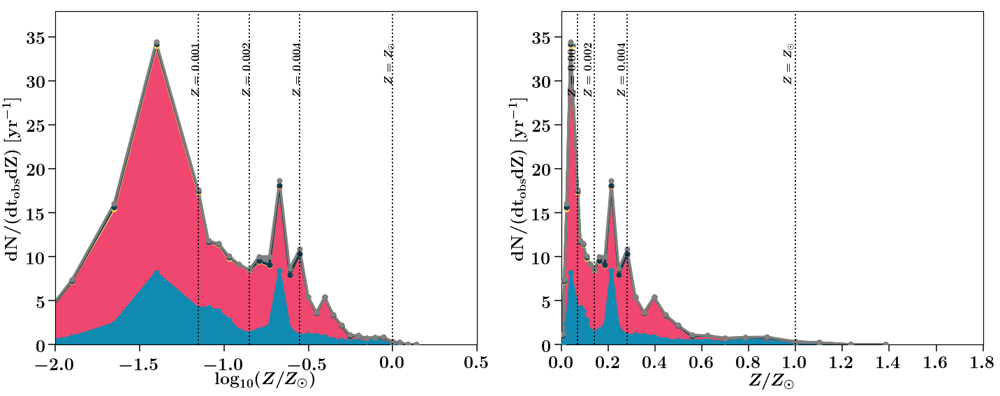

()
[0.00031623 0.00151572 0.00448144]
[0.02226972 0.10674085 0.31559437]


In [240]:
Data=Data_BHBH
TYPE ='BHBH'
f, ax= plt.subplots(ncols=2,nrows=1,figsize=(20,8), 
                  gridspec_kw={"width_ratios":[1.5,1.5], "height_ratios":[2]})

ax[0]=plotMetallicitiesScatter(axe=ax[0], Data=Data, dictChannels=dictChannelsBBH, channelSystems=channelSystems_BHBH)
ax[1]=plotMetallicitiesScatterLin(axe=ax[1], Data=Data, dictChannels=dictChannelsBBH,channelSystems=channelSystems_BHBH)



plt.tight_layout()
plt.subplots_adjust(wspace=0.2, hspace=0.2)
plt.savefig('./Metallicities_channels_' +TYPE+ '.png', dpi=600, transparent=False)
plt.show()
plt.close()



solar=0.0142
print()
weight = np.sum(Data.PerSystemPerRedshift_ratesObserved*Data_BHBH.COMPAS.weight, axis=0)
print(weighted_quantile(values=Data.COMPAS.metallicitySystems, quantiles=[.10,.50,.90], \
                       sample_weight=weight))
print(weighted_quantile(values=Data.COMPAS.metallicitySystems/solar, quantiles=[.10,.50,.90], \
                       sample_weight=weight))

# FIDUCIAL NS-NS :-) 

In [115]:
#Will only look at BBHs so might as well set everything

TYPE = 'BNS'

minz = 0.
maxz = 2
resz = 200 #200 //floor
sensitivity = 'design'
Data_NSNS = CI.CosmicIntegrator(COMPASpath = pathCOMPASOutput, DCOtypes=TYPE,\
       minRedshift=minz,   maxRedshift=maxz, nrRedshiftBins=resz,\
                           GWdetector_sensitivity=sensitivity,\
                           optimistic=False)


#formation channels
fc = FC.FormationChannels(path = pathCOMPASOutput,verbose=False)

fc.formationChannelsSeeds(seeds=Data_NSNS.COMPAS.seeds, withinHubbleTime=True, optimistic=False)



# SET GROUPS: should gice the unque 5 different groups (4 + "others")
channelSystems_NSNS  = np.ones(len(fc.rankArray)) * -1
for nrC, Channel in enumerate(dictChannelsBBHList):
    subchannel = np.asarray(dictChannelsBNS[Channel]) -1.
#     print subchannel
#     print nrC
    for nrc, nr_subchannel in enumerate(subchannel):

    
        channelSystems_NSNS[(fc.rankArray == nr_subchannel)] =nrC
    
# print(channelSystems_NSNS[(channelSystems_NSNS ==-1.)])
# print((channelSystems_NSNS))
channelSystems_NSNS[(channelSystems_NSNS ==-1.)] =4


print np.unique(channelSystems_NSNS)



# SET MSSFR:
model = 'Preferred'


if model == 'Preferred':
    Data_NSNS.MSSFR.Zprescription         = 'logNormal'
    Data_NSNS.MSSFR.SFRprescription       = 'Neijssel et al. (2019)'
    Data_NSNS.MSSFR.logNormalPrescription = 'Neijssel Phenomenological'

if model =='Barrett':
    Data_NSNS.MSSFR.Zprescription         = 'MZ_GSMF'
    Data_NSNS.MSSFR.SFRprescription       = 'Madau et al. (2014)'
    Data_NSNS.MSSFR.logNormalPrescription = None
    Data_NSNS.MSSFR.GSMFprescription      = 'Panter et al. (2004) Single'
    Data_NSNS.MSSFR.ZMprescription        = 'Langer et al. (2006)'



Data_NSNS.cosmologicalIntegration()







weighted samples :-D
Remember to  self.setCOMPASDCOmask() adag and self.setCOMPASData()
(17723.294151464976, 'sum sorted counts')
[0. 3. 4.]


\textbf{Classic} 37.31\%
\textbf{Immediate double-core CE} 60.71\%
\textbf{other} 1.99\%
(array([1.27758   , 1.27758   , 1.2776    , 1.27762   , 1.27764   ,
       1.32075397, 1.38812405, 1.47240192, 1.66228171, 2.04632046,
       2.49999   ]), ' =quant')
('xq =', 1.27758, 0)
('xq =', 1.2776, 1)
('xq =', 1.27762, 2)
('xq =', 1.27764, 3)
('xq =', 1.3207539659580314, 4)
('xq =', 1.3881240497253828, 5)
('xq =', 1.472401921092616, 6)
('xq =', 1.6622817094703104, 7)
('xq =', 2.0463204574509675, 8)
filling till end
('ind ', 9)
()
[1.27767 1.39472 1.2777  ... 1.27763 1.27764 1.28488]
[1.27758 1.27762 1.27758 ... 1.27758 1.27758 1.27758]
()
(array([1.26      , 1.26001   , 1.26003   , 1.27758   , 1.27758   ,
       1.27758   , 1.27758   , 1.2776    , 1.27763   , 1.46078539,
       2.49443   ]), ' =quant')
('xq =', 1.26001, 0)
('xq =', 1.26003, 1)
('xq =', 1.27758, 2)
('xq =', 1.27758, 3)
('xq =', 1.27758, 4)
('xq =', 1.27758, 5)
('xq =', 1.2776, 6)
('xq =', 1.27763, 7)
('xq =', 1.46078538512770

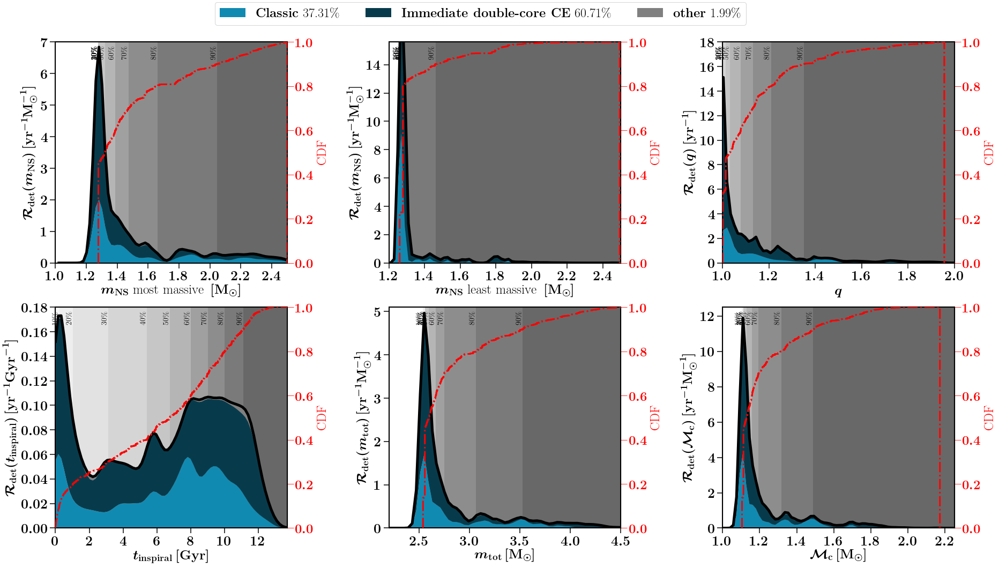

In [231]:

# BNS 
Data=Data_NSNS
dictChannelsList = ['classic',  'double-core CE', 'other']    
TYPE='NSNS'
whichWeight='observed'
linewidth=3.5
ALPHA=0
channelSystems=channelSystems_NSNS

f, ax= plt.subplots(ncols=3,nrows=2,figsize=(26,14), 
                  gridspec_kw={"width_ratios":[1.5, 1.5,1.5], "height_ratios":[2,2]})

#general
Nbins= .10 #.05#50 #.1 #50




####### BH MASS 
M1, M2 = Data_NSNS.COMPAS.mass1, Data_NSNS.COMPAS.mass2
MBH, MNS = obtainM1BHandM2BHassymetric(m1=M1, m2=M2)
xvar = MBH
nameY = r'$ \mathcal{R}_{\rm{det}}(m_{\rm{NS}}) \, [\rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r' $m_{\rm{NS}}$ most massive $ \,  [\rm{M}_{\odot}]$'

handles, labels=plotdesigndistribution(axe=ax[0,0], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None, xlabel=nameX, ylabel=nameY, \
                              xlim=[1,2.5], ylim=[0,7], whichWeight=whichWeight, channelSystems=channelSystems, indplot=0) 

print()
print(MBH)
print(MNS)
print()
####### NS MASS 
xvar = MNS
nameY = r'$ \mathcal{R}_{\rm{det}}(m_{\rm{NS}}) \, [\rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r'$m_{\rm{NS}}$ least massive  $ \,  [\rm{M}_{\odot}]$ '

_,_=plotdesigndistribution(axe=ax[0,1], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None, xlabel=nameX, ylabel=nameY, \
                              xlim=[1.2,2.5], ylim=[0,15.6], whichWeight=whichWeight, channelSystems=channelSystems, indplot=1) 




####### mass ratio
xvar = MBH/MNS
nameY = r'$ \mathcal{R}_{\rm{det}}(q) \, [\rm{yr}^{-1}]  $'
nameX = r'$q$'

_,_=plotdesigndistribution(axe=ax[0,2], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None, xlabel=nameX, ylabel=nameY, \
                              xlim=[1,2], ylim=[0,18], whichWeight=whichWeight, channelSystems=channelSystems, indplot=2) 

######## INSPIRAL TIME
xvar = Data_NSNS.COMPAS.tc / 1000
nameY = r'$ \mathcal{R}_{\rm{det}}(t_{\rm{inspiral}}) \, [\rm{yr}^{-1}  \rm{Gyr}^{-1}]  $'
nameX = r'$t_{\rm{inspiral}} \, [\rm{Gyr}]$'

_,_=plotdesigndistribution(axe=ax[1,0], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None, xlabel=nameX, ylabel=nameY, \
                              xlim=[0,13.7], ylim=[0,.18], whichWeight=whichWeight, channelSystems=channelSystems, indplot=3) 




####### mass total
xvar = MBH+MNS
nameY = r'$ \mathcal{R}_{\rm{det}}(m_{\rm{tot}}) \, [\rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r'$m_{\rm{tot}} \,  [\rm{M}_{\odot}]$'

_,_=plotdesigndistribution(axe=ax[1,1], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None, xlabel=nameX, ylabel=nameY, \
                              xlim=[2.2,4.5], ylim=[0,5.1], whichWeight=whichWeight, channelSystems=channelSystems, indplot=4) 


####### mass chirp
xvar = chirpmass(MBH, MNS)
nameY = r'$ \mathcal{R}_{\rm{det}}(\mathcal{M}_{\rm{c}}) \, [\rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r'$\mathcal{M}_{\rm{c}} \,  [\rm{M}_{\odot}]$'

_,_=plotdesigndistribution(axe=ax[1,2], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None, xlabel=nameX, ylabel=nameY, \
                              xlim=[1.,2.25], ylim=[0,12.5], whichWeight=whichWeight, channelSystems=channelSystems, indplot=5) 

# ###########


# LEGEND
lgd = f.legend(handles, labels, fontsize=fs, ncol=3,\
         bbox_to_anchor=(.75, 1.06),  markerscale=3., scatterpoints=1) # loc = 'upper center')




plt.tight_layout()
plt.subplots_adjust(wspace=0.44, hspace=0.2)
plt.savefig('./DistributionsFiducialchannels_' + whichWeight + '_' + TYPE +'.pdf', transparent=False,\
           bbox_extra_artists=(lgd,), bbox_inches='tight')
plt.savefig('./DistributionsFiducialchannels_' + whichWeight + '_' + TYPE +'.png', transparent=False,\
           bbox_extra_artists=(lgd,), bbox_inches='tight')
plt.show()
plt.close()







\textbf{Classic} 37.14\%
\textbf{Immediate double-core CE} 61.0\%
\textbf{other} 1.86\%
(array([1.27758   , 1.27758   , 1.2776    , 1.27761   , 1.27763   ,
       1.27768   , 1.33239442, 1.40195   , 1.48277682, 1.79142985,
       2.49999   ]), ' =quant')
('xq =', 1.27758, 0)
('xq =', 1.2776, 1)
('xq =', 1.27761, 2)
('xq =', 1.27763, 3)
('xq =', 1.27768, 4)
('xq =', 1.3323944230495455, 5)
('xq =', 1.40195, 6)
('xq =', 1.4827768211192414, 7)
('xq =', 1.7914298549638443, 8)
filling till end
('ind ', 9)
()
[1.27767 1.39472 1.2777  ... 1.27763 1.27764 1.28488]
[1.27758 1.27762 1.27758 ... 1.27758 1.27758 1.27758]
()
(array([1.26     , 1.26001  , 1.26002  , 1.27758  , 1.27758  , 1.27758  ,
       1.27758  , 1.27758  , 1.2776   , 1.3167611, 2.49443  ]), ' =quant')
('xq =', 1.26001, 0)
('xq =', 1.26002, 1)
('xq =', 1.27758, 2)
('xq =', 1.27758, 3)
('xq =', 1.27758, 4)
('xq =', 1.27758, 5)
('xq =', 1.27758, 6)
('xq =', 1.2776, 7)
('xq =', 1.3167610954439628, 8)
filling till end
('ind ', 9)
(arr

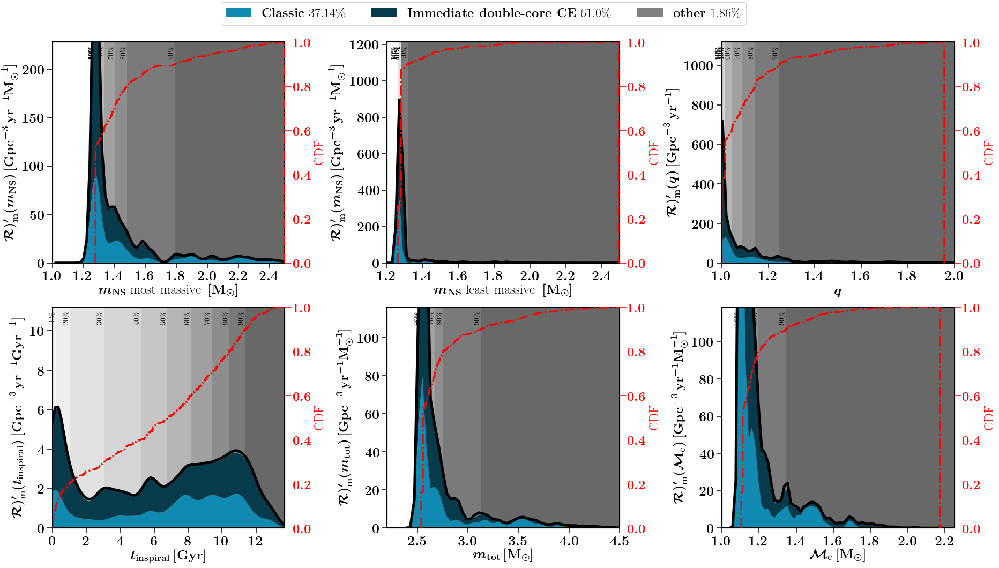

In [232]:

# BNS 
Data=Data_NSNS
dictChannelsList = ['classic',  'double-core CE', 'other']    
TYPE='NSNS'
whichWeight ='intrinsic'
linewidth=3.5
ALPHA=0
channelSystems=channelSystems_NSNS

f, ax= plt.subplots(ncols=3,nrows=2,figsize=(26,14), 
                  gridspec_kw={"width_ratios":[1.5, 1.5,1.5], "height_ratios":[2,2]})

#general
Nbins= .10 #.05#50 #.1 #50




####### BH MASS 
M1, M2 = Data_NSNS.COMPAS.mass1, Data_NSNS.COMPAS.mass2
MBH, MNS = obtainM1BHandM2BHassymetric(m1=M1, m2=M2)
xvar = MBH
nameY = r'$ \mathcal{R)_{\rm{m}}^0}(m_{\rm{NS}}) \, [\rm{Gpc}^{-3} \,  \rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r' $m_{\rm{NS}}$ most massive $ \,  [\rm{M}_{\odot}]$'

handles, labels=plotdesigndistribution(axe=ax[0,0], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None, xlabel=nameX, ylabel=nameY, \
                              xlim=[1,2.5], ylim=[0,228], whichWeight=whichWeight, channelSystems=channelSystems, indplot=0) 

print()
print(MBH)
print(MNS)
print()
####### NS MASS 
xvar = MNS
nameY = r'$ \mathcal{R)_{\rm{m}}^0}(m_{\rm{NS}}) \, [\rm{Gpc}^{-3} \,  \rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r'$m_{\rm{NS}}$ least massive  $ \,  [\rm{M}_{\odot}]$ '

_,_=plotdesigndistribution(axe=ax[0,1], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None, xlabel=nameX, ylabel=nameY, \
                              xlim=[1.2,2.5], ylim=[0,1212.6], whichWeight=whichWeight, channelSystems=channelSystems, indplot=1) 




####### mass ratio
xvar = MBH/MNS
nameY = r'$ \mathcal{R)_{\rm{m}}^0}(q) \, [\rm{Gpc}^{-3} \,  \rm{yr}^{-1}]  $'
nameX = r'$q$'

_,_=plotdesigndistribution(axe=ax[0,2], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None, xlabel=nameX, ylabel=nameY, \
                              xlim=[1,2], ylim=[0,1118], whichWeight=whichWeight, channelSystems=channelSystems, indplot=2) 

######## INSPIRAL TIME
xvar = Data_NSNS.COMPAS.tc / 1000
nameY = r'$ \mathcal{R)_{\rm{m}}^0}(t_{\rm{inspiral}}) \, [\rm{Gpc}^{-3} \,  \rm{yr}^{-1}  \rm{Gyr}^{-1}]  $'
nameX = r'$t_{\rm{inspiral}} \, [\rm{Gyr}]$'

_,_=plotdesigndistribution(axe=ax[1,0], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None, xlabel=nameX, ylabel=nameY, \
                              xlim=[0,13.7], ylim=[0,11.2], whichWeight=whichWeight, channelSystems=channelSystems, indplot=3) 




####### mass total
xvar = MBH+MNS
nameY = r'$ \mathcal{R)_{\rm{m}}^0}(m_{\rm{tot}}) \, [\rm{Gpc}^{-3} \,  \rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r'$m_{\rm{tot}} \,  [\rm{M}_{\odot}]$'

_,_=plotdesigndistribution(axe=ax[1,1], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None, xlabel=nameX, ylabel=nameY, \
                              xlim=[2.2,4.5], ylim=[0,116.0], whichWeight=whichWeight, channelSystems=channelSystems, indplot=4) 


####### mass chirp
xvar = chirpmass(MBH, MNS)
nameY = r'$ \mathcal{R)_{\rm{m}}^0}(\mathcal{M}_{\rm{c}}) \, [\rm{Gpc}^{-3} \,  \rm{yr}^{-1}  \rm{M}_{\odot}^{-1}]  $'
nameX = r'$\mathcal{M}_{\rm{c}} \,  [\rm{M}_{\odot}]$'

_,_=plotdesigndistribution(axe=ax[1,2], Data=Data, xvar=xvar, bandwidth=Nbins, xvarrange=None, xlabel=nameX, ylabel=nameY, \
                              xlim=[1.,2.25], ylim=[0,118.5], whichWeight=whichWeight, channelSystems=channelSystems, indplot=5) 

# ###########


# LEGEND
lgd = f.legend(handles, labels, fontsize=fs, ncol=3,\
         bbox_to_anchor=(.75, 1.06),  markerscale=3., scatterpoints=1) # loc = 'upper center')




plt.tight_layout()
plt.subplots_adjust(wspace=0.44, hspace=0.2)
plt.savefig('./DistributionsFiducialchannels_' + whichWeight + '_' + TYPE +'.pdf', transparent=False,\
           bbox_extra_artists=(lgd,), bbox_inches='tight')
plt.savefig('./DistributionsFiducialchannels_' + whichWeight + '_' + TYPE +'.png', transparent=False,\
           bbox_extra_artists=(lgd,), bbox_inches='tight')
plt.show()
plt.close()







# METALLICITIES BNS

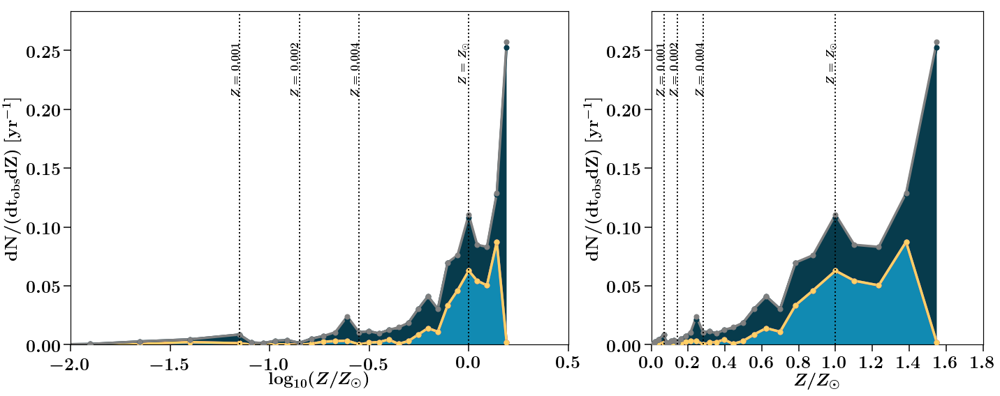

()
[0.00502082 0.0156441  0.022     ]
[0.35357887 1.10169718 1.54929577]


In [241]:
Data=Data_NSNS
TYPE ='NSNS'
f, ax= plt.subplots(ncols=2,nrows=1,figsize=(20,8), 
                  gridspec_kw={"width_ratios":[1.5,1.], "height_ratios":[2]})
# axe, Data, dictChannels, channelSystems
ax[0]=plotMetallicitiesScatter(axe=ax[0], Data=Data, dictChannels=dictChannelsBNS, channelSystems=channelSystems_NSNS)
ax[1]=plotMetallicitiesScatterLin(axe=ax[1], Data=Data, dictChannels=dictChannelsBNS, channelSystems=channelSystems_NSNS)



plt.tight_layout()
plt.subplots_adjust(wspace=0.2, hspace=0.2)
plt.savefig('./Metallicities_channels_' +TYPE+ '.png', dpi=600, transparent=False)
plt.show()
plt.close()



solar=0.0142
print()
weight = np.sum(Data.PerSystemPerRedshift_ratesObserved*Data_NSNS.COMPAS.weight, axis=0)
print(weighted_quantile(values=Data.COMPAS.metallicitySystems, quantiles=[.10,.50,.90], \
                       sample_weight=weight))
print(weighted_quantile(values=Data.COMPAS.metallicitySystems/solar, quantiles=[.10,.50,.90], \
                       sample_weight=weight))